In [1]:
import pandas as pd
import pickle
from sklearn.neighbors import NearestNeighbors
import numpy as np
from tqdm import tqdm
import seaborn as sns
from sklearn.preprocessing import MultiLabelBinarizer
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
sns.set(font_scale = 1, style = 'darkgrid', rc={'figure.figsize':(7,5)})

In [2]:
#load dfs
researchers = pd.read_pickle("Files/Dataframes/researchers.pkl") 
sponsUnitResearchers = pd.read_pickle("Files/Dataframes/researchers_sponsoringUnits.pkl")

#load list with known sponsoring units from APS
with open('Files/knownDivisions.pkl', 'rb') as f:
    divisions = pickle.load(f)

## One-hot encoding

In [3]:
#get sponsoring units, and remove None and Unknown
#sponsoringUnits = sponsUnitResearchers.SponsoringUnits_all.unique().tolist()
#sponsoringUnits
#sponsoringUnits.remove('None')
#sponsoringUnits.remove('Unknown')
#sponsoringUnits.remove('and')

#sponsoringUnits
#remove and


#only use known divisions

In [4]:
#all sponsoring units in list, aggregate when it is same SearchName, Year and SessionType
#keep Seniority, CumulativePaperCount and Productivity as well
researchers_allSponUnit = sponsUnitResearchers.groupby(['SearchName', 'Year', 'SessionType'], as_index=False).agg({'SponsoringUnits_all': list, 'Seniority': 'first', 'CumulativePaperCount': 'first', 'Productivity': 'first', 'Gender': 'first'}).rename(columns = {'AssignedSponsoringUnit': 'SponsoringUnits_all'})

In [5]:
#one-hot encoding
mlb = MultiLabelBinarizer(sparse_output=True)

oneHot = researchers_allSponUnit.join(pd.DataFrame.sparse.from_spmatrix(
    mlb.fit_transform(researchers_allSponUnit.pop('SponsoringUnits_all')),
    index = researchers_allSponUnit.index, 
    columns = mlb.classes_))

In [20]:
#select columns 
cols = list(researchers_allSponUnit.columns) #continous variables 
oneHot_cols = list(set(oneHot.columns) & set(divisions)) #sponsoring units that is one-hot encoded
cols += oneHot_cols #all variables 

In [21]:
#df with researcher with one-hot encoded sponsoring units
oneHot_researchers = oneHot[cols]

In [22]:
#columns for KNN
allCols = oneHot_cols
allCols += ['Seniority', 'CumulativePaperCount', 'Productivity']

In [23]:
#save df
oneHot_researchers.to_pickle("Files/Dataframes/researchers_oneHot.pkl")
#allCols

In [24]:
#save allCols list
with open('Files/KNN_cols', 'wb') as f:
    pickle.dump(allCols, f)

## Functions

In [29]:
def standardizeColumn(df, columnName):
    standardizedColumn = (df[columnName] - df[columnName].mean())/(df[columnName].std())
    
    return standardizedColumn

In [30]:
def KNN(df, groupFeature, groups, K, distanceMetric, oneHotFeatures_n, standardizeFeatures_n, allFeatures):
    group1 = df[df[groupFeature] == groups[0]].reset_index(drop = True)
    group2 = df[df[groupFeature] == groups[1]].reset_index(drop = True)
    
    oneHot_weight = np.repeat(1/oneHotFeatures_n, oneHotFeatures_n) #weight for one-hot encoded features
    other_weight = np.repeat(1, standardizeFeatures_n) #weight for the other features
    weights = np.hstack((oneHot_weight, other_weight)) 
    
    if distanceMetric == 'minkowski':
        neighbors = NearestNeighbors(n_neighbors=K, algorithm='brute', metric='minkowski', p = 1.5, metric_params={'w': weights}, n_jobs = -1).fit(group1[allFeatures].to_numpy())
    elif distanceMetric == 'euclidean':
        neighbors = NearestNeighbors(n_neighbors=K, algorithm='brute', metric='minkowski', p = 2, metric_params={'w': weights}, n_jobs = -1).fit(group1[allFeatures].to_numpy())
    elif distanceMetric == 'manhattan':
        neighbors = NearestNeighbors(n_neighbors=K, algorithm='brute', metric='minkowski', p = 1, metric_params={'w': weights}, n_jobs = -1).fit(group1[allFeatures].to_numpy())
    kNeighbor_dist, kNeighbor_ind = neighbors.kneighbors(group2[allFeatures].to_numpy())
    
    indices = kNeighbor_ind.copy().astype(float)

    return kNeighbor_dist, indices, group1, group2

In [31]:
def KNN_changeFeatures(df, groupFeature, groups, K, distanceMetric, oneHotFeatures_n, standardizeFeatures_n, allFeatures):
    group1 = df[df[groupFeature] == groups[0]].reset_index(drop = True)
    group2 = df[df[groupFeature] == groups[1]].reset_index(drop = True)
    
    if oneHotFeatures_n > 0:
        oneHot_weight = np.repeat(1/oneHotFeatures_n, oneHotFeatures_n) #weight for one-hot encoded features
        other_weight = np.repeat(1, standardizeFeatures_n) #weight for the other features
        weights = np.hstack((oneHot_weight, other_weight)) 
    else:
        weights =  np.repeat(1, standardizeFeatures_n) #weight for the other features
    
    if distanceMetric == 'minkowski':
        neighbors = NearestNeighbors(n_neighbors=K, algorithm='brute', metric='minkowski', p = 1.5, metric_params={'w': weights}, n_jobs = -1).fit(group1[allFeatures].to_numpy())
    elif distanceMetric == 'euclidean':
        neighbors = NearestNeighbors(n_neighbors=K, algorithm='brute', metric='minkowski', p = 2, metric_params={'w': weights}, n_jobs = -1).fit(group1[allFeatures].to_numpy())
    elif distanceMetric == 'manhattan':
        neighbors = NearestNeighbors(n_neighbors=K, algorithm='brute', metric='minkowski', p = 1, metric_params={'w': weights}, n_jobs = -1).fit(group1[allFeatures].to_numpy())
    kNeighbor_dist, kNeighbor_ind = neighbors.kneighbors(group2[allFeatures].to_numpy())
    
    indices = kNeighbor_ind.copy().astype(float)

    return kNeighbor_dist, indices, group1, group2


In [32]:
def getDistances(df, K, distanceMetric, allFeatures, q):
    distanceDict = {}
    
    researchers = df.copy()
    standardizeFeatures = ['Seniority', 'CumulativePaperCount', 'Productivity']
    n_oneHotFeatures = len(allFeatures) -  len(standardizeFeatures) #number of features from one-hot encoding
    
    
    for c in standardizeFeatures:
        researchers[c] = standardizeColumn(researchers, c) #standardize data
    
    yearList = np.sort(researchers.Year.unique())
    for y in yearList:
        year_df = researchers[researchers.Year == y] #filter by year
        distances, indices, females, males = KNN(year_df, 'Gender', ['Female', 'Male'], K, distanceMetric, n_oneHotFeatures, len(standardizeFeatures), allFeatures)
        
        threshold = np.quantile(distances.flatten(), q) #q quantile
        indices[~(distances <= threshold)] = np.nan #set indices to nan if their distance is higher than the threshold
        
        distanceDict[y] = {'Distances': distances, 'Threshold': threshold}
    return distanceDict   

In [33]:
def plotYearlyDistance(dict_, metric, K):
    Years = dict_.keys()
    for y in Years:
        distance = dict_[y]['Distances'].flatten()
        threshold = dict_[y]['Threshold']
        df = pd.DataFrame(distance, columns = ['Distance'])
        sns.histplot(df, x = 'Distance', stat = 'proportion')
        plt.axvline(x = threshold, color = 'black', linewidth = 1.3, label = "Distance threshold: " + "{:.2f}".format(threshold)).set_linestyle("--")
        plt.legend()
        plt.xscale('log')
        plt.yscale('log')
        plt.savefig('Figures/KNN_distance_' + metric + str(y) + "_K_" + str(K) + '.png', bbox_inches='tight')
        plt.show()

In [34]:
def getRatio(indices, df1, df2, suffixes, feature): #df1 is females/attendees, df2 is males/invited
    similarResearchers_df = pd.DataFrame(data = df2[feature]) #group 2
    index_rand = [np.random.choice(i, 1)[0] for i in indices] #randomly select index for each row
    similarResearchers_df['SimilarIndex'] = index_rand #create column with the random similar indices
    similarResearchers_df = similarResearchers_df.dropna(subset = 'SimilarIndex') #drop rows where the researchers are not similar enough
    similar = df1.iloc[similarResearchers_df.SimilarIndex][[feature]] #the random selected similar researchers
    similarResearchers = pd.merge(similarResearchers_df, similar, left_on = 'SimilarIndex', right_on = similar.index, how = 'inner', suffixes=(suffixes[1], suffixes[0]))
    
    #calculate ratio
    g1_ratio = similarResearchers[feature + suffixes[0]].value_counts(normalize = True)
    g2_ratio = similarResearchers[feature + suffixes[1]].value_counts(normalize = True)
    
    return g1_ratio, g2_ratio

In [343]:
#get ratio, but for all within threshold(not a randomly chosen researcher)
def getRatio_all(feature, suffix, indices, df1, df2):
    neighbor_df = pd.DataFrame() 
    neighbor_df[feature + suffix] = df2[feature] #feature of group2 
#    neighbor_df['PotentialSpeaker_index'] = indices.tolist() #index of potential speakers
    neighbor_df['SimilarIndex'] = indices.tolist() #index of similar researchers(from group 1)
    neighbor_index = neighbor_df.explode('SimilarIndex').dropna() #get row per similar researcher from group 1 + drop NaN
    neighbor_index['SimilarIndex'] = neighbor_index.SimilarIndex.astype(int) #index as integer
    neighbor_index = neighbor_index.reset_index().rename(columns = {'index': 'g2Index'})
    group1_feature = df1[[feature]] #feature of group1
    
    similarMatch = pd.merge(neighbor_index, group1_feature, left_on = 'SimilarIndex', right_on = group1_feature.index, how = 'inner') #get feature of group1
    
    return similarMatch

In [318]:
def getRatio_potentialSpeakers(genderMatch, df2):
    #neighbor_df = pd.DataFrame() 
    #neighbor_df['Gender_inv'] = df2['Gender'] #gender of invited speakers
    #neighbor_df['PotentialSpeaker_index'] = indices.tolist() #index of potential speakers
    #neighbor_index = neighbor_df.explode('PotentialSpeaker_index').dropna() #get row per potential speaker + drop NaN
    #neighbor_index['PotentialSpeaker_index'] = neighbor_index.PotentialSpeaker_index.astype(int)
    #group1_gender = df1[['Gender']] #gender of attendees
    
    #genderMatch = pd.merge(neighbor_index, group1_gender, left_on = 'PotentialSpeaker_index', right_on = group1_gender.index, how = 'inner') #get gender of potential speakers
    
    potentialFemales_ratio = genderMatch.Gender.value_counts(normalize = True)['Female'] #ratio of potential female speakers
    potentialMales_ratio = genderMatch.Gender.value_counts(normalize = True)['Male'] #ratio of potential male speakers
    femaleSpeakers_ratio = len(df2[df2.Gender == 'Female'])/len(df2)
    maleSpeakers_ratio = len(df2[df2.Gender == 'Male'])/len(df2)
    
    genderMatch['GenderMatch'] = genderMatch.Gender_inv + ", " + genderMatch.Gender #get column with match of invited speaker and potential speaker
    femaleMatches = len(genderMatch[genderMatch.Gender_inv == 'Female']) #female matches(invited females x number of neighbors)
    maleMatches = len(genderMatch[genderMatch.Gender_inv == 'Male']) #male matches(invited males x number of neighbors)
    
    genderCount = genderMatch.groupby('GenderMatch').size().reset_index().rename(columns = {0: 'Count'}) #count of gender relations
    genderRelation_list  = genderMatch.GenderMatch.unique().tolist()  #list with gender relations
    genderRelation_dict = {}
    for i in genderRelation_list: #create dict with gender relation and number of matches
        if i.startswith('Female'):
            genderRelation_dict [i] = femaleMatches
        else:
            genderRelation_dict [i] = maleMatches

    genderRelation_df = pd.DataFrame.from_dict(genderRelation_dict , orient='index', columns = ['Total']) #df with female/male matches assigned to gender relation
    
    #create df with ratio for gender relation
    genderRelation = pd.merge(genderCount, genderRelation_df, left_on = 'GenderMatch', right_on = genderRelation_df.index, how = 'inner') #get gender of potential speakers
    genderRelation['Ratio'] = genderRelation['Count']/genderRelation['Total']
    
    relationRatio = dict(zip(genderRelation.GenderMatch,genderRelation.Ratio)) #ratio for each gender relationship
    
    return potentialFemales_ratio, potentialMales_ratio, femaleSpeakers_ratio, maleSpeakers_ratio, relationRatio

In [35]:
#old- delete
def getRatio_potentialSpeakers(indices, df1, df2):
    #neighbor_df = pd.DataFrame() 
    #neighbor_df['Gender_inv'] = df2['Gender'] #gender of invited speakers
    #neighbor_df['PotentialSpeaker_index'] = indices.tolist() #index of potential speakers
    #neighbor_index = neighbor_df.explode('PotentialSpeaker_index').dropna() #get row per potential speaker + drop NaN
    #neighbor_index['PotentialSpeaker_index'] = neighbor_index.PotentialSpeaker_index.astype(int)
    #group1_gender = df1[['Gender']] #gender of attendees
    
    #genderMatch = pd.merge(neighbor_index, group1_gender, left_on = 'PotentialSpeaker_index', right_on = group1_gender.index, how = 'inner') #get gender of potential speakers
    
    potentialFemales_ratio = genderMatch.Gender.value_counts(normalize = True)['Female'] #ratio of potential female speakers
    potentialMales_ratio = genderMatch.Gender.value_counts(normalize = True)['Male'] #ratio of potential male speakers
    femaleSpeakers_ratio = len(df2[df2.Gender == 'Female'])/len(df2)
    maleSpeakers_ratio = len(df2[df2.Gender == 'Male'])/len(df2)
    
    genderMatch['GenderMatch'] = genderMatch.Gender_inv + ", " + genderMatch.Gender #get column with match of invited speaker and potential speaker
    femaleMatches = len(genderMatch[genderMatch.Gender_inv == 'Female']) #female matches(invited females x number of neighbors)
    maleMatches = len(genderMatch[genderMatch.Gender_inv == 'Male']) #male matches(invited males x number of neighbors)
    
    genderCount = genderMatch.groupby('GenderMatch').size().reset_index().rename(columns = {0: 'Count'}) #count of gender relations
    genderRelation_list  = genderMatch.GenderMatch.unique().tolist()  #list with gender relations
    genderRelation_dict = {}
    for i in genderRelation_list: #create dict with gender relation and number of matches
        if i.startswith('Female'):
            genderRelation_dict [i] = femaleMatches
        else:
            genderRelation_dict [i] = maleMatches

    genderRelation_df = pd.DataFrame.from_dict(genderRelation_dict , orient='index', columns = ['Total']) #df with female/male matches assigned to gender relation
    
    #create df with ratio for gender relation
    genderRelation = pd.merge(genderCount, genderRelation_df, left_on = 'GenderMatch', right_on = genderRelation_df.index, how = 'inner') #get gender of potential speakers
    genderRelation['Ratio'] = genderRelation['Count']/genderRelation['Total']
    
    relationRatio = dict(zip(genderRelation.GenderMatch,genderRelation.Ratio)) #ratio for each gender relationship
    
    return potentialFemales_ratio, potentialMales_ratio, femaleSpeakers_ratio, maleSpeakers_ratio, relationRatio

In [672]:
def likelihood(ratio_group1, ratio_group2, feature):

    if feature in ratio_group1.index:
        group1_p = ratio_group1.loc[feature]
    else:
        group1_p = 0
        
    if feature in ratio_group2.index:
        group2_p = ratio_group2.loc[feature]
    else:
        group2_p = 0
    
    #if group1_p == 0:
     #   likelihood_n = 0
    #else:
    #if (group1_p + group2_p) == 0:
    #    print("error")
    #likelihood_n = group1_p/(group1_p + group2_p)
    try:
        likelihood_n = group1_p/group2_p
    except:
        print(group1_p, group2_p)
        likelihood_n = "error"
    
    return likelihood_n

In [37]:
def getStats_likelihood(df, parameter):
    avg = df.groupby([parameter, 'Year']).mean()['Likelihood'].reset_index().rename(columns = {'Likelihood': 'Avg_likelihood'})
    std = df.groupby([parameter, 'Year']).std()['Likelihood'].reset_index().rename(columns = {'Likelihood': 'STD_likelihood'})
    sem = df.groupby([parameter, 'Year']).sem()['Likelihood'].reset_index().rename(columns = {'Likelihood': 'SEM_likelihood'})

    stats_df = avg.merge(std, how = 'inner', on = [parameter, 'Year'])
    stats_df = stats_df.merge(sem, how = 'inner', on = [parameter, 'Year'])
    
    return stats_df

In [628]:
def likelihoodEvolution(df, allFeatures, K, groupFeature, groups, distanceMetric, Q, N, suffixes):
    researchers = df.copy()
    standardizeFeatures = ['Seniority', 'CumulativePaperCount', 'Productivity']
    n_oneHotFeatures = len(allFeatures) -  len(standardizeFeatures) #number of features from one-hot encoding
    resultDict = {}
    genderRelation_dict = {}
    index = 0
    
    for c in standardizeFeatures:
        researchers[c] = standardizeColumn(researchers, c) #standardize data
    
    yearList = np.sort(researchers.Year.unique())
    for k in tqdm(K):
        for q in tqdm(Q):
            for y in yearList:
                year_df = researchers[researchers.Year == y] #filter by year
                if groupFeature == 'Gender': #for comparing invited wrt. gender
                    analysisFeature = 'SessionType'
                    distances, indices, group1, group2 = KNN(year_df, groupFeature, groups, k, distanceMetric, n_oneHotFeatures, len(standardizeFeatures), allFeatures) #do KNN
                    threshold = np.quantile(distances.flatten(), q) #q quantile
                    indices[~(distances <= threshold)] = np.nan #set indices to nan if their distance is higher than the threshold
                     #calculate likelihood
                        
                    for n in range(0,N):
                        ratio1, ratio2 = getRatio(indices, group1, group2, suffixes, analysisFeature)
                        lh = likelihood(ratio1, ratio2, 'invited')
                        resultDict[index] = {'K': k, 'q': q, 'Year': y, 'Iteration': n, 'Likelihood': lh}
                        index += 1
                        
                elif groupFeature == 'SessionType': #for finding potential speakers
                    analysisFeature = 'Gender'
                    distances, indices, group1, group2 = KNN(year_df, groupFeature, groups, k, distanceMetric, n_oneHotFeatures, len(standardizeFeatures), allFeatures) #do KNN
                    threshold = np.quantile(distances.flatten(), q) #q quantile
                    indices[~(distances <= threshold)] = np.nan #set indices to nan if 
                
                    similarMatch = getRatio_all(analysisFeature, '_inv', indices, group1, group2)
                    potentialFemales, potentialMales, femaleSpeakers, maleSpeakers, genderRelation = getRatio_potentialSpeakers(similarMatch, group2)
                    #potentialFemales, potentialMales, femaleSpeakers, maleSpeakers, genderRelation = getRatio_potentialSpeakers(indices, group1, group2) #get ratio of potential speakers
                                                                                                        
                    
                
                    genderRelation_dict[y] = genderRelation
                    resultDict[index] = {'Year': y, 'PotentialFemaleSpeakers_ratio': potentialFemales, 'PotentialMaleSpeakers_ratio': potentialMales, 'FemaleSpeakers': femaleSpeakers, 'MaleSpeakers': maleSpeakers}
                    index += 1
                    
    result_df = pd.DataFrame.from_dict(resultDict, orient = 'index') #create df with likelihood 
    if groupFeature == 'SessionType':    
        genderRelation_df = pd.DataFrame.from_dict(genderRelation_dict, orient = 'index') #create df with normalized gender matches
        return result_df, genderRelation_df
    else:
        return result_df

In [39]:
#likelihood calculation where features is changed
def likelihoodEvolution_changeFeatures(df, allFeatures, K, groupFeature, groups, distanceMetric, Q, N, suffixes):
    researchers = df.copy()
    standardizeFeatures = ['Seniority', 'CumulativePaperCount', 'Productivity']
    standardizeFeatures_present = []
    for i in standardizeFeatures:
        if i in allFeatures:
            standardizeFeatures_present.append(i) #select the features present in the features
            
    n_oneHotFeatures = len(allFeatures) - len(standardizeFeatures_present) #number of features from one-hot encoding
                                    
    likelihood_dict = {}
    index = 0
    
    for c in standardizeFeatures_present:
        researchers[c] = standardizeColumn(researchers, c) #standardize data
    
    yearList = np.sort(researchers.Year.unique())
    for k in K:
        for q in Q:
            for y in tqdm(yearList):
                year_df = researchers[researchers.Year == y] #filter by year
                if groupFeature == 'Gender':
                    analysisFeature = 'SessionType'
                    distances, indices, group1, group2 = KNN_changeFeatures(year_df, groupFeature, groups, k, distanceMetric, n_oneHotFeatures, len(standardizeFeatures_present), allFeatures) #do KNN
                    threshold = np.quantile(distances.flatten(), q) #q quantile
                    indices[~(distances <= threshold)] = np.nan #set indices to nan if their distance is higher than the threshold
                
                #calculate likelihood
                    for n in range(0,N):
                        ratio1, ratio2 = getRatio(indices, group1, group2, suffixes, analysisFeature)
                        lh = likelihood(ratio1, ratio2, 'invited')
                        likelihood_dict[index] = {'K': k, 'q': q, 'Year': y, 'Iteration': n, 'Likelihood': lh}
                        index += 1
                        
    likelihood_df = pd.DataFrame.from_dict(likelihood_dict, orient = 'index') #create df with likelihood     
    return likelihood_df

In [73]:
def plotLikelihood(df_list, colors, errorbar, ylabel, labels, title):
    years = df_list[0].Year.tolist()
    for i in range(0,len(df_list)):
        sns.lineplot(data = df_list[i], x = 'Year', y = 'Avg_likelihood', marker = 'o', color = colors[i], label =labels[i])
        if errorbar == True:
            plt.errorbar(x = df_list[i].Year, y = df_list[i].Avg_likelihood, yerr = df_list[i].SEM_likelihood, color = colors[0], capsize = 4)
    plt.axhline(1, color = 'black', linewidth = 1, label = "Line indicating equality").set_linestyle("--")
    if len(df_list) >= 6:
        plt.legend(ncol = 3)
    else: 
        plt.legend()
    plt.xticks(np.arange(min(years), max(years)+1, 2.0))
    plt.ylabel(ylabel)
    plt.savefig("Figures/" + title + "_", bbox_inches = 'tight')

In [225]:
#filter on seniority
def likelihoodEvolutions_seniority(df, allFeatures, groups, K, distanceMetric, q, N, suffixes, analysisFeature): 
    researchers = df.copy()
    standardizeFeatures = ['Seniority', 'CumulativePaperCount', 'Productivity']
    n_oneHotFeatures = len(allFeatures) -  len(standardizeFeatures) #number of features from one-hot encoding
    likelihood_dict = {}
    index = 0
    
    for c in standardizeFeatures:
        researchers[c] = standardizeColumn(researchers, c) #standardize data
    
    yearList = np.sort(researchers.Year.unique())
    for y in tqdm(yearList):
        year_df = researchers[researchers.Year == y] #filter by year
        seniorityLabels = year_df.Seniority_cat.unique().tolist()
        for i in seniorityLabels:
            cat_df = year_df[year_df.Seniority_cat == i] #filter by seniority category
            
            distances, indices, group1, group2 = KNN(cat_df, 'Gender', groups, K, distanceMetric, n_oneHotFeatures, len(standardizeFeatures), allFeatures) #do KNN
            threshold = np.quantile(distances.flatten(), q) #q quantile
            indices[~(distances <= threshold)] = np.nan #set indices to nan if their distance is higher than the threshold
            for n in range(0, N): #calculate likelihood
                ratio1, ratio2 = getRatio(indices, group1, group2, suffixes, analysisFeature)
                lh = likelihood(ratio1, ratio2, 'invited')
                likelihood_dict[index] = {'Year': y, 'Seniority': i, 'Iteration': n, 'Likelihood': lh}
                index += 1
                
    likelihood_df = pd.DataFrame.from_dict(likelihood_dict, orient = 'index') #create df with likelihood     
    return likelihood_df

In [362]:
def seniority_SimilarInvitedRatio(df, allFeatures, groups, K, distanceMetric, q, analysisFeature, invRatioName):
    researchers = df.copy()
    standardizeFeatures = ['Seniority', 'CumulativePaperCount', 'Productivity']
    n_oneHotFeatures = len(allFeatures) -  len(standardizeFeatures) #number of features from one-hot encoding
    ratio_dict = {}
    index = 0
    
    for c in standardizeFeatures:
        researchers[c] = standardizeColumn(researchers, c) #standardize data
    
    yearList = np.sort(researchers.Year.unique())
    for y in tqdm(yearList):
        year_df = researchers[researchers.Year == y] #filter by year
        seniorityLabels = year_df.Seniority_cat.unique().tolist()
        for i in seniorityLabels:
            cat_df = year_df[year_df.Seniority_cat == i] #filter by seniority category
            
            distances, indices, group1, group2 = KNN(cat_df, 'Gender', groups, K, distanceMetric, n_oneHotFeatures, len(standardizeFeatures), allFeatures) #do KNN
            threshold = np.quantile(distances.flatten(), q) #q quantile
            indices[~(distances <= threshold)] = np.nan #set indices to nan if their distance is higher than the threshold
            
            similarMatch = getRatio_all(analysisFeature, '_g2', indices, group1, group2)
            g1Inv_ratio = similarMatch.SessionType.value_counts(normalize = True)['invited']
            g2Inv_ratio = len(similarMatch[similarMatch.SessionType_g2 == 'invited'].g2Index.unique()) / len(similarMatch.g2Index.unique())
            ratio_dict[index] = {'Year': y, 'Seniority': i, invRatioName[0]: g1Inv_ratio, invRatioName[1]: g2Inv_ratio}
            index += 1
                
    ratioInv_df = pd.DataFrame.from_dict(ratio_dict, orient = 'index') #create df with ratio
    return ratioInv_df
    

In [210]:
def plotSeniority_varyParameters(df_list, parameterList, colors, title):
    for y in df_list[0].Year.unique():
        for i in range(0, len(df_list)):
            df = df_list[i]
            year_df = df[df.Year == y]
            sns.lineplot(data = year_df, x = 'Seniority', y = 'Avg_likelihood', marker = 'o', ci = None, label = parameterList[i], color  = colors[i])
        plt.axhline(1, color = 'black', linewidth = 1, label = "Line indicating equality").set_linestyle("--")
        plt.legend(ncol = 2)
        plt.savefig('Figures/' + title + str(y), bbox_inches='tight')
        plt.show()

In [444]:
#heatmap grouped by year and seniority
def avgLikelihood_heatmap(df, title, color, col, minVal):
    pivotTable = df.pivot(index = 'Year', columns = 'Seniority', values = col)
    xlabels = ['0-5', '6-10', '11-15', '16-20', '21-25', '26-30', '> 30']
    sns.heatmap(pivotTable, annot = True, xticklabels = xlabels, cmap = color, vmin = minVal)
    plt.savefig('Figures/' + title, bbox_inches='tight')
    plt.show()

### Varying distance metric

In [63]:
EuclideanDistance = getDistances(oneHot_researchers, 10, 'euclidean', allCols, 0.5)
ManhattanDistance = getDistances(oneHot_researchers, 10, 'manhattan', allCols, 0.5)
MinkowskiDistance = getDistances(oneHot_researchers, 10, 'minkowski', allCols, 0.5)

In [64]:
#save distance dicts
with open('Files/Dictionary/EculideanDistance.pkl', 'wb') as f:
    pickle.dump(EuclideanDistance, f)
    
with open('Files/Dictionary/ManhattanDistance.pkl', 'wb') as f:
    pickle.dump(ManhattanDistance, f)
    
with open('Files/Dictionary/MinkowskiDistance.pkl', 'wb') as f:
    pickle.dump(MinkowskiDistance, f)

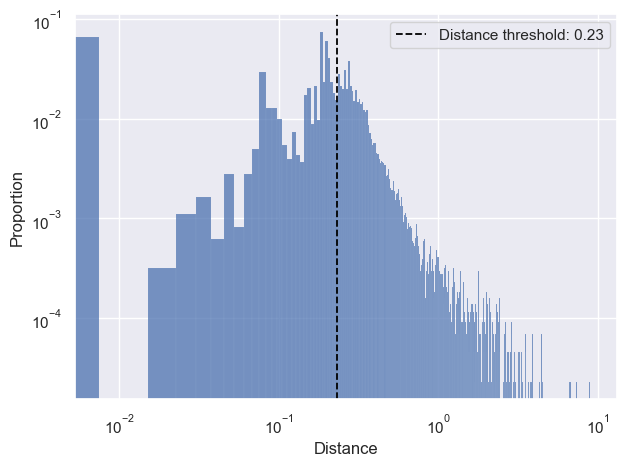

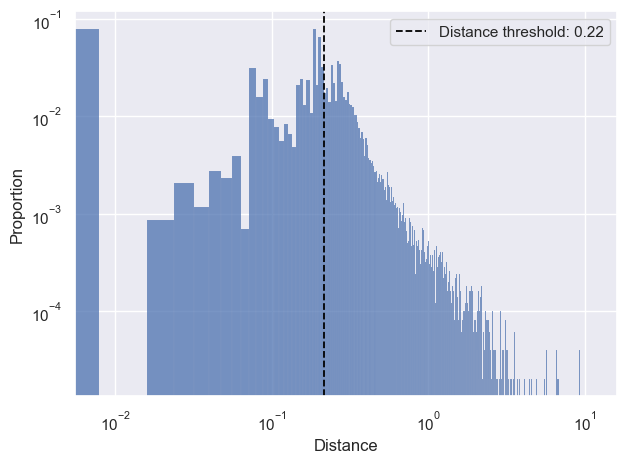

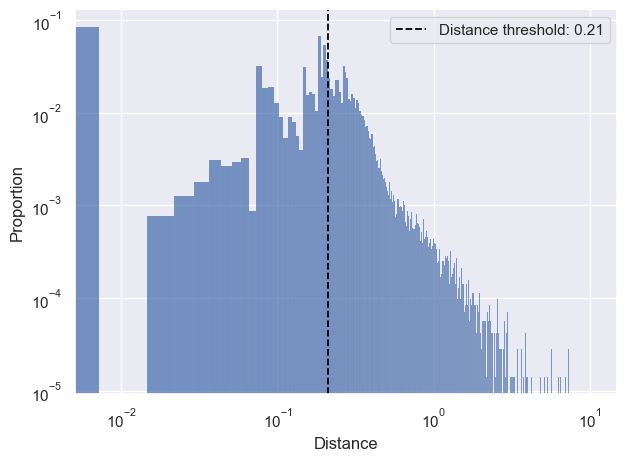

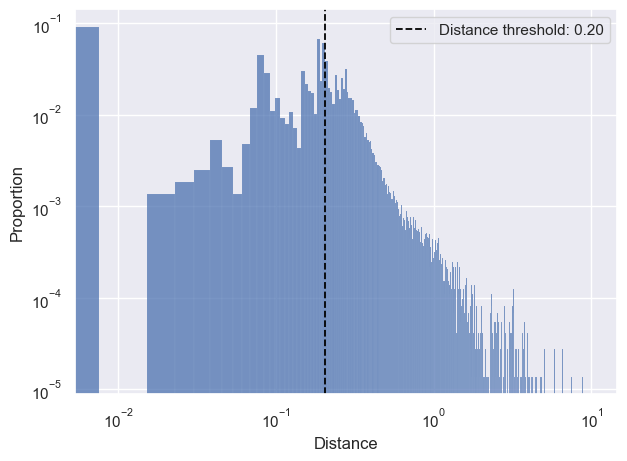

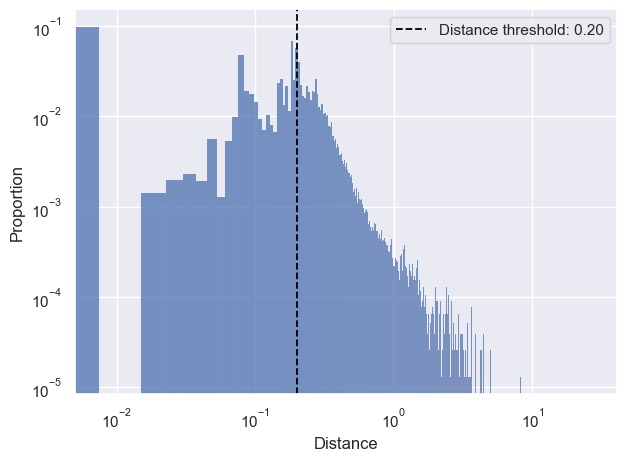

...

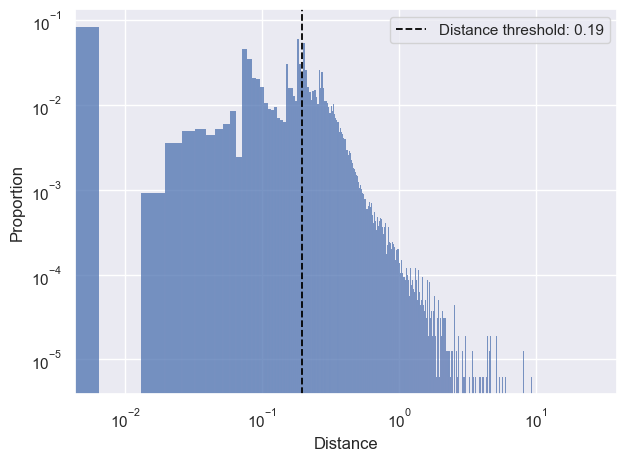

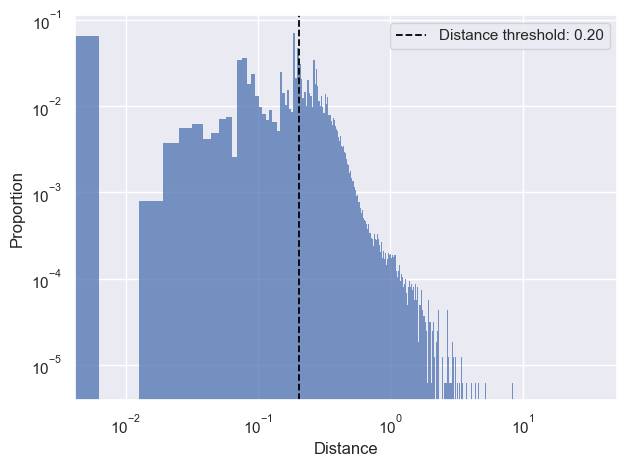

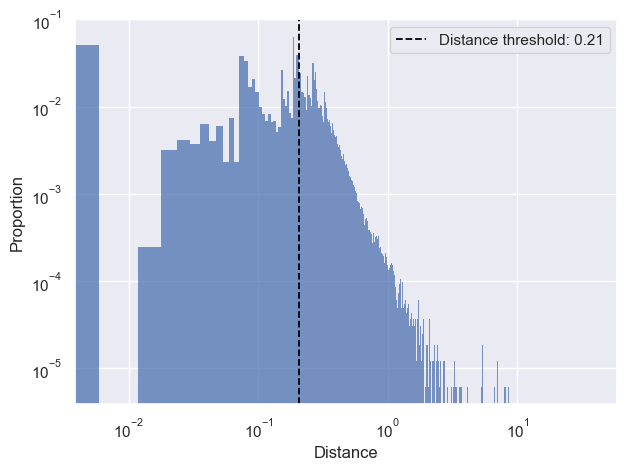

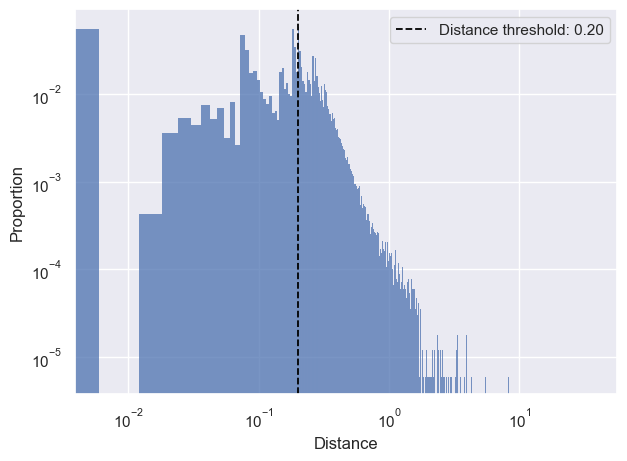

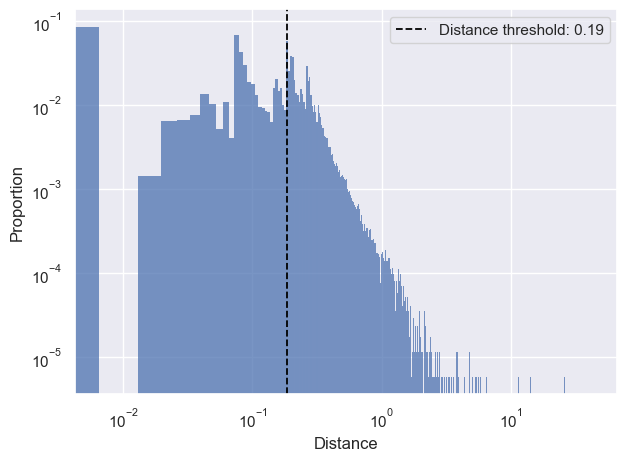

In [65]:
plotYearlyDistance(EuclideanDistance, 'manhattan', 10)

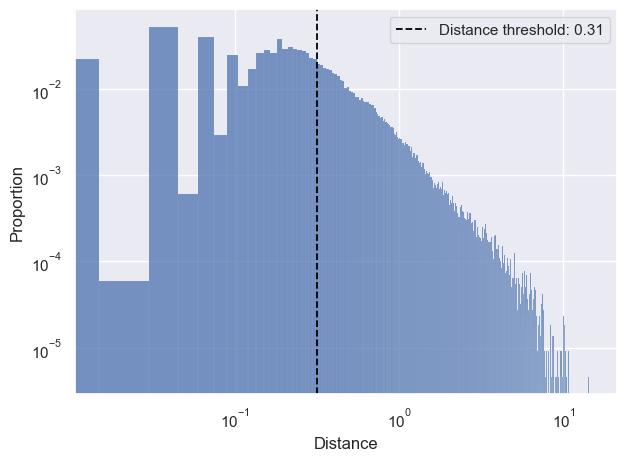

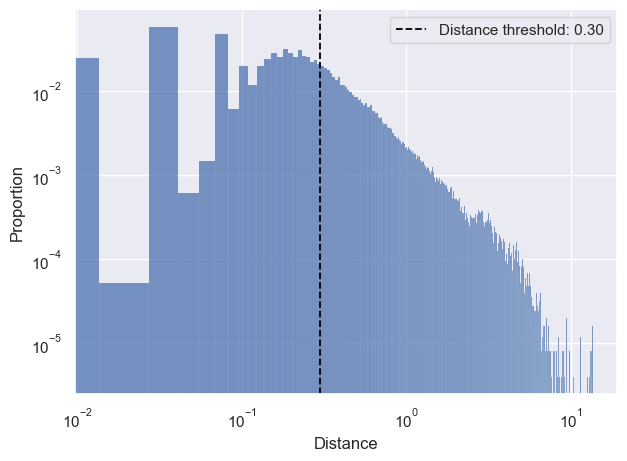

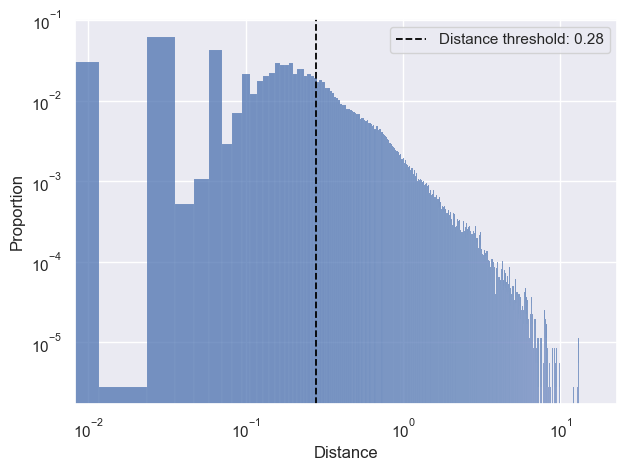

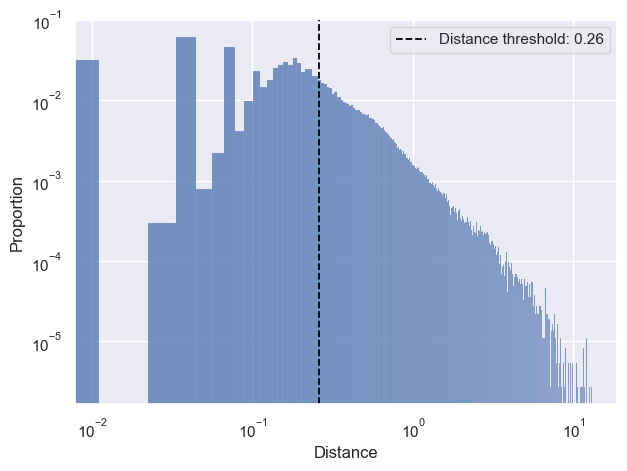

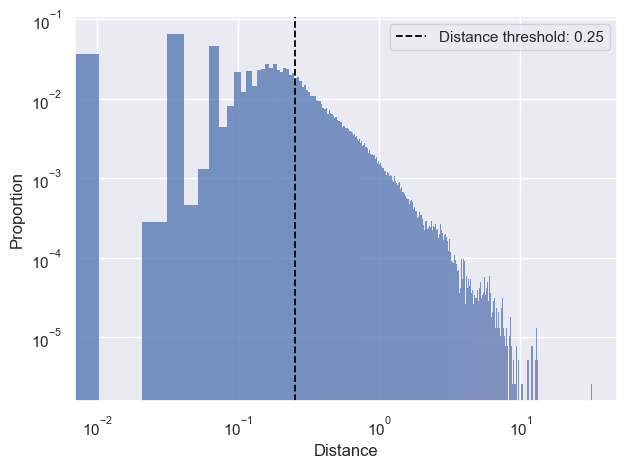

...

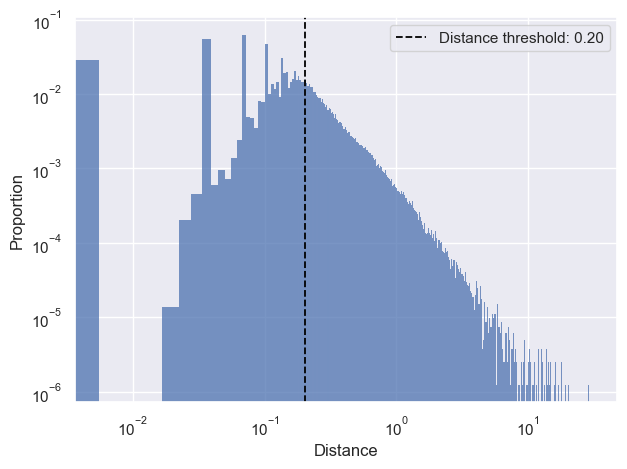

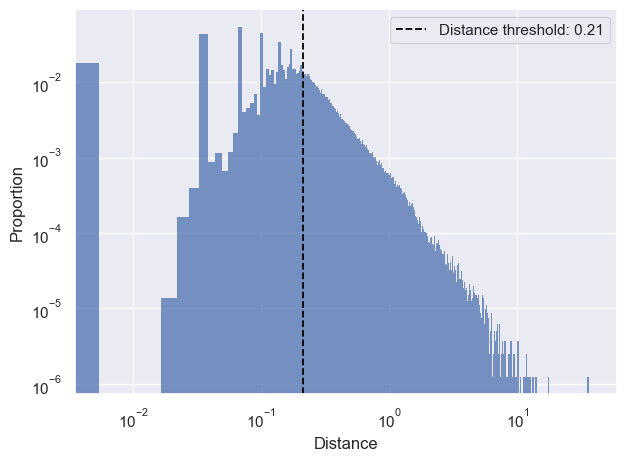

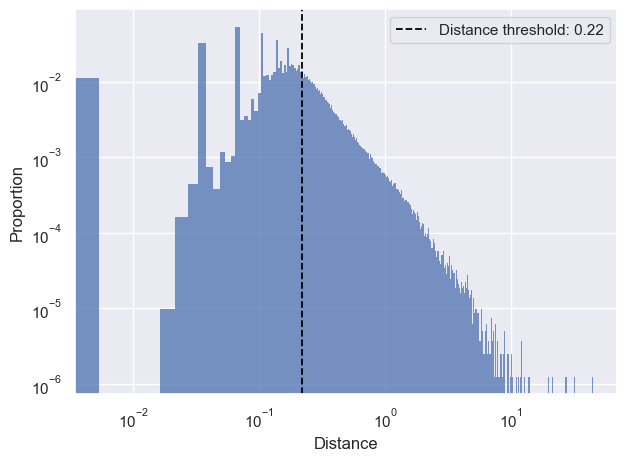

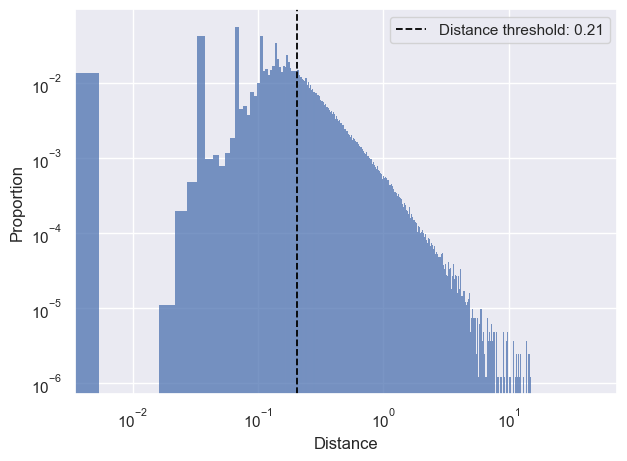

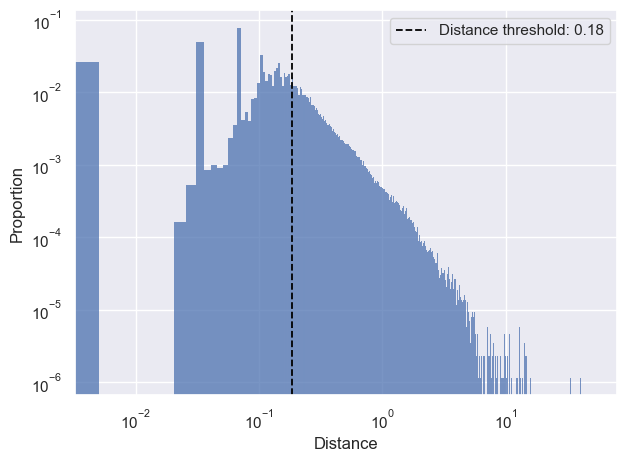

In [66]:
manhattan50Dist = getDistances(oneHot_researchers, 50, 'manhattan', allCols, 0.5)
plotYearlyDistance(manhattan50Dist, 'manhattan', 50)

In [67]:
euclideanLikelihood = likelihoodEvolution(oneHot_researchers, allCols, [10], 'Gender', ['Female', 'Male'], 'euclidean', [0.5], 1000, ['_F', '_M'])
manhattanLikelihood = likelihoodEvolution(oneHot_researchers, allCols, [10], 'Gender', ['Female', 'Male'], 'manhattan', [0.5], 1000, ['_F', '_M'])
minkowskiLikelihood = likelihoodEvolution(oneHot_researchers, allCols, [10], 'Gender', ['Female', 'Male'], 'minkowski', [0.5], 1000, ['_F', '_M'])

100%|█████████████████████████████████████████| 1/1 [1:04:37<00:00, 3877.06s/it]


In [68]:
#save dfs as pickle
euclideanLikelihood.to_pickle("Files/Dataframes/euclideanLikelihood.pkl")  
manhattanLikelihood.to_pickle("Files/Dataframes/manhattanLikelihood.pkl")  
minkowskiLikelihood.to_pickle("Files/Dataframes/minkowskiLikelihood.pkl")  

In [69]:
euclideanStats = getStats_likelihood(euclideanLikelihood, 'K')
manhattanStats = getStats_likelihood(manhattanLikelihood, 'K')
minkowskiStats = getStats_likelihood(minkowskiLikelihood, 'K')

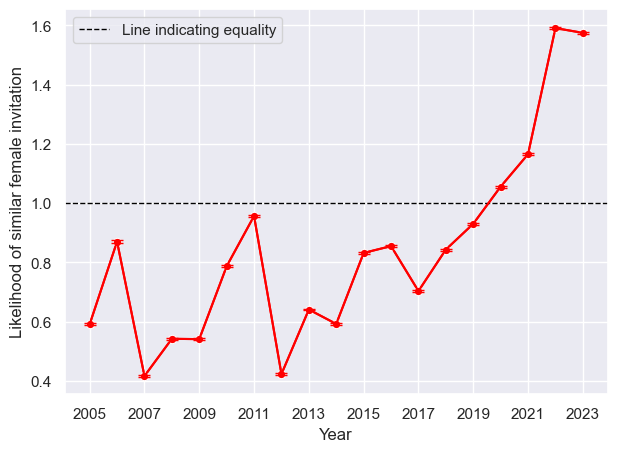

In [74]:
plotLikelihood([manhattanStats], ['red'], True, 'Likelihood of similar female invitation', [''], 'manhattanKNN_10K')

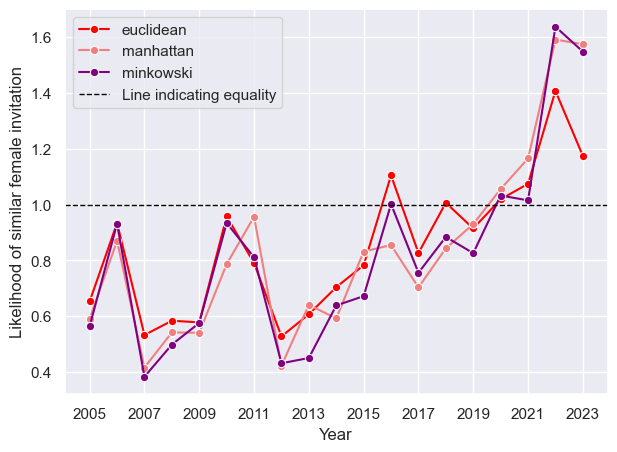

In [75]:
plotLikelihood([euclideanStats, manhattanStats, minkowskiStats], ['red', 'lightcoral', 'purple'], False, 'Likelihood of similar female invitation', ['euclidean', 'manhattan', 'minkowski'], 'metricsKNN_10K')

### Varying K

In [76]:
varyK_df = likelihoodEvolution(oneHot_researchers, allCols, [2, 5, 10, 20, 40, 50, 80, 100], 'Gender', ['Female', 'Male'], 'manhattan', [0.5], 1000, ['_F', '_M'])

100%|████████████████████████████████████████| 8/8 [11:04:44<00:00, 4985.54s/it]


In [77]:
#save df as pickle
varyK_df.to_pickle("Files/Dataframes/likelihood_varyK.pkl")  

In [78]:
varyK_Stats = getStats_likelihood(varyK_df, 'K')

In [79]:
kList = varyK_Stats.K.unique().tolist()
k2 = varyK_Stats[varyK_Stats.K == 2]
k5 = varyK_Stats[varyK_Stats.K == 5]
k10 = varyK_Stats[varyK_Stats.K == 10]
k20 = varyK_Stats[varyK_Stats.K == 20]
k40 = varyK_Stats[varyK_Stats.K == 40]
k50 = varyK_Stats[varyK_Stats.K == 50]
k80 = varyK_Stats[varyK_Stats.K == 80]
k100 = varyK_Stats[varyK_Stats.K == 100]

In [215]:
colors = ['grey', 'firebrick', 'fuchsia', 'sandybrown', 'darkgreen', 'mediumslateblue', 'red', 'lightcoral']

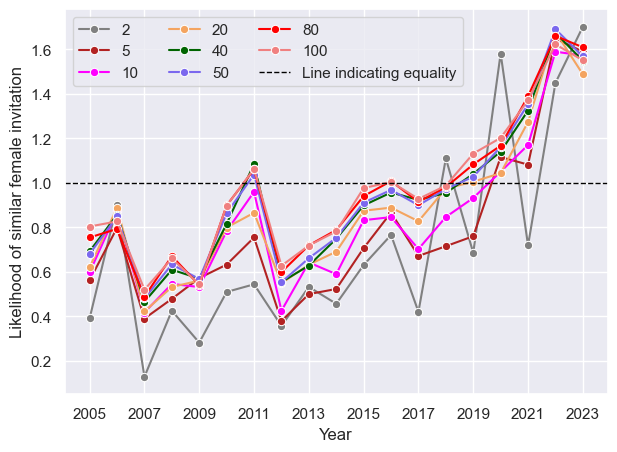

In [216]:
plotLikelihood([k2, k5 ,k10, k20, k40, k50, k80, k100], colors, False, 'Likelihood of similar female invitation', kList, 'varyK_KNN_manhattan')

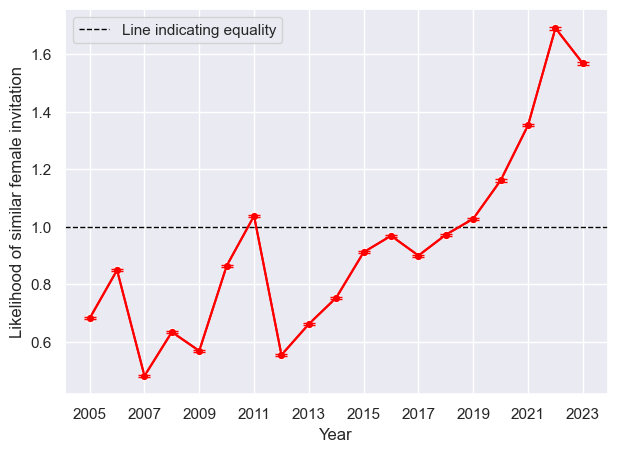

In [82]:
#likelihood for K = 50, metric = manhattan
plotLikelihood([k50], ['red'], True, 'Likelihood of similar female invitation', [''], 'manhattanKNN_50K')

#### Check metric for K = 50

In [97]:
euclidean50Likelihood = likelihoodEvolution(oneHot_researchers, allCols, [50], 'Gender', ['Female', 'Male'], 'euclidean', [0.5], 1000, ['_F', '_M'])
minkowski50Likelihood = likelihoodEvolution(oneHot_researchers, allCols, [50], 'Gender', ['Female', 'Male'], 'minkowski', [0.5], 1000, ['_F', '_M'])

100%|█████████████████████████████████████████| 1/1 [1:34:29<00:00, 5669.89s/it]


In [98]:
#save dfs as pickle
euclidean50Likelihood.to_pickle("Files/Dataframes/euclideanLikelihood_50K.pkl")  
minkowski50Likelihood.to_pickle("Files/Dataframes/minkowskiLikelihood_50K.pkl")  

In [99]:
euclidean50Stats = getStats_likelihood(euclidean50Likelihood, 'K')
minkowski50Stats = getStats_likelihood(minkowski50Likelihood, 'K')

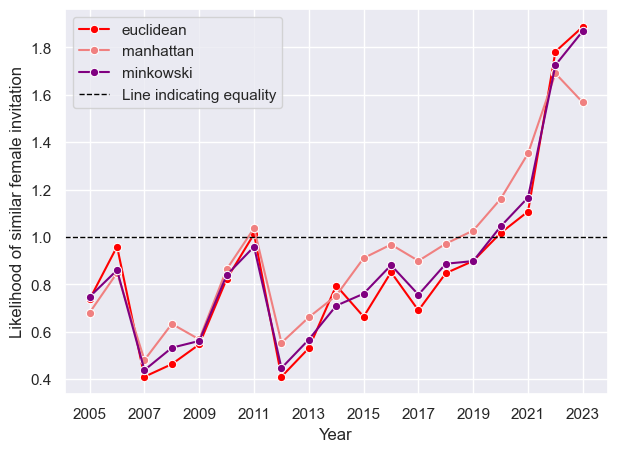

In [100]:
plotLikelihood([euclidean50Stats, k50, minkowski50Stats], ['red', 'lightcoral', 'purple'], False, 'Likelihood of similar female invitation', ['euclidean', 'manhattan', 'minkowski'], 'metricsKNN_50K')

### Varying q

In [101]:
#manhattan distance, K = 50, q varied
varyQ_df = likelihoodEvolution(oneHot_researchers, allCols, [50], 'Gender', ['Female', 'Male'], 'manhattan', [0.1, 0.2, 0.4, 0.5, 0.6, 0.8, 0.9] , 1000, ['_F', '_M'])

100%|███████████████████████████████████████| 1/1 [11:26:51<00:00, 41211.33s/it]


In [102]:
varyQ_df.to_pickle("Files/Dataframes/manhattanLikelihood_varyQ.pkl")  

In [103]:
varyQ_stats = getStats_likelihood(varyQ_df, 'q')

In [104]:
qList = varyQ_stats.q.unique().tolist()
q01= varyQ_stats[varyQ_stats.q == 0.1]
q02= varyQ_stats[varyQ_stats.q == 0.2]
q04= varyQ_stats[varyQ_stats.q == 0.4]
q05= varyQ_stats[varyQ_stats.q == 0.5]
q06= varyQ_stats[varyQ_stats.q == 0.6]
q08= varyQ_stats[varyQ_stats.q == 0.8]
q09= varyQ_stats[varyQ_stats.q == 0.9]

In [105]:
colors = ['grey', 'firebrick', 'fuchsia', 'sandybrown', 'mediumslateblue', 'red', 'lightcoral']

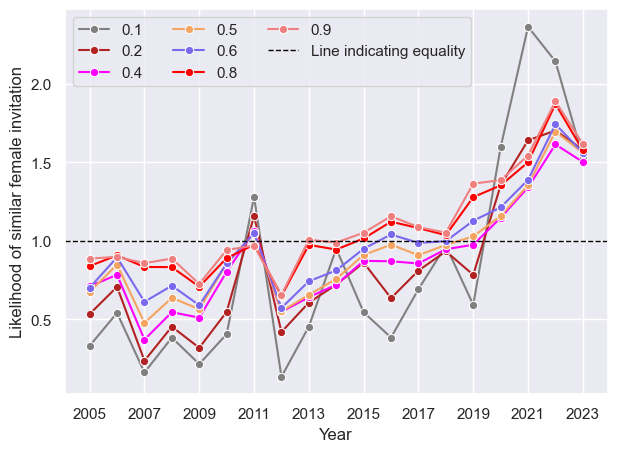

In [115]:
plotLikelihood([q01, q02, q04, q05, q06, q08, q09], colors, False, 'Likelihood of similar female invitation', qList, 'varyQ_KNN_manhattan')

### Piecewise function

In [116]:
finalLikelihood = q05[q05.Year == 2023].Avg_likelihood.values[0]
startLikelihood = q05[q05.Year <= 2014]
avgLikelihood = startLikelihood[startLikelihood.Year != 2011]['Avg_likelihood'].mean()

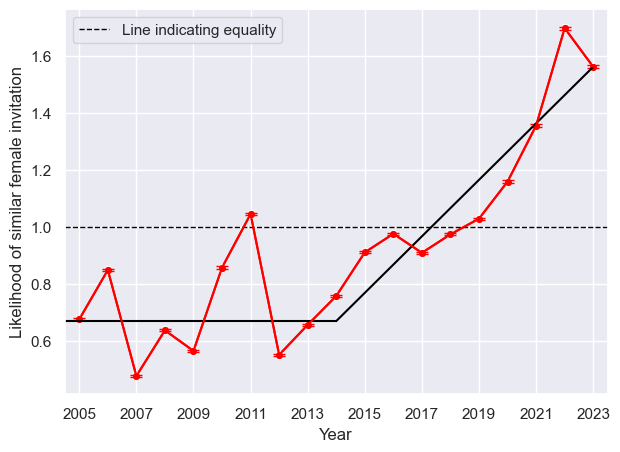

In [122]:
years = q05.Year.unique()
sns.lineplot(data = q05, x = 'Year', y = 'Avg_likelihood', marker = 'o', color = 'red')
plt.errorbar(x = q05.Year, y = q05.Avg_likelihood, yerr = q05.SEM_likelihood, color = 'red', capsize = 4)
plt.axhline(1, color = 'black', linewidth = 1, label = "Line indicating equality").set_linestyle("--")
plt.xlim(2004.5,2023.5)
#plt.axhline(avgLikelihood, color = 'black', linewidth = 1)
plt.plot([2004.5, 2014], [avgLikelihood, avgLikelihood], color = 'black')
plt.plot([2014, 2023], [avgLikelihood,finalLikelihood], color = 'black')
plt.xticks(np.arange(min(years), max(years)+1, 2.0))
plt.legend()
plt.ylabel('Likelihood of similar female invitation')
plt.show()

[2005.         2018.36232848 2023.        ]


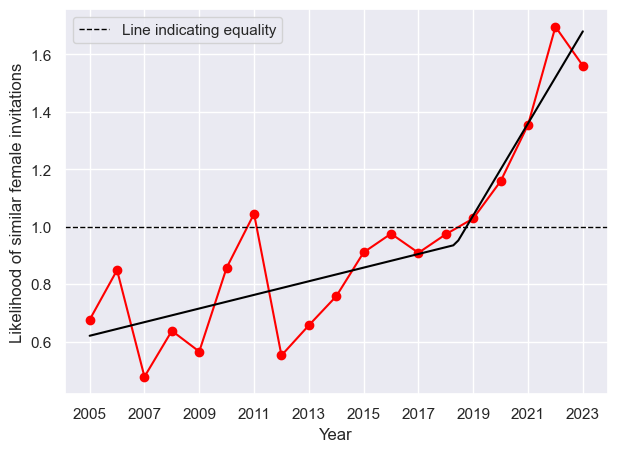

In [123]:
## fit piecewise
import pwlf
x = q05.Year.values
y = q05.Avg_likelihood.values

my_pwlf = pwlf.PiecewiseLinFit(x, y)
breaks = my_pwlf.fit(2)
print(breaks)


x_hat = np.linspace(x.min(), x.max(), 100)
y_hat = my_pwlf.predict(x_hat)

plt.figure()
plt.plot(x, y, '-o', color = 'red')
plt.plot(x_hat, y_hat, '-', color = 'black')
plt.axhline(1, color = 'black', linewidth = 1, label = "Line indicating equality").set_linestyle("--")
plt.legend()
plt.xticks(np.arange(min(years), max(years)+1, 2.0))
plt.xlabel("Year")
plt.ylabel("Likelihood of similar female invitations")
plt.show()

### Filtering on seniority

In [124]:
#create seniority categories
binStart = [-1]
bins = np.arange(5, 35, 5).tolist()
bins.append(float("inf"))
binStart += bins
labels = ['0-5', '6-10', '11-15', '16-20', '21-25', '26-30', '> 30']

seniorityCat_researchers = oneHot_researchers.copy()
seniorityCat_researchers['Seniority_cat'] = pd.cut(oneHot_researchers['Seniority'], bins = binStart, labels = labels)

#### Choosing Parameters 

In [126]:
#likelihood for different K
seniorityLikelihood5 = likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, ['Female', 'Male'], 5, 'manhattan', 0.5, 1000, ['_F', '_M'], 'SessionType')
seniorityLikelihood10 = likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, ['Female', 'Male'], 10, 'manhattan', 0.5, 1000, ['_F', '_M'], 'SessionType')
seniorityLikelihood15 = likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, ['Female', 'Male'], 15, 'manhattan', 0.5, 1000, ['_F', '_M'], 'SessionType')
seniorityLikelihood20 = likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, ['Female', 'Male'], 20, 'manhattan', 0.5, 1000, ['_F', '_M'], 'SessionType')
seniorityLikelihood25 = likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, ['Female', 'Male'], 25, 'manhattan', 0.5, 1000, ['_F', '_M'], 'SessionType')
seniorityLikelihood30 = likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, ['Female', 'Male'], 30, 'manhattan', 0.5, 1000, ['_F', '_M'], 'SessionType')
seniorityLikelihood35 = likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, ['Female', 'Male'], 35, 'manhattan', 0.5, 1000, ['_F', '_M'], 'SessionType')

100%|██████████████████████████████████████████| 19/19 [41:48<00:00, 132.04s/it]


In [127]:
#get stats
seniorityLikelihood_stats5 = getStats_likelihood(seniorityLikelihood5, 'Seniority')
seniorityLikelihood_stats10 = getStats_likelihood(seniorityLikelihood10, 'Seniority')
seniorityLikelihood_stats15 = getStats_likelihood(seniorityLikelihood15, 'Seniority')
seniorityLikelihood_stats20 = getStats_likelihood(seniorityLikelihood20, 'Seniority')
seniorityLikelihood_stats25 = getStats_likelihood(seniorityLikelihood25, 'Seniority')
seniorityLikelihood_stats30 = getStats_likelihood(seniorityLikelihood30, 'Seniority')
seniorityLikelihood_stats35 = getStats_likelihood(seniorityLikelihood35, 'Seniority')

In [128]:
#set order 
seniorityLikelihood_stats5['Seniority'] = pd.Categorical(seniorityLikelihood_stats5['Seniority'],
                                   categories=['0-5', '6-10', '11-15', '16-20', '21-25', '26-30', '> 30'],
                                   ordered=True)

In [221]:
colors = ['grey', 'firebrick', 'fuchsia', 'sandybrown', 'mediumslateblue', 'red', 'lightcoral']

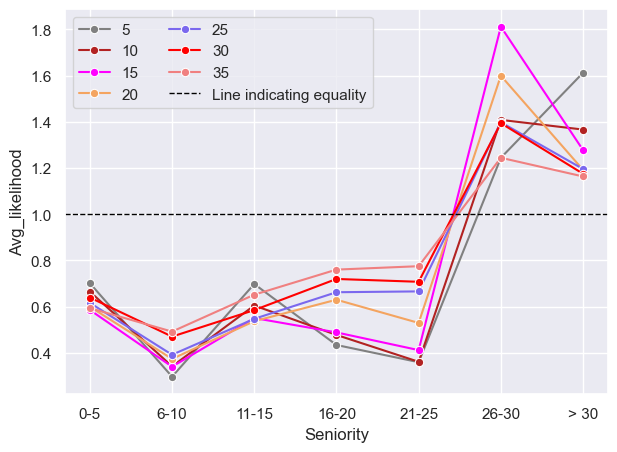

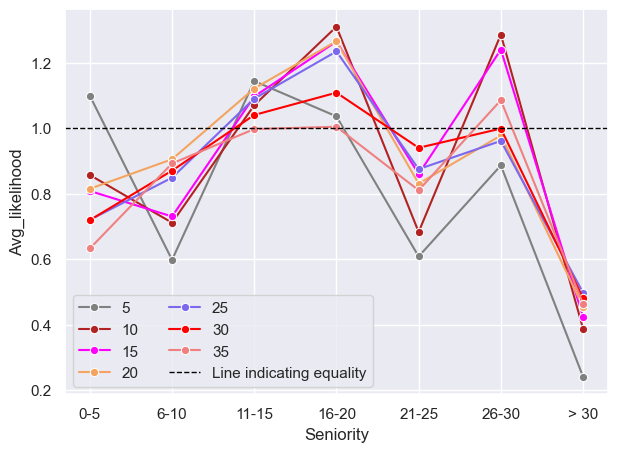

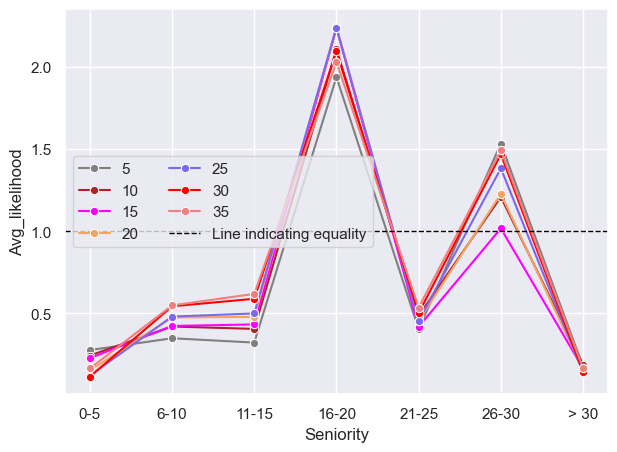

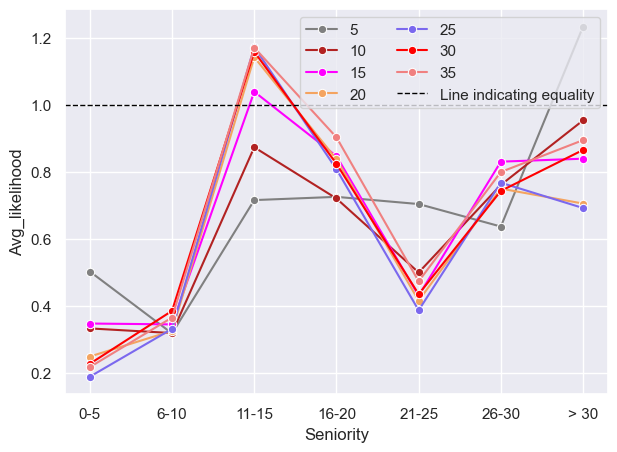

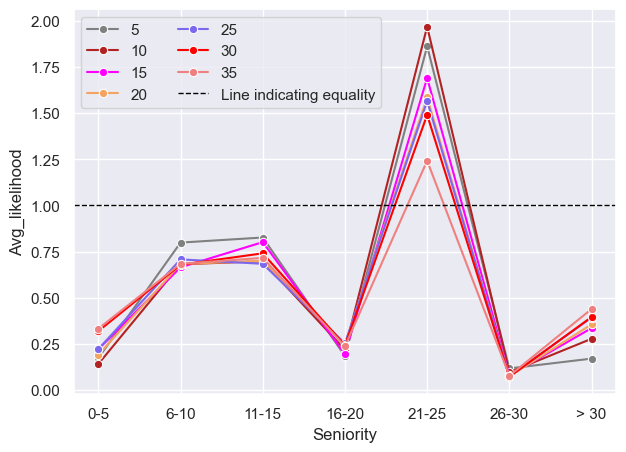

...

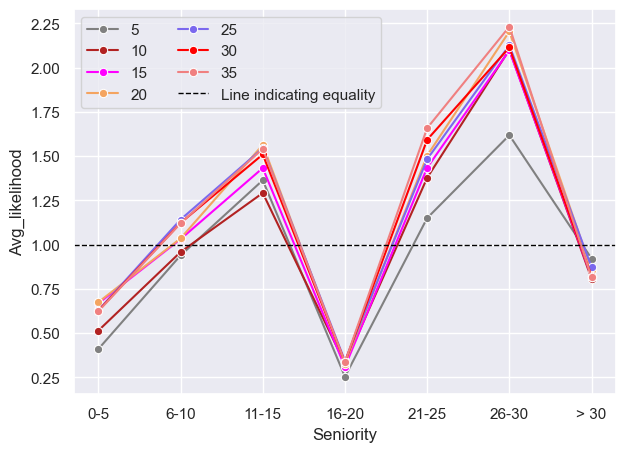

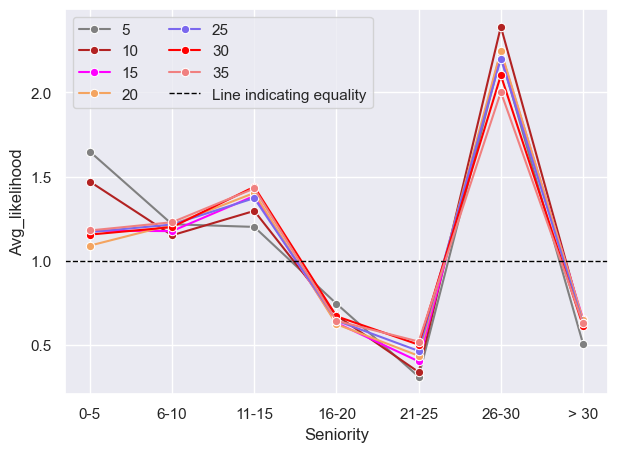

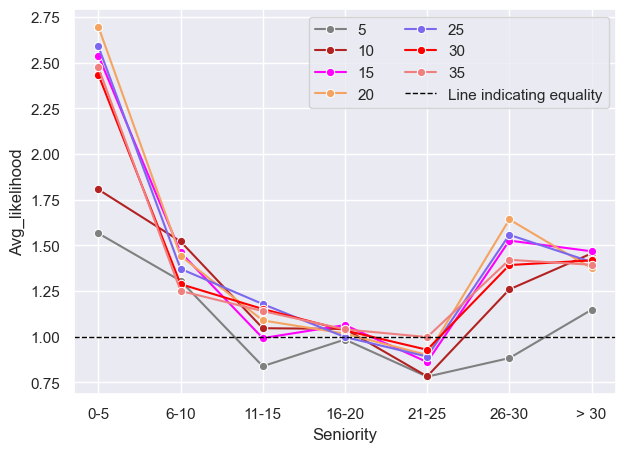

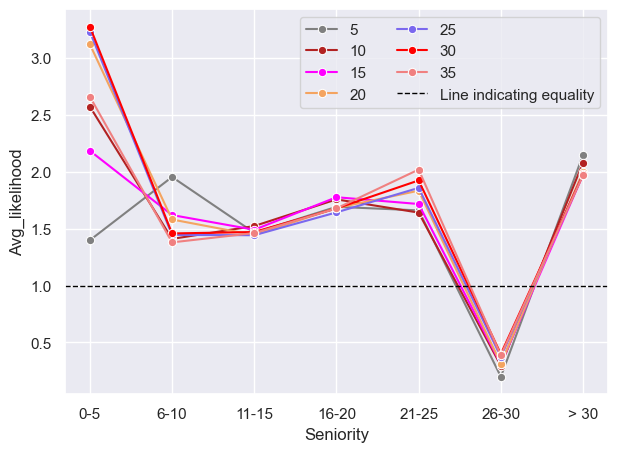

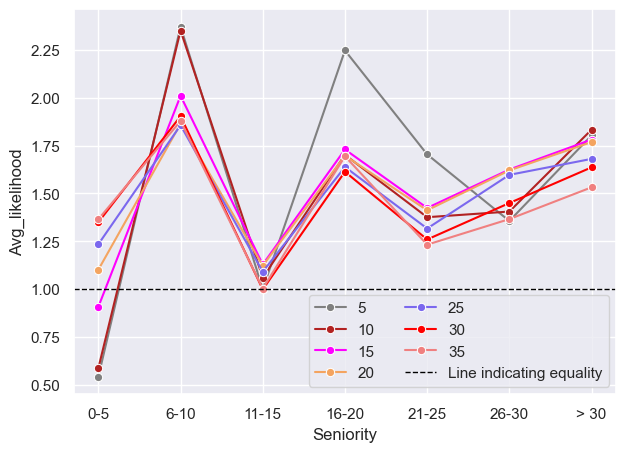

In [222]:
df_list = [seniorityLikelihood_stats5, seniorityLikelihood_stats10, seniorityLikelihood_stats15, seniorityLikelihood_stats20, seniorityLikelihood_stats25, seniorityLikelihood_stats30, seniorityLikelihood_stats35]
K_list = [5, 10, 15, 20, 25, 30, 35]
plotSeniority_varyParameters(df_list, K_list, colors, "seniorityLikelihoodF_varyK")

In [144]:
#different metrics
seniorityLikelihood_euclidean = likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, ['Female', 'Male'], 25, 'euclidean', 0.5, 1000, ['_F', '_M'], 'SessionType')
seniorityLikelihood_minkowski = likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, ['Female', 'Male'], 25, 'minkowski', 0.5, 1000, ['_F', '_M'], 'SessionType')

100%|██████████████████████████████████████████| 19/19 [41:45<00:00, 131.89s/it]


In [145]:
seniorityLikelihood_statsEuclidean = getStats_likelihood(seniorityLikelihood_euclidean, 'Seniority')
seniorityLikelihood_statsMinkowski = getStats_likelihood(seniorityLikelihood_minkowski, 'Seniority')

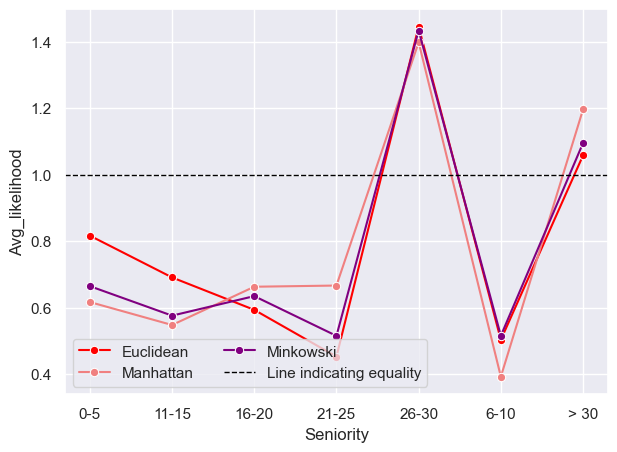

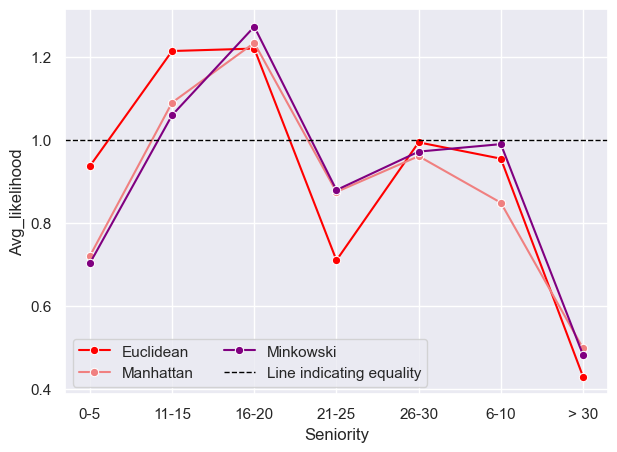

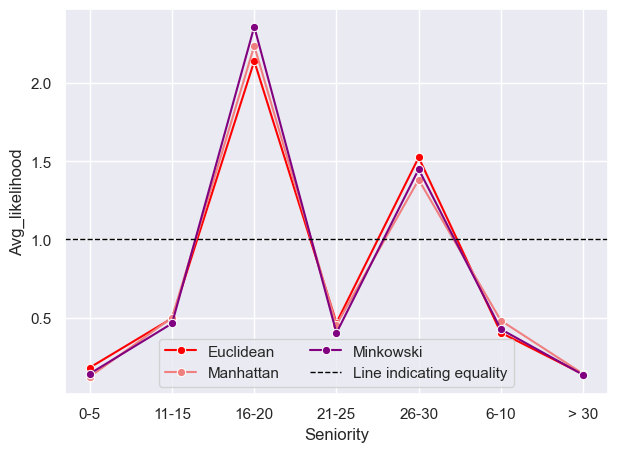

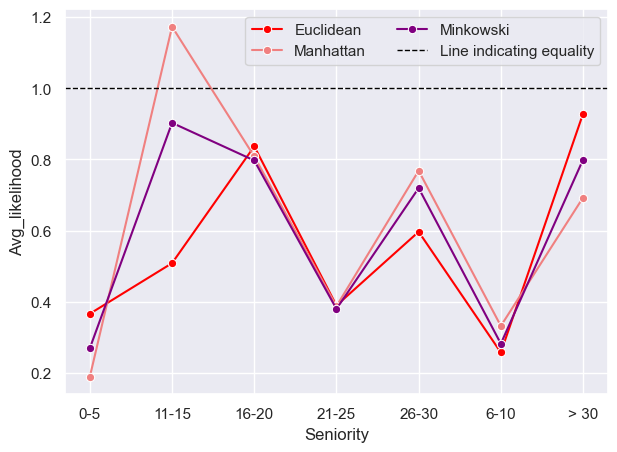

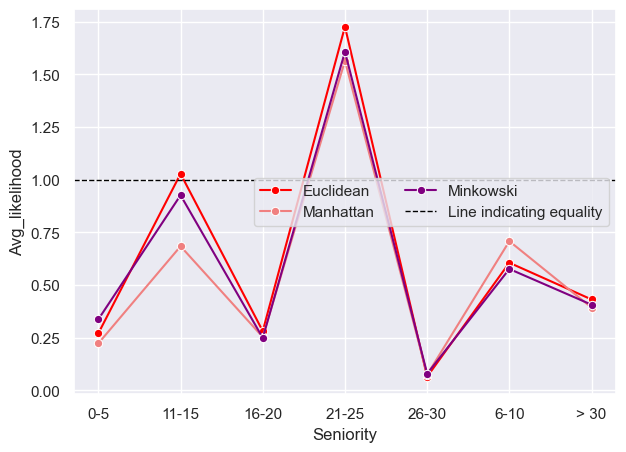

...

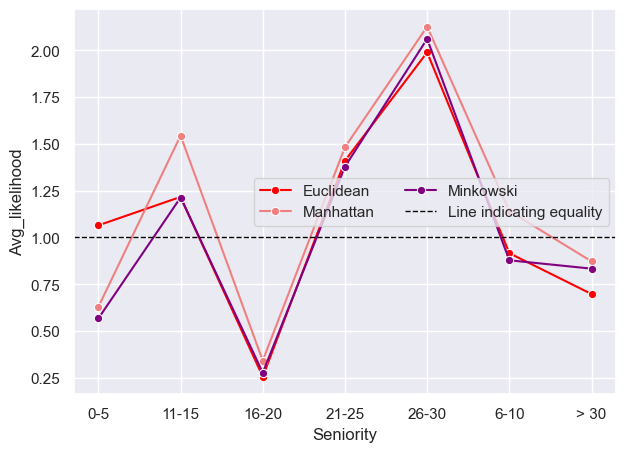

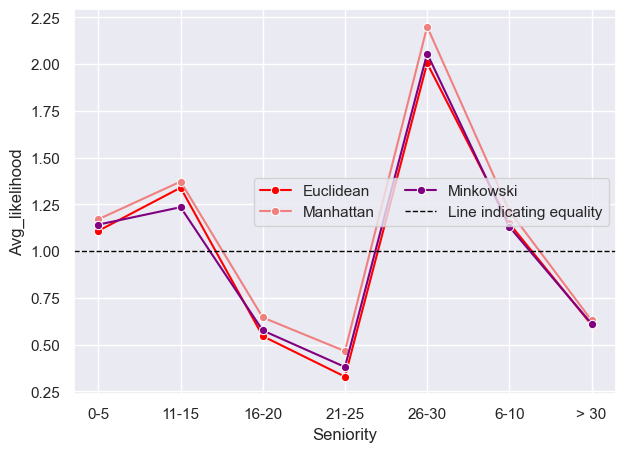

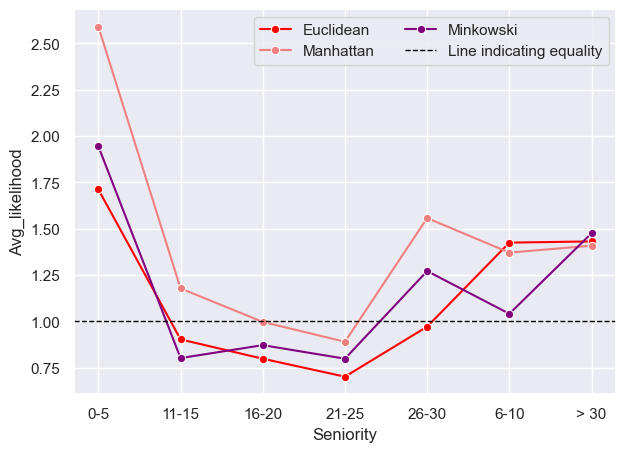

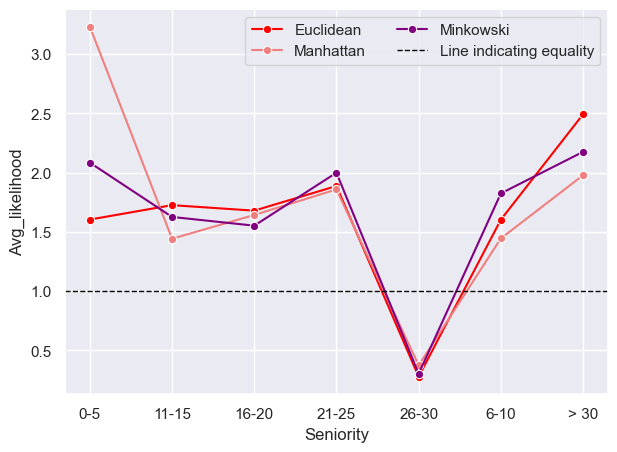

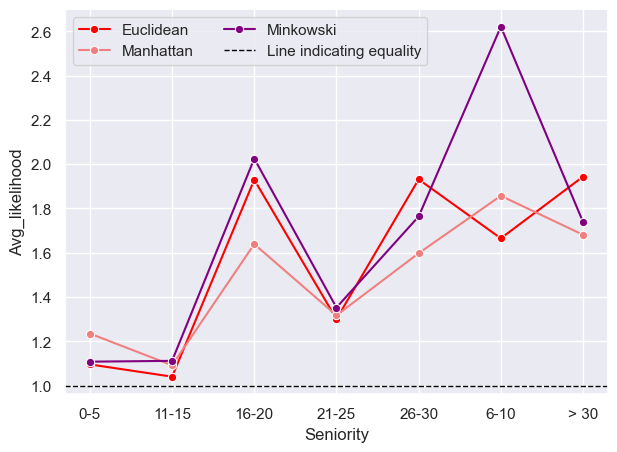

In [219]:
df_list = [seniorityLikelihood_statsEuclidean, seniorityLikelihood_stats25, seniorityLikelihood_statsMinkowski]
metricList  = ['Euclidean', 'Manhattan', 'Minkowski']
plotSeniority_varyParameters(df_list, metricList, ['red', 'lightcoral', 'purple'], "seniorityLikelihoodF_varyDist")

In [148]:
#likelihood for different q
seniorityLikelihood02 = likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, ['Female', 'Male'], 25, 'manhattan', 0.2, 1000, ['_F', '_M'], 'SessionType')
seniorityLikelihood04 = likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, ['Female', 'Male'], 25, 'manhattan', 0.4, 1000, ['_F', '_M'], 'SessionType')
seniorityLikelihood05 = likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, ['Female', 'Male'], 25, 'manhattan', 0.5, 1000, ['_F', '_M'], 'SessionType')
seniorityLikelihood06 = likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, ['Female', 'Male'], 25, 'manhattan', 0.6, 1000, ['_F', '_M'], 'SessionType')
seniorityLikelihood08 = likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, ['Female', 'Male'], 25, 'manhattan', 0.8, 1000, ['_F', '_M'], 'SessionType')
seniorityLikelihood09 = likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, ['Female', 'Male'], 25, 'manhattan', 0.9, 1000, ['_F', '_M'], 'SessionType')

  0%|                                                    | 0/19 [00:00<?, ?it/s]/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/2957691842.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
100%|██████████████████████████████████████████| 19/19 [59:52<00:00, 189.09s/it]


In [160]:
seniorityLikelihood_stats02 = getStats_likelihood(seniorityLikelihood02, 'Seniority')
seniorityLikelihood_stats04 = getStats_likelihood(seniorityLikelihood04, 'Seniority')
seniorityLikelihood_stats05 = getStats_likelihood(seniorityLikelihood05, 'Seniority')
seniorityLikelihood_stats06 = getStats_likelihood(seniorityLikelihood06, 'Seniority')
seniorityLikelihood_stats08 = getStats_likelihood(seniorityLikelihood08, 'Seniority')
seniorityLikelihood_stats09 = getStats_likelihood(seniorityLikelihood09, 'Seniority')

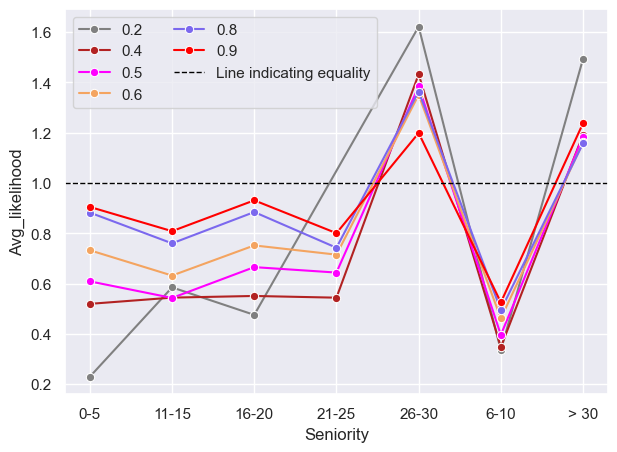

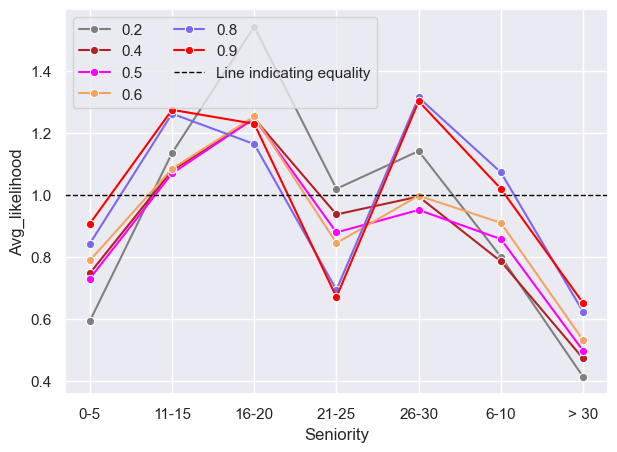

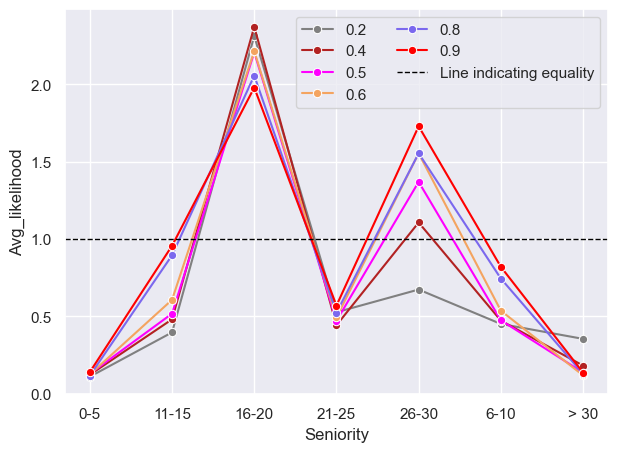

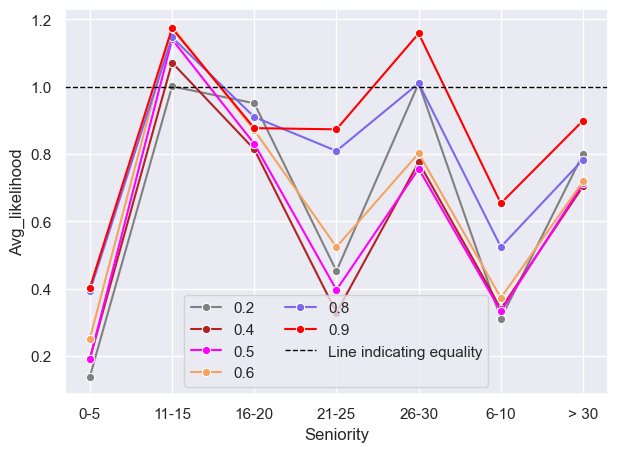

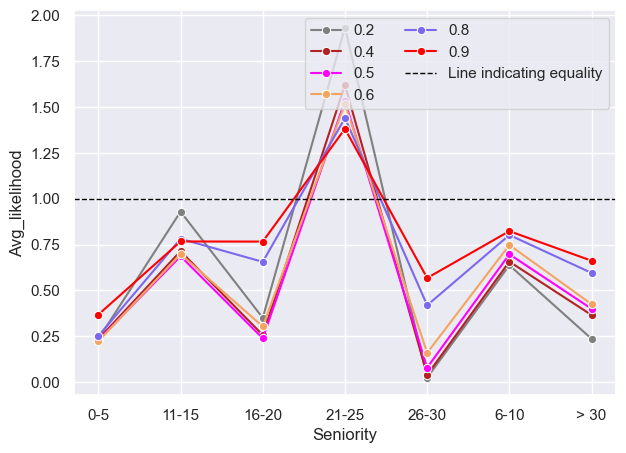

...

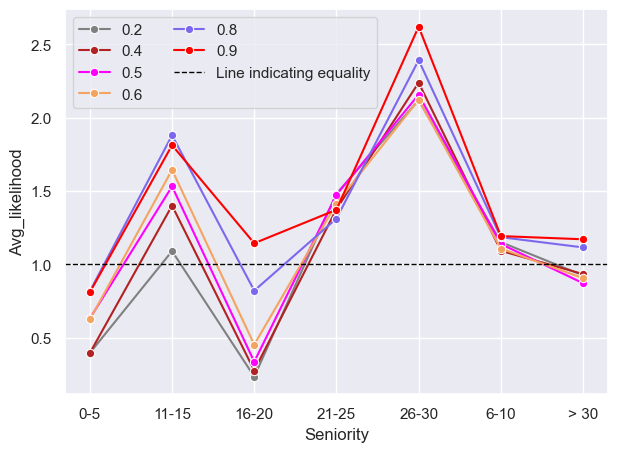

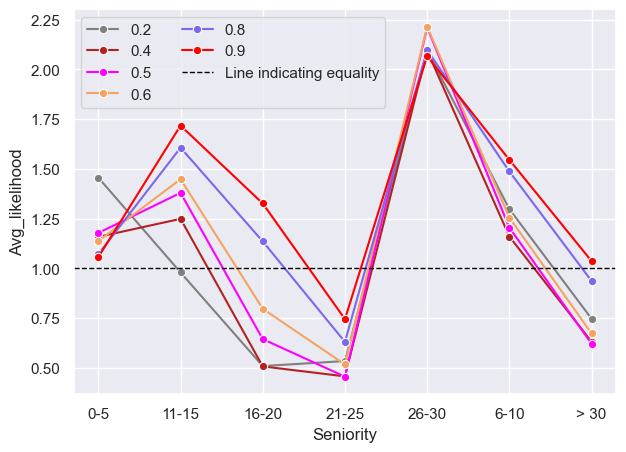

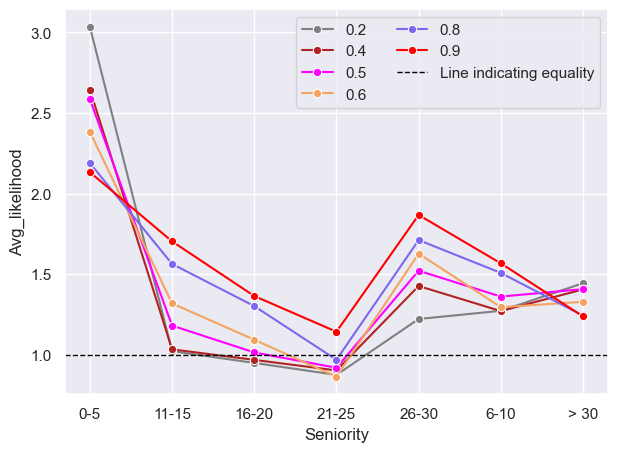

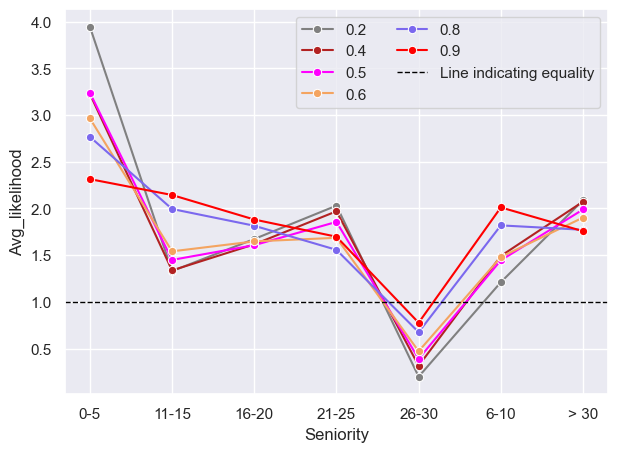

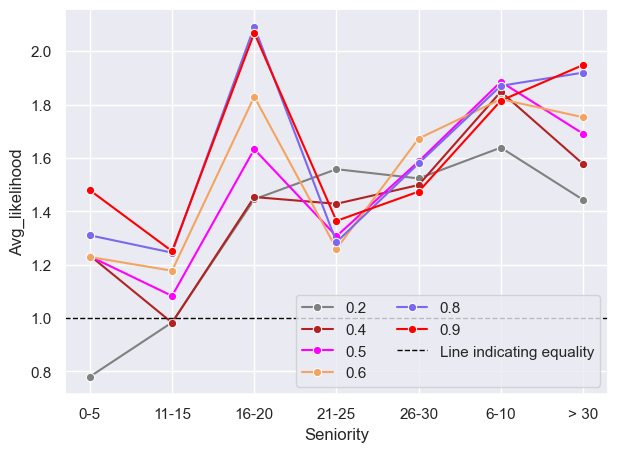

In [223]:
df_list = [seniorityLikelihood_stats02, seniorityLikelihood_stats04,  seniorityLikelihood_stats05, seniorityLikelihood_stats06, seniorityLikelihood_stats08, seniorityLikelihood_stats09]
q_list  = ['0.2', '0.4', '0.5', '0.6', '0.8', '0.9']
plotSeniority_varyParameters(df_list, q_list, colors, "seniorityLikelihoodF_varyQ")

#### Heatmap of likelihood

In [167]:
seniorityLikelihood05.to_pickle("Files/Dataframes/seniorityLikelihood.pkl")  

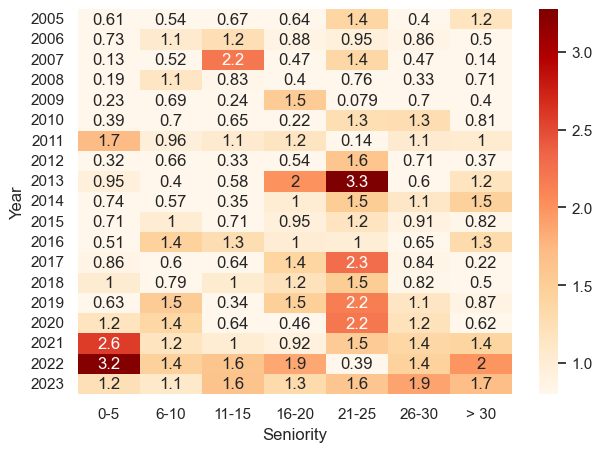

In [445]:
avgLikelihood_heatmap(seniorityLikelihood_stats05, 'likelihoodHeatmap_females.png', 'OrRd', 'Avg_likelihood', 0.8)

In [178]:
seniorityLikelihood_stats['Seniority'] = seniorityLikelihood_stats['Seniority'].replace(
    {'0-5': 0, '6-10': 1, '11-15': 2, '16-20': 3, '21-25': 4, '26-30': 5, '> 30': 6})

In [179]:
seniorityLikelihood_stats.corr()

,Seniority,Year,Avg_likelihood,STD_likelihood,SEM_likelihood
Seniority,1.000000e+00,-1.743020e-14,0.104769,0.205882,0.205882
Year,-1.743020e-14,1.000000e+00,0.408540,0.130278,0.130278
Avg_likelihood,1.047693e-01,4.085402e-01,1.000000,0.886312,0.886312
STD_likelihood,2.058817e-01,1.302777e-01,0.886312,1.000000,1.000000
SEM_likelihood,2.058817e-01,1.302777e-01,0.886312,1.000000,1.000000


### Similarity for males

Now, the evolution of likelihood of males similar to females being invited, will be calculated. 

#### Choosing parameters

In [193]:
#vary distance metric (K = 50 as starting point)
euclideanLikelihood_M = likelihoodEvolution(oneHot_researchers, allCols, [50], 'Gender', ['Male', 'Female'], 'euclidean', [0.5], 1000, ['_M', '_F'])
manhattanLikelihood_M = likelihoodEvolution(oneHot_researchers, allCols, [50], 'Gender', ['Male', 'Female'], 'manhattan', [0.5], 1000, ['_M', '_F'])
minkowskiLikelihood_M = likelihoodEvolution(oneHot_researchers, allCols, [50], 'Gender', ['Male', 'Female'], 'minkowski', [0.5], 1000, ['_M', '_F'])

100%|████████████████████████████████████████████| 1/1 [11:39<00:00, 699.76s/it]


In [195]:
euclideanStats_M = getStats_likelihood(euclideanLikelihood_M , 'K')
manhattanStats_M = getStats_likelihood(manhattanLikelihood_M, 'K')
minkowskiStats_M = getStats_likelihood(minkowskiLikelihood_M, 'K')

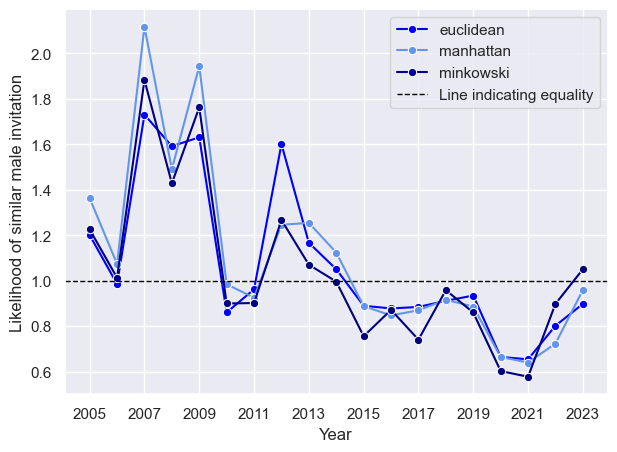

In [209]:
plotLikelihodod([euclideanStats_M, manhattanStats_M, minkowskiStats_M], ['blue', 'cornflowerblue', 'navy'], False, 'Likelihood of similar male invitation', ['euclidean', 'manhattan', 'minkowski'], 'metricsKNN_50K_males')

In [371]:
varyK_df_males = likelihoodEvolution(oneHot_researchers, allCols, [2, 5, 10, 20, 40, 50, 80, 100], 'Gender', ['Male', 'Female'], 'manhattan', [0.5], 1000, ['_M', '_F'])

100%|██████████████████████████████████████████| 8/8 [1:38:09<00:00, 736.23s/it]


In [372]:
#save df as pickle
varyK_df_males.to_pickle("Files/Dataframes/likelihood_varyK_males.pkl")  

In [373]:
varyK_Stats_males = getStats_likelihood(varyK_df_males, 'K')

In [408]:
kList = varyK_Stats_males.K.unique().tolist()
k2 = varyK_Stats_males[varyK_Stats_males.K == 2]
k5 = varyK_Stats_males[varyK_Stats_males.K == 5]
k10 = varyK_Stats_males[varyK_Stats_males.K == 10]
k20 = varyK_Stats_males[varyK_Stats_males.K == 20]
k40 = varyK_Stats_males[varyK_Stats_males.K == 40]
k50 = varyK_Stats_males[varyK_Stats_males.K == 50]
k80 = varyK_Stats_males[varyK_Stats_males.K == 80]
k100 = varyK_Stats_males[varyK_Stats_males.K == 100]

In [398]:
colors = ['grey', 'royalblue', 'navy', 'sandybrown', 'darkgreen', 'mediumslateblue', 'blue', 'deepskyblue']

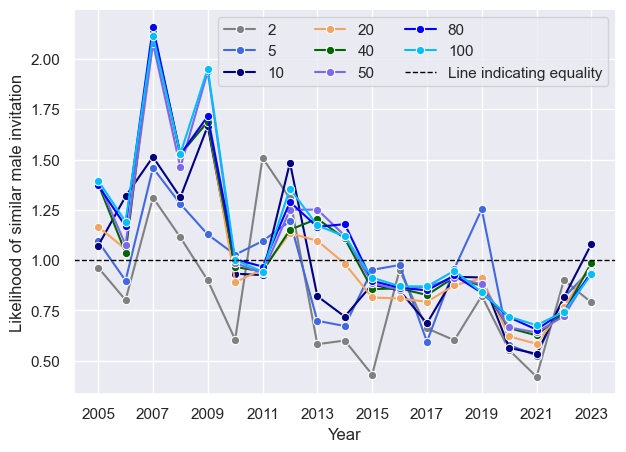

In [399]:
plotLikelihood([k2, k5 ,k10, k20, k40, k50, k80, k100], colors, False, 'Likelihood of similar male invitation', kList, 'varyK_KNN_manhattanMales')

In [416]:
#manhattan distance, K = 50, q varied
varyQ_df_males = likelihoodEvolution(oneHot_researchers, allCols, [50], 'Gender', ['Male', 'Female'], 'manhattan', [0.2, 0.4, 0.5, 0.6, 0.8, 0.9] , 1000, ['_M', '_F'])

100%|████████████████████████████████████████| 1/1 [2:54:54<00:00, 10494.23s/it]


In [417]:
varyQ_df_males.to_pickle("Files/Dataframes/manhattanLikelihood_varyQMales.pkl")  

In [418]:
varyQ_stats_males = getStats_likelihood(varyQ_df_males, 'q')

In [423]:
qList = varyQ_stats_males.q.unique().tolist()
q02= varyQ_stats_males[varyQ_stats_males.q == 0.2]
q04= varyQ_stats_males[varyQ_stats_males.q == 0.4]
q05= varyQ_stats_males[varyQ_stats_males.q == 0.5]
q06= varyQ_stats_males[varyQ_stats_males.q == 0.6]
q08= varyQ_stats_males[varyQ_stats_males.q == 0.8]
q09= varyQ_stats_males[varyQ_stats_males.q == 0.9]

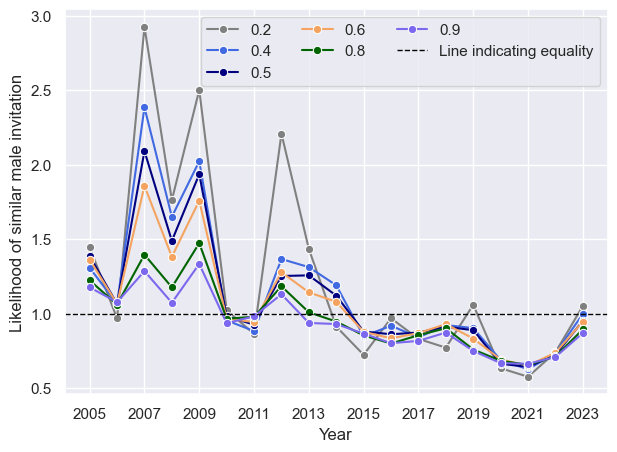

In [431]:
plotLikelihood([q02, q04, q05, q06, q08, q09], colors, False, 'Likelihood of similar male invitation', qList, 'varyQ_KNN_manhattan_males')

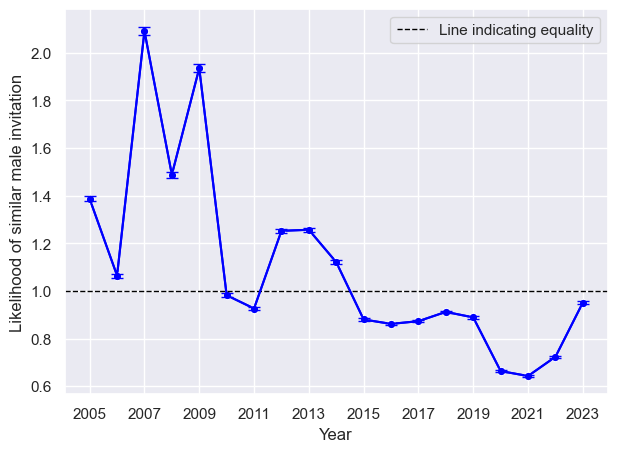

In [432]:
plotLikelihood([q05], ['blue'], True, 'Likelihood of similar male invitation', [''], 'finalLikelihood_male')

In [454]:
#relative likelihood for females(distance metric = manhattan, K = 50, q = 0.5)
k50_females = varyK_Stats[varyK_Stats.K == 50]

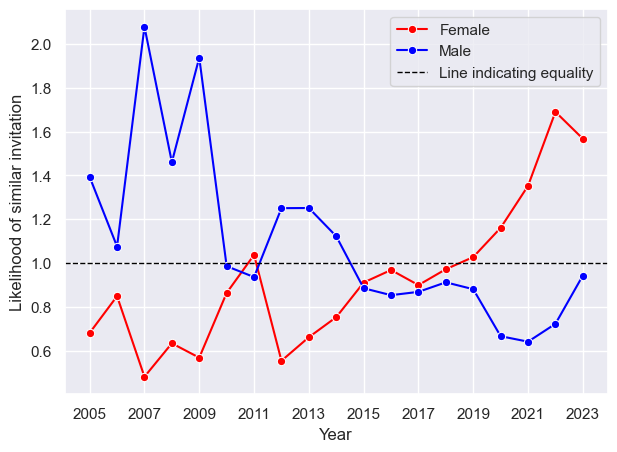

In [456]:
#plot females and males
plotLikelihood([k50_females, k50], ['red', 'blue'], False, 'Likelihood of similar invitation', ['Female', 'Male'], 'likelihood_maleVSfemale')

### Filtering on seniority

In [433]:
ratio_df = seniority_SimilarInvitedRatio(seniorityCat_researchers, allCols, ['Male', 'Female'], 25, 'manhattan', 0.5, 'SessionType', ['MaleRatio_inv', 'FemaleRatio_inv'])

100%|███████████████████████████████████████████| 19/19 [00:06<00:00,  3.16it/s]


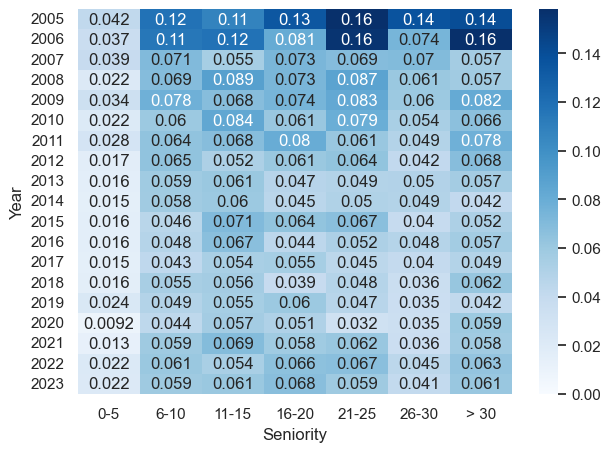

In [443]:
avgLikelihood_heatmap(ratio_df, "maleInvRatio", "Blues", 'MaleRatio_inv', 0)

### Likelihood with different features

In [457]:
#allCols
removeSeniority = np.delete(allCols, [-3])
removePaperCount = np.delete(allCols, [-2])
removeProductivity = np.delete(allCols, [-1])
removeUnits = allCols[-3:]

#### Females

In [458]:
#calculate likelihood but removing one feature
seniorityRemoved_likelihood = likelihoodEvolution_changeFeatures(oneHot_researchers, removeSeniority, [50], 'Gender', ['Female', 'Male'], 'manhattan', [0.5], 1000, ['_F', '_M'])
paperCountRemoved_likelihood = likelihoodEvolution_changeFeatures(oneHot_researchers, removePaperCount, [50], 'Gender', ['Female', 'Male'], 'manhattan', [0.5], 1000, ['_F', '_M'])
productivityRemoved_likelihood = likelihoodEvolution_changeFeatures(oneHot_researchers, removeProductivity, [50], 'Gender', ['Female', 'Male'], 'manhattan', [0.5], 1000, ['_F', '_M'])
unitsRemoved_likelihood = likelihoodEvolution_changeFeatures(oneHot_researchers, removeUnits, [50], 'Gender', ['Female', 'Male'], 'manhattan', [0.5], 1000, ['_F', '_M'])

100%|██████████████████████████████████████████| 19/19 [52:59<00:00, 167.35s/it]


In [459]:
#save results
seniorityRemoved_likelihood.to_pickle("Files/Dataframes/likelihood_seniorityRemoved.pkl")  
paperCountRemoved_likelihood.to_pickle("Files/Dataframes/likelihood_papercountRemoved.pkl")  
productivityRemoved_likelihood.to_pickle("Files/Dataframes/likelihood_productivityRemoved.pkl")  
unitsRemoved_likelihood.to_pickle("Files/Dataframes/likelihood_unitsRemoved.pkl")  

In [460]:
#get stats of results
seniorityRemovedStats = getStats_likelihood(seniorityRemoved_likelihood, 'K')
paperCountRemovedStats = getStats_likelihood(paperCountRemoved_likelihood, 'K')
productivityRemovedStats = getStats_likelihood(productivityRemoved_likelihood, 'K')
unitsRemovedStats = getStats_likelihood(unitsRemoved_likelihood, 'K')

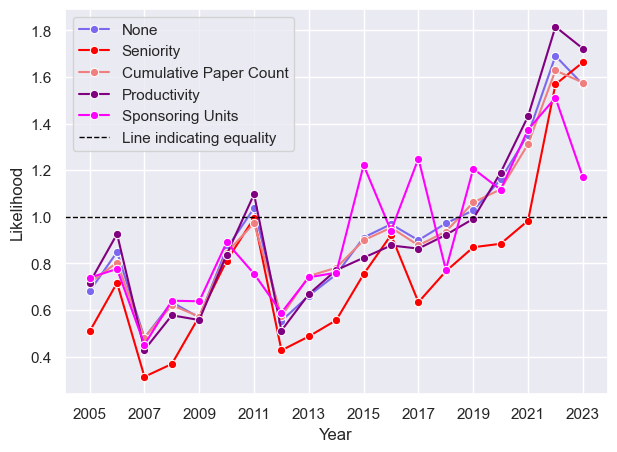

In [461]:
colors = ['mediumslateblue', 'red', 'lightcoral', 'purple', 'fuchsia']
plotLikelihood([k50_females, seniorityRemovedStats, paperCountRemovedStats, productivityRemovedStats, unitsRemovedStats], colors, False, 'Likelihood', ['None', 'Seniority', 'Cumulative Paper Count', 'Productivity', 'Sponsoring Units'], 'femaleLikelihood_featuresRemoved')

In [ ]:
#shows that the peak has something to do with sponsoring unitd
#lower likelihood when removing seniority(except for the peak)
#more extreme value.
#Not until 2021 that females become more likely

#### Males

In [462]:
#calculate likelihood but removing one feature
seniorityRemoved_likelihood_male = likelihoodEvolution_changeFeatures(oneHot_researchers, removeSeniority, [50], 'Gender', ['Male', 'Female'], 'manhattan', [0.5], 1000, ['_M', '_F'])
paperCountRemoved_likelihood_male = likelihoodEvolution_changeFeatures(oneHot_researchers, removePaperCount, [50], 'Gender', ['Male', 'Female'], 'manhattan', [0.5], 1000, ['_M', '_F'])
productivityRemoved_likelihood_male = likelihoodEvolution_changeFeatures(oneHot_researchers, removeProductivity, [50], 'Gender', ['Male', 'Female'], 'manhattan', [0.5], 1000, ['_M', '_F'])
unitsRemoved_likelihood_male = likelihoodEvolution_changeFeatures(oneHot_researchers, removeUnits, [50], 'Gender', ['Male', 'Female'], 'manhattan', [0.5], 1000, ['_M', '_F'])

100%|███████████████████████████████████████████| 19/19 [10:47<00:00, 34.09s/it]


In [463]:
#save results
seniorityRemoved_likelihood_male.to_pickle("Files/Dataframes/likelihood_seniorityRemoved_male.pkl")  
paperCountRemoved_likelihood_male.to_pickle("Files/Dataframes/likelihood_papercountRemoved_male.pkl")  
productivityRemoved_likelihood_male.to_pickle("Files/Dataframes/likelihood_productivityRemoved_male.pkl")  
unitsRemoved_likelihood_male.to_pickle("Files/Dataframes/likelihood_unitsRemoved_male.pkl")  

In [464]:
#get stats of results
seniorityRemovedStats_males = getStats_likelihood(seniorityRemoved_likelihood_male, 'K')
paperCountRemovedStats_males = getStats_likelihood(paperCountRemoved_likelihood_male, 'K')
productivityRemovedStats_males = getStats_likelihood(productivityRemoved_likelihood_male, 'K')
unitsRemovedStats_males = getStats_likelihood(unitsRemoved_likelihood_male, 'K')

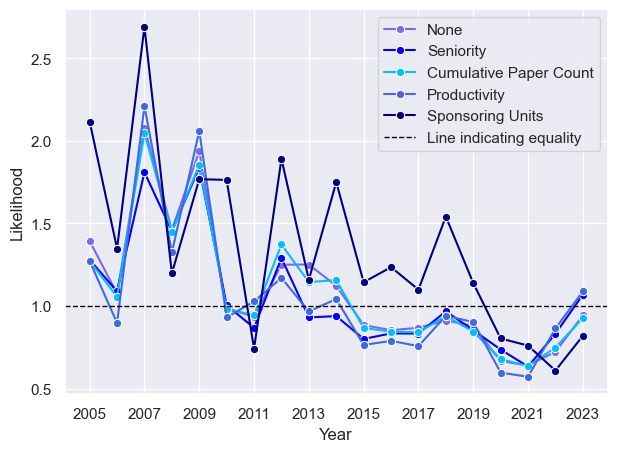

In [467]:
colors = ['mediumslateblue', 'blue', 'deepskyblue', 'royalblue', 'navy']
plotLikelihood([k50, seniorityRemovedStats_males, paperCountRemovedStats_males, productivityRemovedStats_males, unitsRemovedStats_males], colors, False, 'Likelihood', ['None', 'Seniority', 'Cumulative Paper Count', 'Productivity', 'Sponsoring Units'], 'maleLikelihood_featuresRemoved')

### Sponsoring units

In [ ]:
#decide a size of K based on the unit

In [668]:
a = sponsUnitData[['SearchName','Year', 'Gender', 'SessionType']].groupby(['Year', 'Gender']).count().reset_index()
a[a.Gender == 'Female'].min()['SearchName']
#a[a.Gender == 'Female']
#.groupby(['Year', 'Gender']).count()
#.min()

15

In [655]:
invited = sponsUnitData[sponsUnitData.SessionType == 'invited']
invited[['SearchName', 'Year']].groupby('Year').count()

,SearchName
Year,
2005,20
2006,14
2007,15
2008,16
2009,28
2010,27
2011,26
2012,26
2013,34


Code below calculates the relative likelihood for each sponsoring unit. This is done by using the columns `Seniority`, `CumulativePaperCount`, `Productivity` and the one sponsoring unit. This is still one-hot encoded. 

FEd
DPB
DCP


100%|████████████████████████████████████████████| 1/1 [02:30<00:00, 150.19s/it]


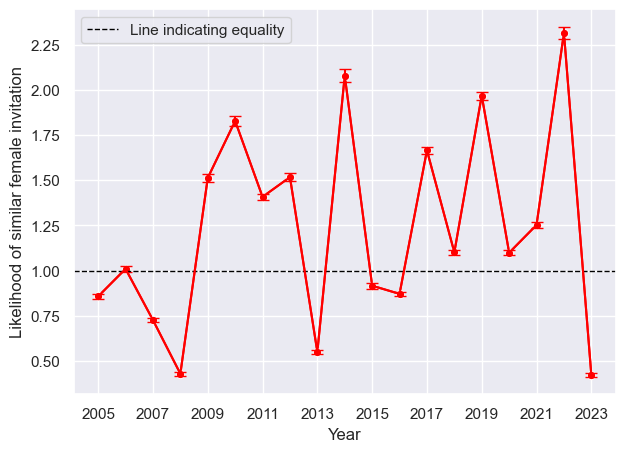

DCMP


100%|████████████████████████████████████████████| 1/1 [08:58<00:00, 538.15s/it]


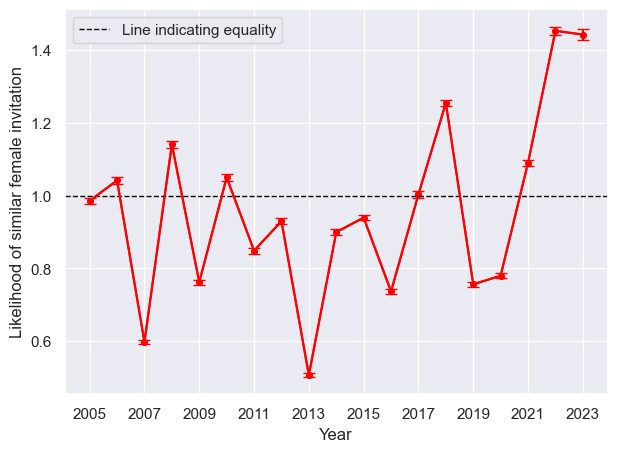

DAMOP


100%|████████████████████████████████████████████| 1/1 [02:28<00:00, 148.47s/it]


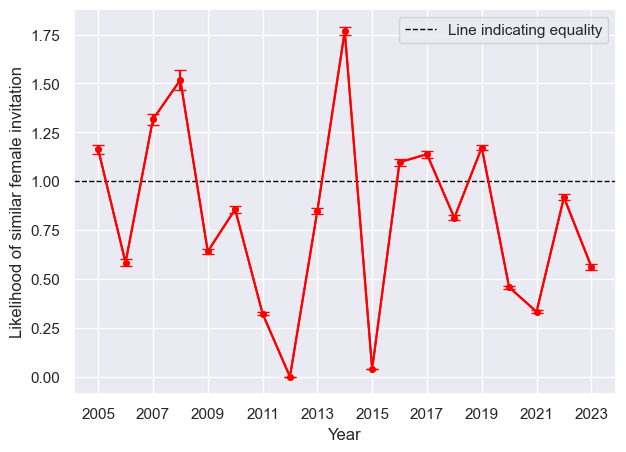

GMAG


100%|████████████████████████████████████████████| 1/1 [05:24<00:00, 324.66s/it]


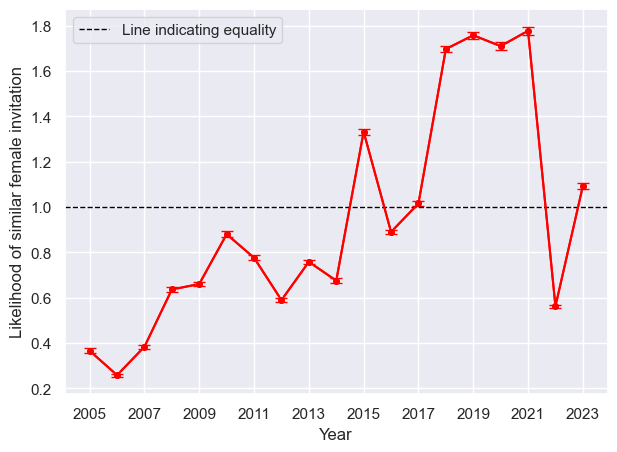

GSNP


100%|████████████████████████████████████████████| 1/1 [03:42<00:00, 222.07s/it]


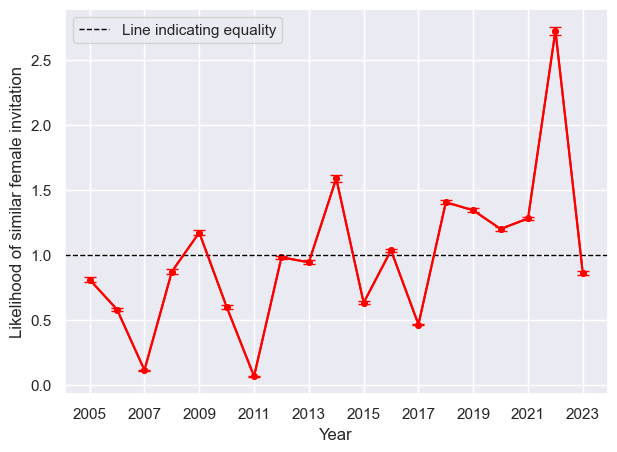

FDI
GPC
FOEP
DFD


  0%|                                                     | 0/1 [00:00<?, ?it/s]/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dm

0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p


0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0
0 0


/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by zero encountered in scalar divide
  likelihood_n = group1_p/group2_p
/var/folders/r3/ssg705k16nn9dmcggt37442r0000gn/T/ipykernel_63194/1865735098.py:20: RuntimeWarning: divide by z

KeyError: 'Likelihood'

In [673]:
#we need to find a way to break for the sponsoring units that don't work

#do as function when working
col = allCols
variables = ['Seniority','CumulativePaperCount', 'Productivity']
likelihoodGender = 'Female' #gender we calculate likelihood for
sponsoringUnits = oneHot_researchers.columns[7:].tolist()
for i in range(0, len(sponsoringUnits)):
    unit = sponsoringUnits[i]
    print(unit)
    sponsUnitData = oneHot_researchers[oneHot_researchers[unit] == 1]
    groupCount = sponsUnitData[['SearchName','Year', 'Gender', 'SessionType']].groupby(['Year', 'Gender']).count().reset_index() #table of count per year and gender
    minGroupSize = groupCount[groupCount.Gender == likelihoodGender].min()['SearchName'] #size of smallest group(grouped by year and gender)
    #minGroupSize = sponsUnitData[['SearchName','Year']].groupby('Year').count().min()[0] #size of smallest group
    if minGroupSize <= 5:
        continue
    elif minGroupSize <= 70:
        if minGroupSize <= 20:
            K = 10
        else:
            K = 25
    else:
        K = 50
    selectedColumns = variables + [unit]
    #do KNN on sponsUnitData
    likelihood_sponsoringUnit = likelihoodEvolution(sponsUnitData, selectedColumns, [K], 'Gender', ['Female', 'Male'], 'manhattan', [0.5], 1000, ['_F', '_M'])
    #get stats
    likelihoodStats = getStats_likelihood(likelihood_sponsoringUnit, 'K')
    #plot relative likelihood
    plotLikelihood([likelihoodStats], ['red'], True, 'Likelihood of similar female invitation', [''], "likelihood_" + unit)
    plt.show()
    #save figure as name with unit

### Potential speakers

In [629]:
potentialSpeakers_ratio, genderMatch = likelihoodEvolution(oneHot_researchers, allCols, [50], 'SessionType', ['attendee', 'invited'], 'manhattan', [0.6], 1000, ['_Att', '_Inv'])

genderMatch_df = genderMatch.reset_index().rename(columns = {'index': 'Year'}) #reset index

100%|█████████████████████████████████████████████| 1/1 [00:05<00:00,  5.70s/it]


In [631]:
#save results
potentialSpeakers_ratio.to_pickle("Files/Dataframes/potentialSpeakers.pkl")  
genderMatch_df.to_pickle("Files/Dataframes/genderMatch.pkl")  

In [632]:
years = potentialSpeakers_ratio.Year.tolist()

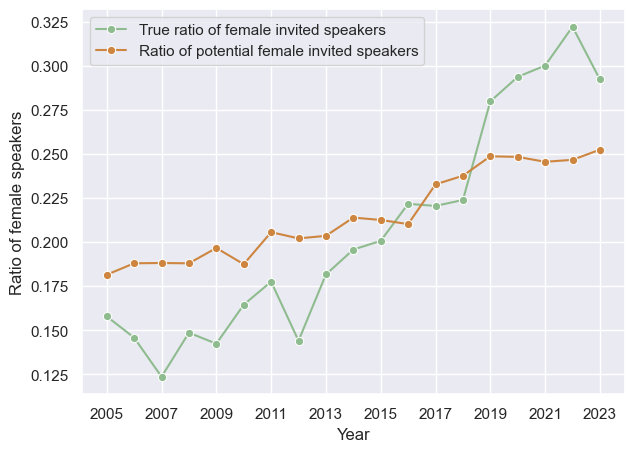

In [634]:
sns.lineplot(data = potentialSpeakers_ratio, x = 'Year', y = 'FemaleSpeakers', marker = 'o', color = 'darkseagreen', label = 'True ratio of female invited speakers')
sns.lineplot(data = potentialSpeakers_ratio, x = 'Year', y = 'PotentialFemaleSpeakers_ratio', marker = 'o', color = 'peru', label = 'Ratio of potential female invited speakers')
plt.xticks(np.arange(min(years), max(years)+1, 2.0))
plt.ylabel('Ratio of female speakers')
plt.legend()
plt.savefig("Figures/femaleSpeakers_ratio.png", bbox_inches = 'tight')
plt.show()

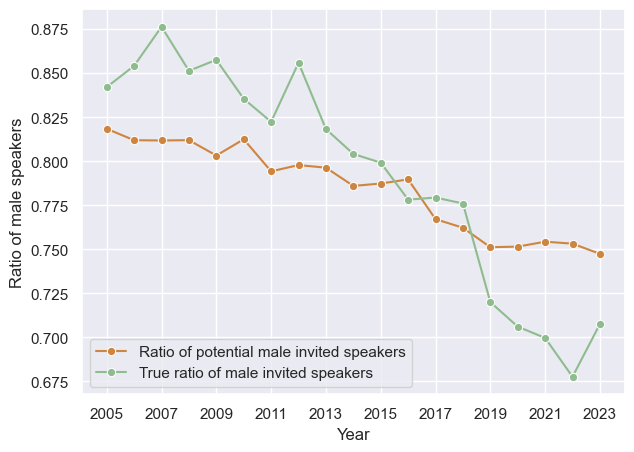

In [636]:
sns.lineplot(data = potentialSpeakers_ratio, x = 'Year', y = 'PotentialMaleSpeakers_ratio', marker = 'o', color = 'peru', label = 'Ratio of potential male invited speakers')
sns.lineplot(data = potentialSpeakers_ratio, x = 'Year', y = 'MaleSpeakers', marker = 'o', color = 'darkseagreen', label = 'True ratio of male invited speakers')
plt.xticks(np.arange(min(years), max(years)+1, 2.0))
plt.ylabel('Ratio of male speakers')
plt.legend()
plt.savefig("Figures/maleSpeakers_ratio.png", bbox_inches = 'tight')
plt.show()

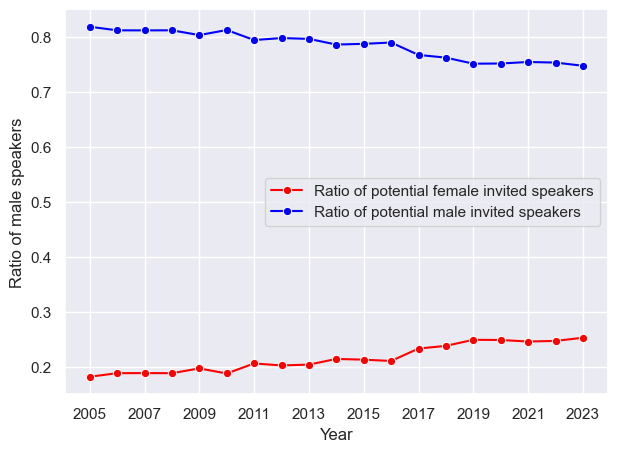

In [638]:
sns.lineplot(data = potentialSpeakers_ratio, x = 'Year', y = 'PotentialFemaleSpeakers_ratio', marker = 'o', color = 'red', label = 'Ratio of potential female invited speakers')
sns.lineplot(data = potentialSpeakers_ratio, x = 'Year', y = 'PotentialMaleSpeakers_ratio', marker = 'o', color = 'blue', label = 'Ratio of potential male invited speakers')
plt.xticks(np.arange(min(years), max(years)+1, 2.0))
plt.ylabel('Ratio of male speakers')
plt.legend()
plt.savefig("Figures/potentialSpeakers_ratio.png", bbox_inches = 'tight')
plt.show()

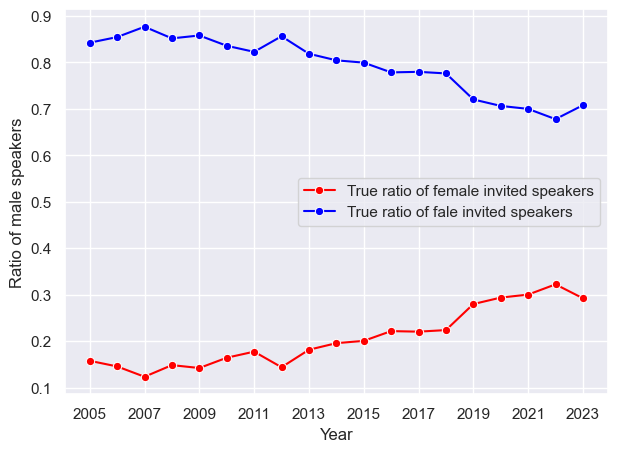

In [641]:
sns.lineplot(data = potentialSpeakers_ratio, x = 'Year', y = 'FemaleSpeakers', marker = 'o', color = 'red', label = 'True ratio of female invited speakers')
sns.lineplot(data = potentialSpeakers_ratio, x = 'Year', y = 'MaleSpeakers', marker = 'o', color = 'blue', label = 'True ratio of fale invited speakers')
plt.xticks(np.arange(min(years), max(years)+1, 2.0))
plt.ylabel('Ratio of male speakers')
plt.legend()
plt.savefig("Figures/trueInvited_ratio.png", bbox_inches = 'tight')
plt.show()

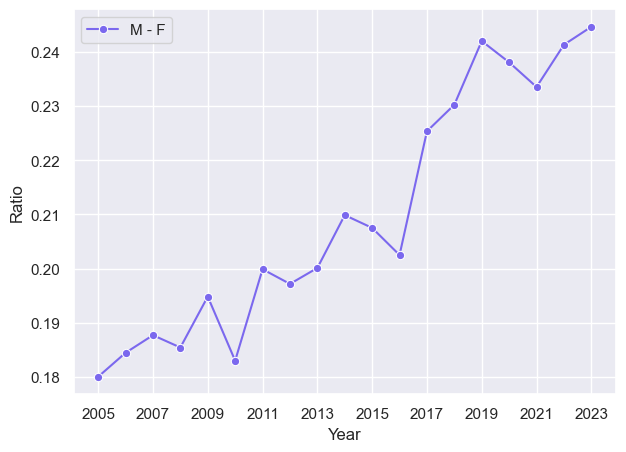

In [643]:
sns.lineplot(data = genderMatch_df, x = 'Year', y = 'Male, Female', marker = 'o', color = 'mediumslateblue', label = 'M - F')
plt.ylabel('Ratio')
plt.xticks(np.arange(min(years), max(years)+1, 2.0))
plt.savefig("Figures/genderRelation_MF.png", bbox_inches = 'tight')
plt.show()

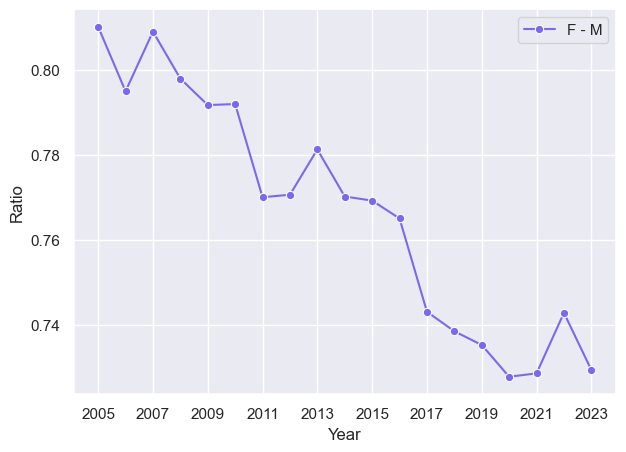

In [645]:
sns.lineplot(data = genderMatch_df, x = 'Year', y = 'Female, Male', marker = 'o', color = 'mediumslateblue', label = 'F - M')
plt.ylabel('Ratio')
plt.xticks(np.arange(min(years), max(years)+1, 2.0))
plt.savefig("Figures/genderRelation_FM.png", bbox_inches = 'tight')
plt.show()

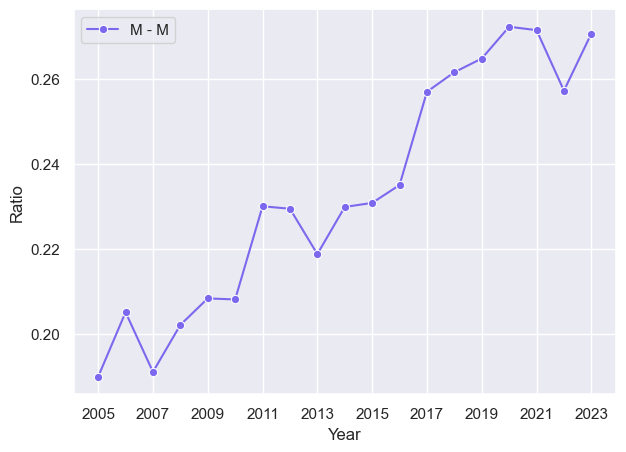

In [647]:
sns.lineplot(data = genderMatch_df, x = 'Year', y = 'Female, Female', marker = 'o', color = 'mediumslateblue', label = 'M - M')
plt.ylabel('Ratio')
plt.xticks(np.arange(min(years), max(years)+1, 2.0))
plt.savefig("Figures/genderRelation_FF.png", bbox_inches = 'tight')
plt.show()

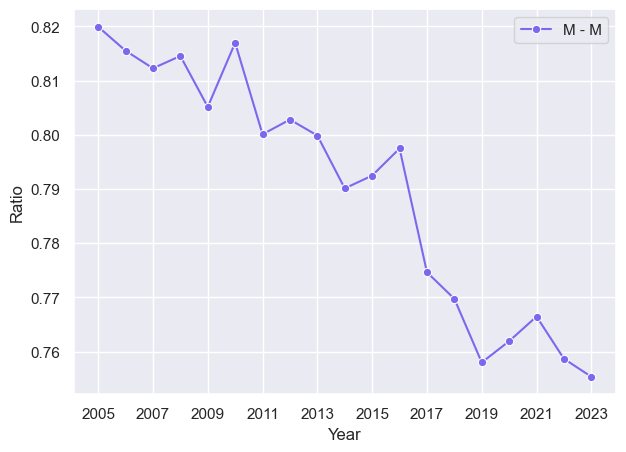

In [646]:
sns.lineplot(data = genderMatch_df, x = 'Year', y = 'Male, Male', marker = 'o', color = 'mediumslateblue', label = 'M - M')
plt.ylabel('Ratio')
plt.xticks(np.arange(min(years), max(years)+1, 2.0))
plt.savefig("Figures/genderRelation_MM.png", bbox_inches = 'tight')
plt.show()

In [648]:
genderMatch_df.corr()

,Year,"Female, Female","Female, Male","Male, Female","Male, Male"
Year,1.000000,0.957279,-0.957279,0.955810,-0.955810
"Female, Female",0.957279,1.000000,-1.000000,0.958183,-0.958183
"Female, Male",-0.957279,-1.000000,1.000000,-0.958183,0.958183
"Male, Female",0.955810,0.958183,-0.958183,1.000000,-1.000000
"Male, Male",-0.955810,-0.958183,0.958183,-1.000000,1.000000


In [806]:
#the correlation shows, that with time there are les Male, Male matches(because females look more like the males, as there comes more females)
#there come more Female, Male matches, meaning more and more males looks like females.
#There do also come more female-female matches, meaning that there is more females looking like females(because there are more females as time goes)


#now do correlation and plot in some smart way(you could look at Marie, but do some thinking before just doing it)

My own interpretation is, that the one that the females that are most likely to be invited, is not the ones that are most similar to females. 
Is there any way we could find the likelihood of females being invited in general, or would that just be what we already have? Because it seems that the lower K, the lower likelihood.


Choosing K.
The reason we are choosing K = 10, is that using euclidean, we see one pattern for K = 1 or K = 5 and for K >= 10. The pattern we see for K >= 10 is similar to the pattern for other distance metrics. 

# Old code

In [61]:
def KNN(df, groupFeature, groups, year, allFeatures, oneHotFeatures_n, standardizeFeatures_n, K, q, seniorityFilter): 
        
    group1 = df[df[groupFeature] == groups[0]].reset_index(drop = True)
    group2 = df[df[groupFeature] == groups[1]].reset_index(drop = True)
    
    neighbors = NearestNeighbors(n_neighbors=K).fit(group1[allFeatures].to_numpy())
    oneHot_weight = np.repeat(1/oneHotFeatures_n, oneHotFeatures_n) #weight for one-hot encoded features
    other_weight = np.repeat(1, standardizeFeatures_n) #weight for the other features
    weights = np.hstack((oneHot_weight, other_weight)) 
    
    neighbors = NearestNeighbors(n_neighbors=K, metric='minkowski', p = 1.5, metric_params={'w': weights}, n_jobs = -1).fit(group1[allFeatures].to_numpy())
    neighbors = NearestNeighbors(n_neighbors=K).fit(group1[allFeatures].to_numpy())
    kNeighbor_dist, kNeighbor_ind = neighbors.kneighbors(group2[allFeatures].to_numpy()) 
                                    
    threshold = np.quantile(kNeighbor_dist.flatten(), q) #q quantile
    indices = kNeighbor_ind.copy().astype(float) #get indices of five nearest neighbors of all males
    indices[~(kNeighbor_dist <= threshold)] = np.nan #set indices to nan if their distance is higher than the threshold
    
    if seniorityFilter == False: #only plot if we don't filter on seniority
        plotYearlyDistances(kNeighbor_dist, threshold, year, K, groupFeature) #plot yearly distances
    return indices, group1, group2

In [315]:
#def likelihood(indices, df1, df2, suffixes, groupFeature, feature): #df1 is females/attendees, df2 is males/invited
def likelihood(ratio_group1, ratio_group2, feature):
   
    #similarResearchers_df = pd.DataFrame(data = df2['SessionType'])
    #similarResearchers_df = pd.DataFrame(data = df2[feature])
    #index_rand = [np.random.choice(i, 1)[0] for i in indices] #randomly select index for each row
    #similarResearchers_df['SimilarIndex'] = index_rand #create column with the random similar indices
    #similarResearchers_df = similarResearchers_df.dropna(subset = 'SimilarIndex') #drop rows where the researchers are not similar enough
    #similar = df1.iloc[similarResearchers_df.SimilarIndex][['SessionType']] #the random selected similar researchers
    #similar = df1.iloc[similarResearchers_df.SimilarIndex][[feature]] #the random selected similar researchers
    #similarResearchers = pd.merge(similarResearchers_df, similar, left_on = 'SimilarIndex', right_on = similar.index, how = 'inner', suffixes=(suffixes[1], suffixes[0]))
    #same females are similar to different males
    
    #calculate likelihood
    #group1 = similarResearchers['SessionType' + suffixes[0]].value_counts(normalize = True)
    #group2 = similarResearchers['SessionType' + suffixes[1]].value_counts(normalize = True)
    #group1 = similarResearchers[feature + suffixes[0]].value_counts(normalize = True)
    #group2 = similarResearchers[feature + suffixes[1]].value_counts(normalize = True)
    
    if feature in ratio_group1.index:
        group1_p = ratio_group1.loc[feature]
    else:
        group1_p = 0
        
    if feature in ratio_group2.index:
        group2_p = ratio_group2.loc[feature]
    else:
        group2_p = 0
    
    likelihood_n = group1_p/group2_p
    
    return likelihood_n

In [316]:
#delete
#def RelativeLikelihood_stats(df): #calculate average relative likelihood per year
#    likelihood_dict = {}
#    yearList = np.sort(df.Year.unique())
#    for y in yearList:
#        avg_likelihood = df[df.Year == y].Likelihood.mean()
#        std_likelihood = df[df.Year == y].Likelihood.std()
#        likelihood_dict[y] = {'Avg_likelihood': avg_likelihood, 'Std_likelihood': std_likelihood}
#    return likelihood_dict

In [103]:
#delete
#def avgRatio(df): #calculate avg_ratio
#    ratio_dict = {}
#    yearList = np.sort(df.Year.unique())
#    for y in yearList:
#        avg_ratio = df[df.Year == y].Ratio.mean()
#        std_ratio = df[df.Year == y].Ratio.std()
#        ratio_dict[y] = {'Avg_ratio': avg_ratio, 'Std_ratio': std_ratio}
#    return ratio_dict

In [22]:
def avgLikelihood_heatmap(df, K):
    index = 0
    likelihood_dict = {}
    yearList = np.sort(df.Year.unique())
    seniorityCat = df.Seniority.unique()
    for y in yearList:
        for i in seniorityCat:
            avg_likelihood = df[(df.Year == y) & (df.Seniority == i)].Likelihood.mean()
            std_likelihood = df[(df.Year == y) & (df.Seniority == i)].Likelihood.std()
            likelihood_dict[index] = {'Year': y, 'Seniority': i, 'Avg_likelihood': avg_likelihood, 'Std_likelihood': std_likelihood}
            index += 1
            
    likelihood_df =  pd.DataFrame.from_dict(likelihood_dict, orient = 'index') 
    likelihood_pivot = likelihood_df.pivot(index = 'Year', columns = 'Seniority', values = 'Avg_likelihood')
    xlabels = ['0-5', '6-10', '11-15', '16-20', '21-25', '26-30', '> 30']
    
    #log_norm = LogNorm(vmin=likelihood_pivot.min().min(), vmax=likelihood_pivot.max().max())
     #norm = log_norm
    sns.heatmap(likelihood_pivot, annot=True, xticklabels = xlabels)
    plt.title('Evolution of likelihood of female invitations for different seniority with K = ' + str(K))
    plt.savefig('Figures/likelihoodHeatmap_' + str(K) + 'Neighbors.png', bbox_inches='tight')
    plt.show()

In [249]:
def plotRatio(df, k):
    years = df.index.tolist()

    sns.lineplot(data = df, x = df.index, y = 'Avg_FemaleInvRatio', marker = 'o', color = 'darkseagreen', label = 'True ratio of female invited speakers')
    sns.lineplot(data = df, x = df.index, y = 'Avg_FemaleAttRatio', marker = 'o', color = 'peru', label = 'Ratio of potential invited speakers')
    plt.errorbar(x = df.index, y = df['Avg_FemaleInvRatio'], yerr = df['Std_FemaleInvRatio'], color = 'darkseagreen', capsize = 4)
    plt.errorbar(x = df.index, y = df['Avg_FemaleAttRatio'], yerr = df['Std_FemaleAttRatio'], color = 'peru', capsize = 4)
    plt.xticks(np.arange(min(years), max(years)+1, 2.0))
    plt.xlabel('Year')
    plt.ylabel('Ratio')
    plt.title("Evolution of ratio of true and potential invited speakers = " + str(k) + " neighbors")
    plt.savefig("Figures/ratioEvolution_PotentialInv" + str(k) + "Neighbors.png", bbox_inches='tight')
    plt.show()

In [23]:
def likelihoodEvolution(df, standardizeFeatures, allFeatures, K, q, N, groupFeature, groups, seniorityFilter, suffixes, sessionType): #calculate likelihood of females being invited as speakers over the years
    likelihood_dict = {}
    index = 0
    researchers = df.copy()
    n_oneHotFeatures = len(allFeatures) - len(standardizeFeatures) #number of features from one-hot encoding
    standardizeFeatures_n = len(standardizeFeatures)
    
    for c in standardizeFeatures:
        researchers[c] = standardizeColumn(researchers, c) #standardize data
    
    for k in tqdm(K):
        yearList = np.sort(researchers.Year.unique())
        for y in yearList:
        #for y in yearList:
            year_df = researchers[researchers.Year == y] #get all data from year y
            if seniorityFilter == True:
                seniorityLabels = year_df.Seniority_cat.unique().tolist()
                for i in seniorityLabels:
                    cat_df = year_df[year_df.Seniority_cat == i]
                    indices, group1, group2 = KNN(cat_df, groupFeature, groups, y, allFeatures, n_oneHotFeatures, standardizeFeatures_n, k, q, seniorityFilter)                             
                    #calculate likelihood
                    for n in range(0,N):
                        lh = likelihood(indices, group1, group2, suffixes, sessionType)
                        likelihood_dict[index] = {'Year': y, 'Seniority': i, 'Iteration': n, 'Likelihood': lh}
                        index += 1

            else:
                indices, group1, group2 = KNN(df, groupFeature, groups, y, allFeatures, n_oneHotFeatures, standardizeFeatures_n, k, q, seniorityFilter)
                #calculate likelihood
                for n in range(0,N):
                    lh = likelihood(indices, group1, group2, suffixes, sessionType)
                    likelihood_dict[index] = {'Year': y, 'Iteration': n, 'Likelihood': lh}
                    index += 1
    
            
        likelihood_df = pd.DataFrame.from_dict(likelihood_dict, orient='index') #create df with likelihood
        
        
        if seniorityFilter == True:
            avgLikelihood_heatmap(likelihood_df, k)


        else:
            likelihood_stats = RelativeLikelihood_stats(likelihood_df) #calculate average and standard deviation
            likelihood_stats_df = pd.DataFrame.from_dict(likelihood_stats, orient = 'index') #create df with stats on likelihood
            plotLikelihood(likelihood_stats_df, k) #plot likelihood
            
            
#now try with False with seniority filter
#then try with invited and non-invited

In [317]:
###test of how we can make function work with similar females, similar females within same seniority, attendees similar to invited speakers
def likelihoodEvolutions(df, allFeatures, K, N, groupFeature, seniorityFilter):
    standardizeFeatures = ['Seniority', 'CumulativePaperCount', 'Productivity'] #features to standardize
    q = 0.5 #quantile
    likelihood_dict = {}
    ratio_dict = {}
    index = 0
    standardizeFeatures_n = len(standardizeFeatures) #number of features to standardize
    n_oneHotFeatures = len(allFeatures) - standardizeFeatures_n #number of features from one-hot encoding
    researchers = df.copy()
    
    for c in standardizeFeatures:
        researchers[c] = standardizeColumn(researchers, c) #standardize data
    
    for k in tqdm(K): 
        yearList = np.sort(researchers.Year.unique())
        for y in yearList:
            year_df = researchers[researchers.Year == y] #filter by year
            if groupFeature == 'Gender':
                groups = ['Female', 'Male']
                suffixes = ['_F', '_M']
                analysisFeature = 'SessionType'
                if seniorityFilter == True:
                    seniorityLabels = year_df.Seniority_cat.unique().tolist()
                    for i in seniorityLabels:
                        cat_df = year_df[year_df.Seniority_cat == i]
                        indices, females, males = KNN(cat_df, groupFeature, groups, y, allFeatures, n_oneHotFeatures, standardizeFeatures_n, k, q, seniorityFilter)
                        #calcualte likelihood
                        for n in range(0,N):
                            ratio1, ratio2 = getRatio(indices, females, males, suffixes, analysisFeature)
                            lh = likelihood(ratio1, ratio2, 'invited')
                            #lh = likelihood(indices, females, males, suffixes, groupFeature, analysisFeature)
                            likelihood_dict[index] = {'Year': y, 'Seniority': i, 'Iteration': n, 'Likelihood': lh}
                            index += 1
                            
                else:
                    indices, females, males = KNN(year_df, groupFeature, groups, y, allFeatures, n_oneHotFeatures, standardizeFeatures_n, k, q, seniorityFilter)
                    #calculate likelihood
                    for n in range(0,N):
                        ratio1, ratio2 = getRatio(indices, females, males, suffixes, analysisFeature)
                        lh = likelihood(ratio1, ratio2, 'invited')
                        likelihood_dict[index] = {'Year': y, 'Iteration': n, 'Likelihood': lh}
                        index += 1
                        
            elif groupFeature == 'SessionType':
                groups = ['attendee', 'invited']
                suffixes = ['_att', '_inv']
                analysisFeature = 'Gender'
                
                indices, attendees, invited = KNN(year_df, groupFeature, groups, y, allFeatures, n_oneHotFeatures, standardizeFeatures_n, k, q, seniorityFilter)
                #calculate likelihood
                for n in range(0, N):
                    ratio_att, ratio_inv = getRatio(indices, attendees, invited, suffixes, analysisFeature) 
                    ratio_att_F = ratio_att.loc['Female'] #ratio of female attendees
                    ratio_inv_F = ratio_inv.loc['Female'] #ratio of female invited
                    ratio_dict[index] = {'Year': y, 'Iteration': n, 'FemaleInvRatio': ratio_inv_F, 'FemaleAttRatio': ratio_att_F}
                    index += 1
        
        if groupFeature == 'Gender':
            print(groupFeature)
            likelihood_df = pd.DataFrame.from_dict(likelihood_dict, orient = 'index') #create df with likelihood
            if seniorityFilter == True:
                avgLikelihood_heatmap(likelihood_df, k)
            else:
                #likelihood_stats = RelativeLikelihood_stats(likelihood_df) #calculate average and standard deviation
                likelihood_stats = getStats(likelihood_df, 'Likelihood')  #calculate average and standard deviation
                likelihood_stats_df = pd.DataFrame.from_dict(likelihood_stats, orient = 'index') #create df with stats on likelihood
                plotLikelihood(likelihood_stats_df, k) #plot likelihood
        
        else: #when groupFeature is SessionType
            ratio_df = pd.DataFrame.from_dict(ratio_dict, orient = 'index') #create df with likelihood
            #ratio_stats = avgRatio(df)
            ratioInv_stats = pd.DataFrame.from_dict(getStats(ratio_df, 'FemaleInvRatio'), orient = 'index')  #calculate average and standard deviation for female invited
            ratioAtt_stats = pd.DataFrame.from_dict(getStats(ratio_df, 'FemaleAttRatio'), orient = 'index') #calculate average and standard deviation for female attendees
            ratio_stats_df = pd.merge(ratioInv_stats, ratioAtt_stats, left_index = True, right_index = True)
#            pd.DataFrame.from_dict(ratio_stats, orient = 'index') #create df with stats on likelihood
            plotRatio(ratio_stats_df, k)
           
        
        
       

            
#now try with False with seniority filter
#then try with invited and non-invited

In [318]:
allCols = knownUnits
allCols += ['Seniority', 'CumulativePaperCount', 'Productivity']

  0%|                                                     | 0/6 [00:00<?, ?it/s]

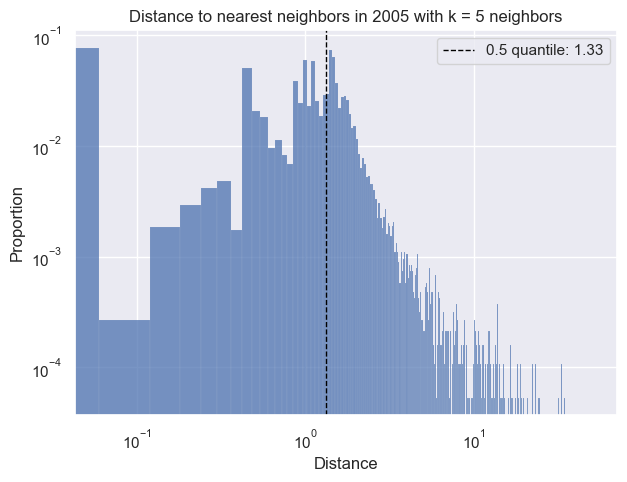

  0%|                                                     | 0/6 [00:03<?, ?it/s]

KeyboardInterrupt



In [322]:
#likelihood of similar females being invited
likelihoodEvolutions(oneHot_researchers, allCols, [5, 10, 20, 30, 40, 50], 1000, 'Gender', False)

  0%|                                                     | 0/6 [00:00<?, ?it/s]

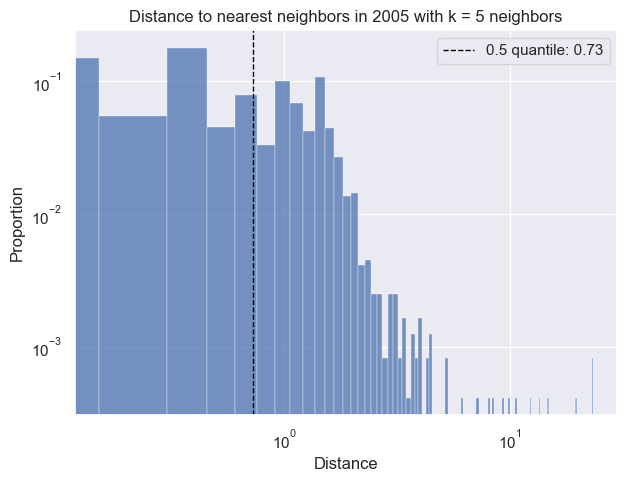

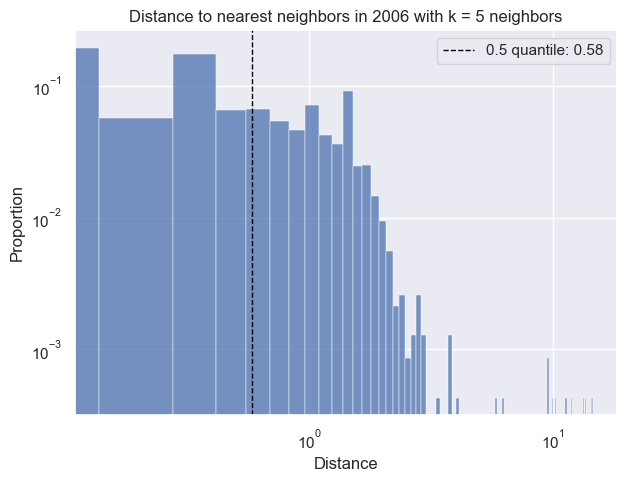

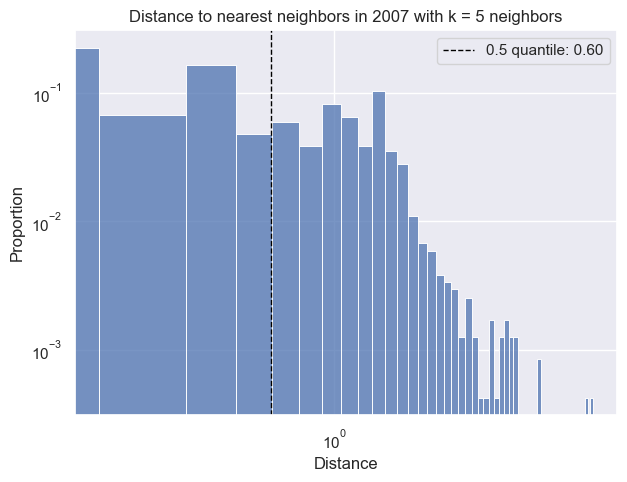

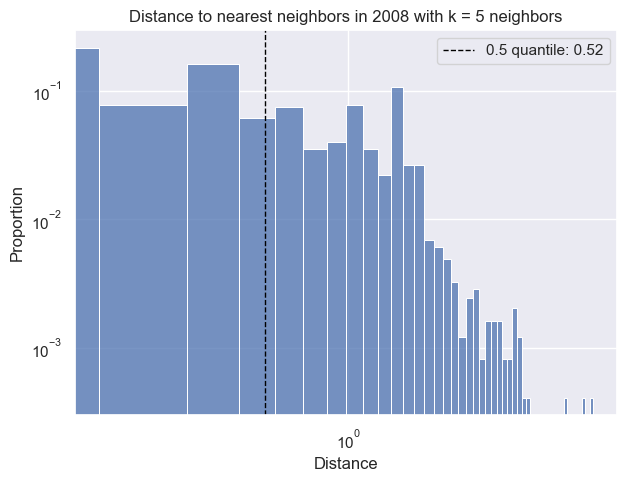

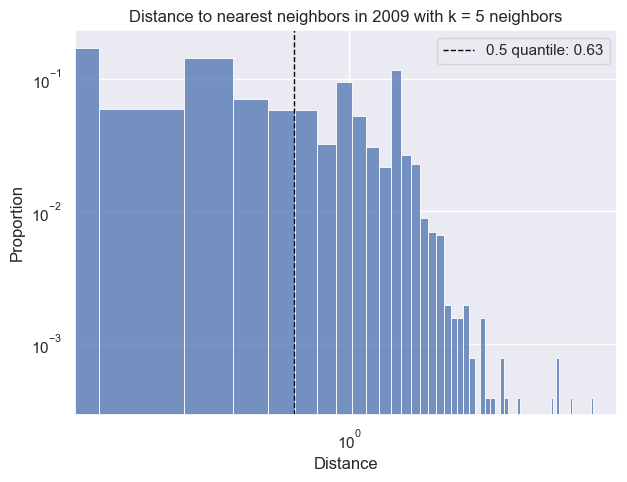

...

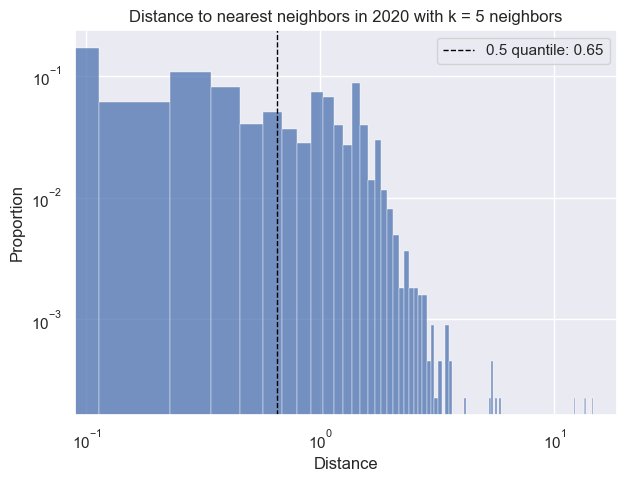

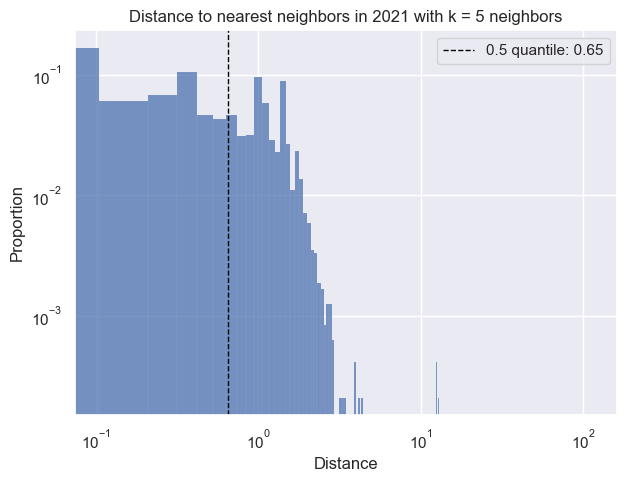

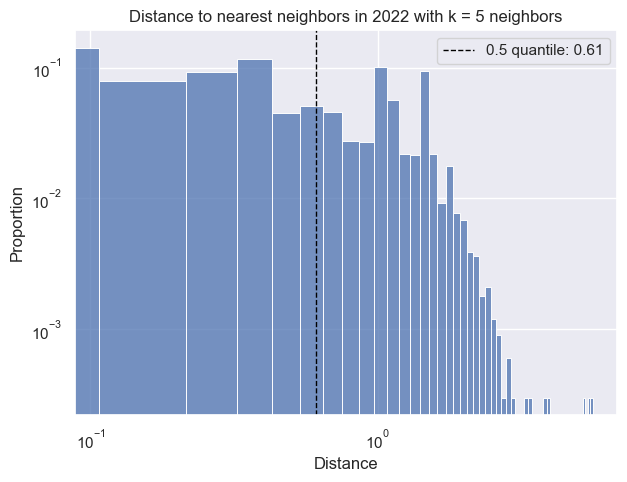

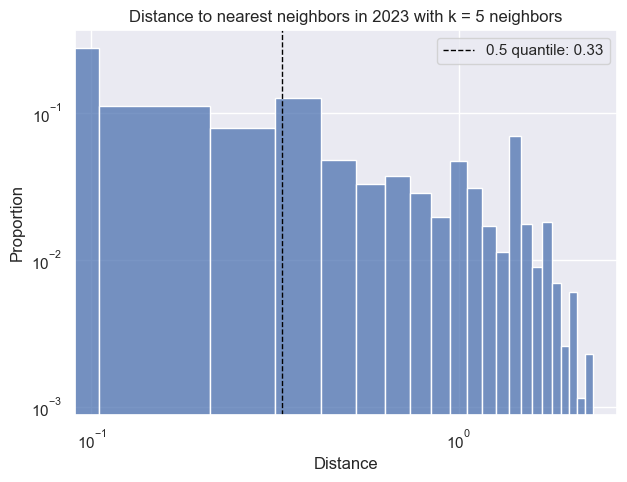

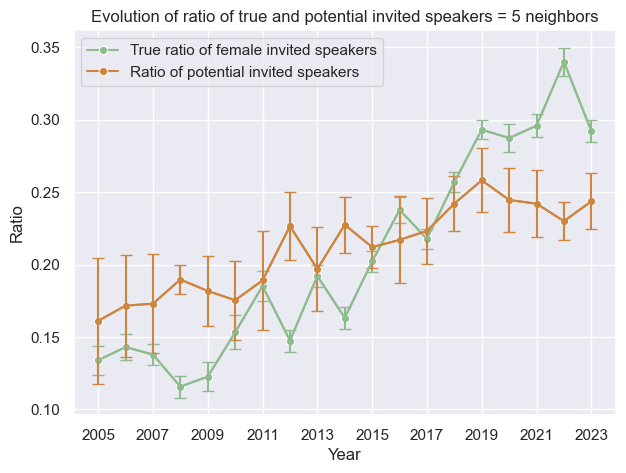

 17%|███████▌                                     | 1/6 [00:23<01:59, 23.88s/it]

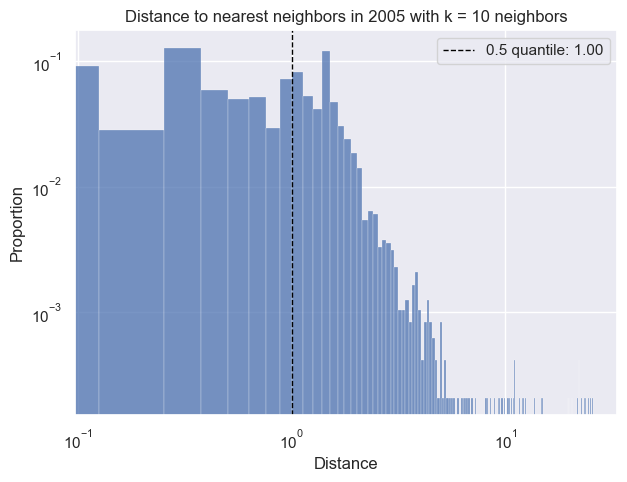

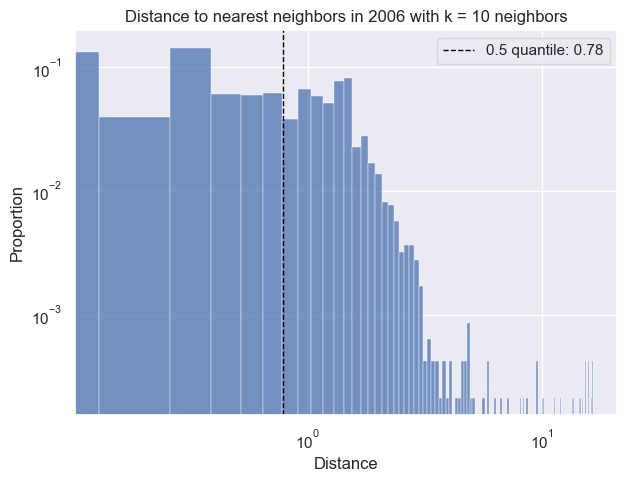

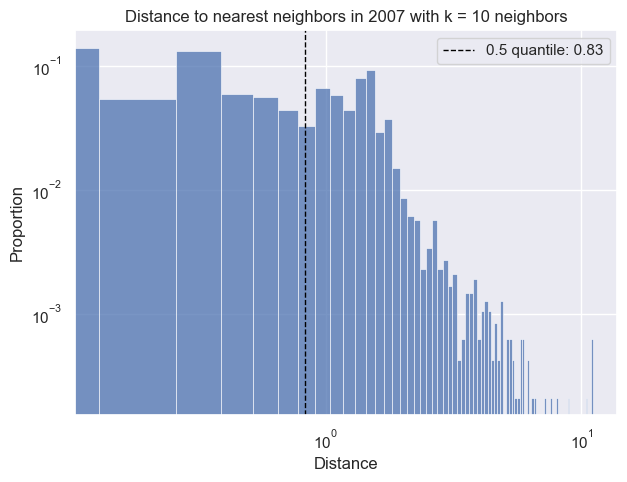

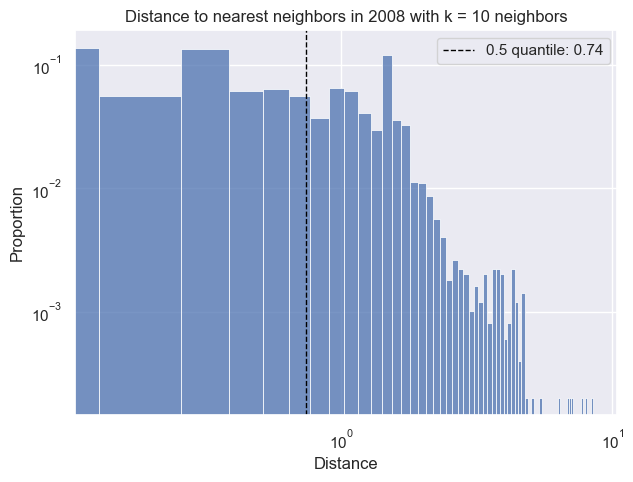

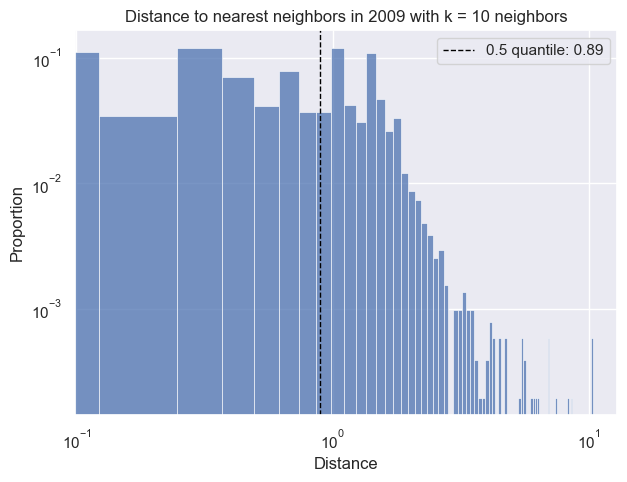

...

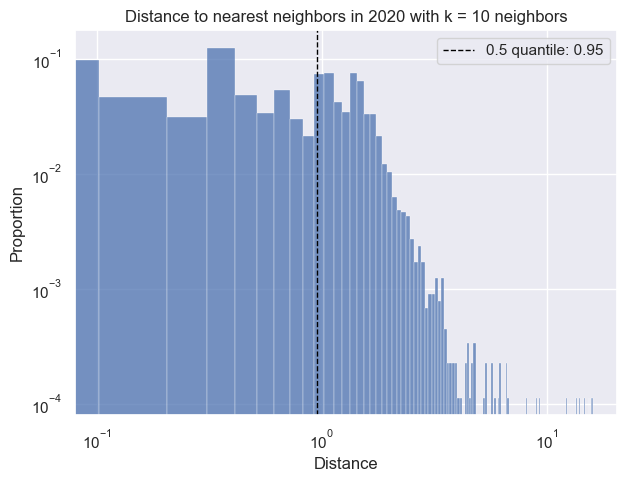

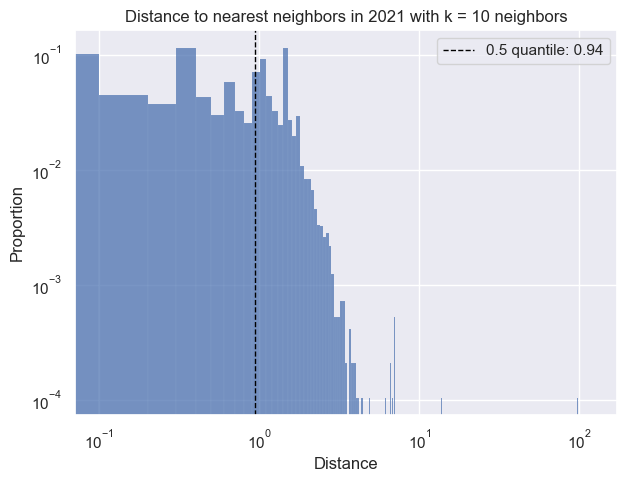

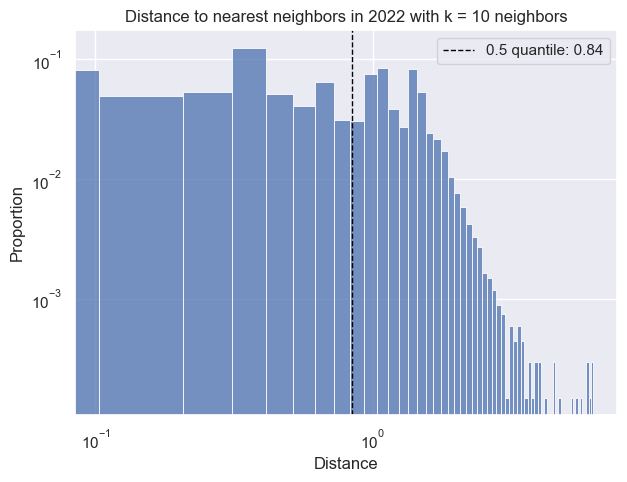

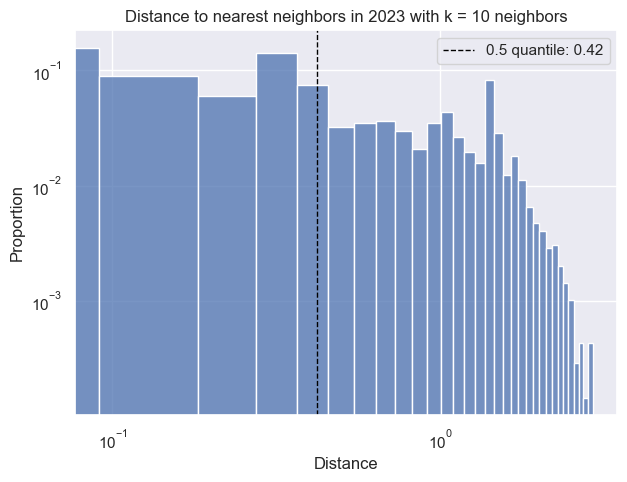

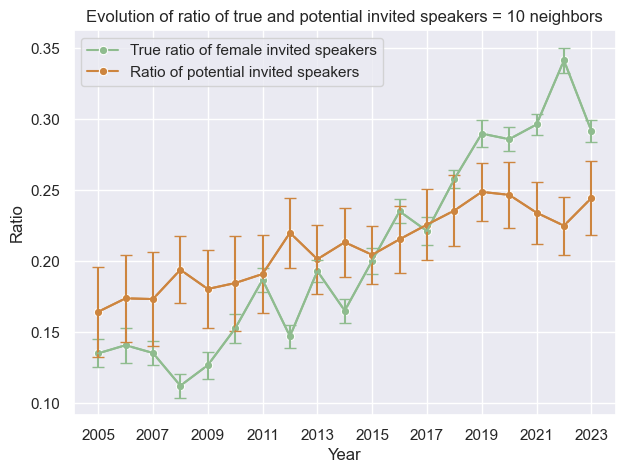

 33%|███████████████                              | 2/6 [00:47<01:34, 23.71s/it]

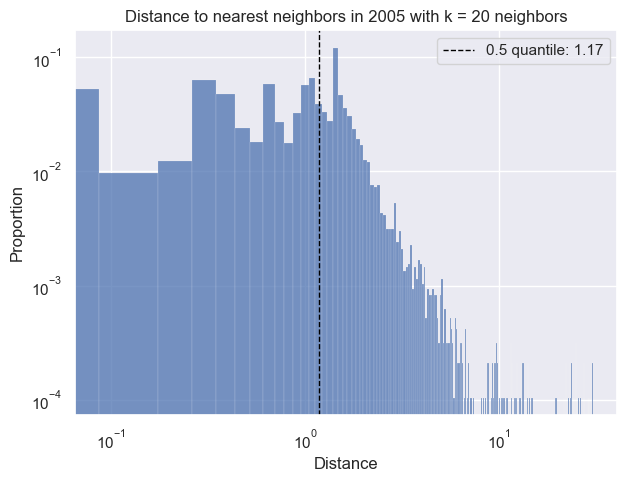

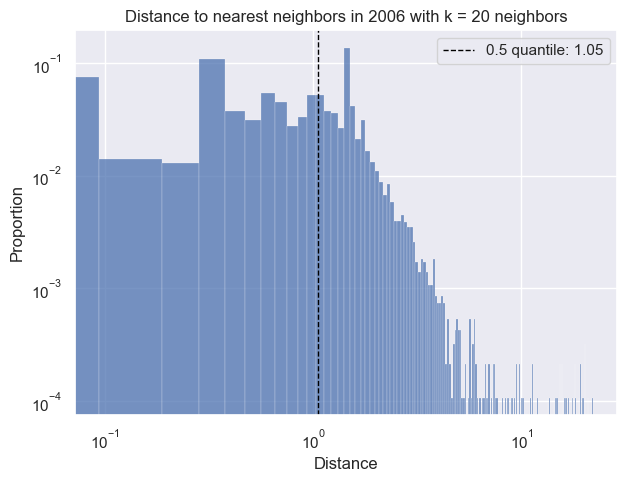

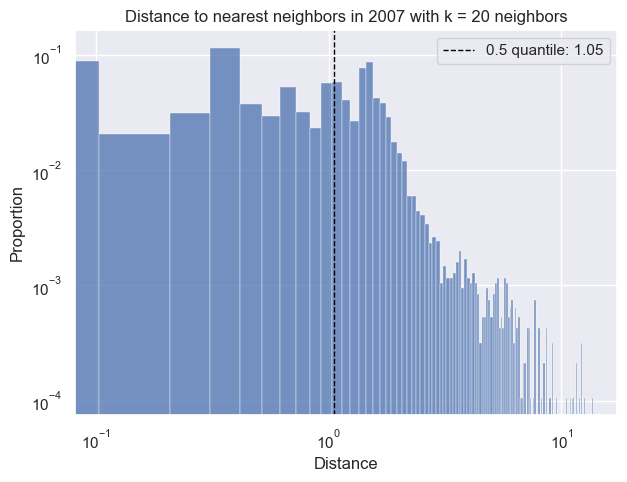

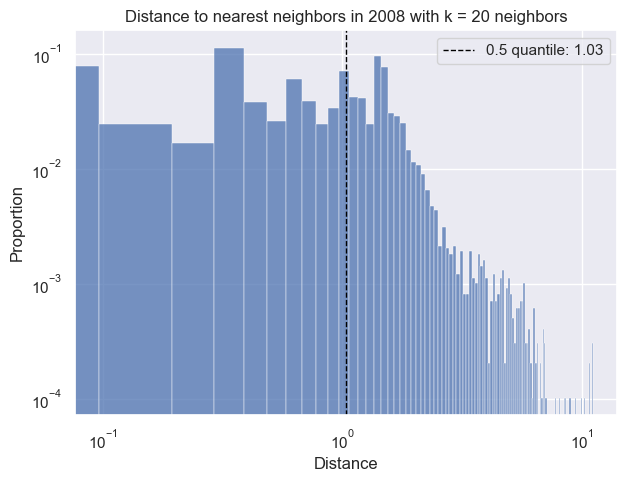

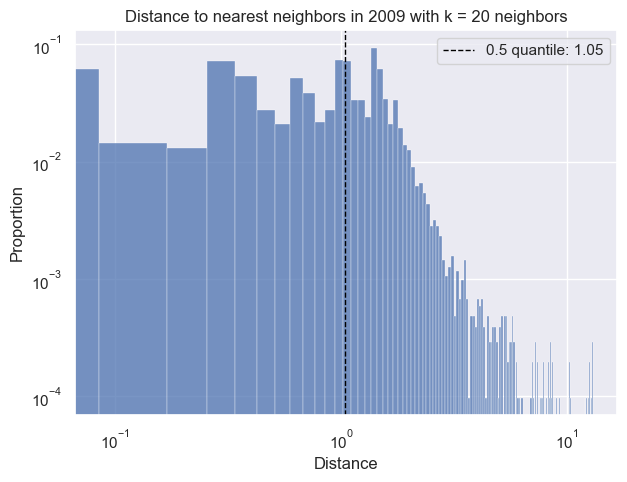

...

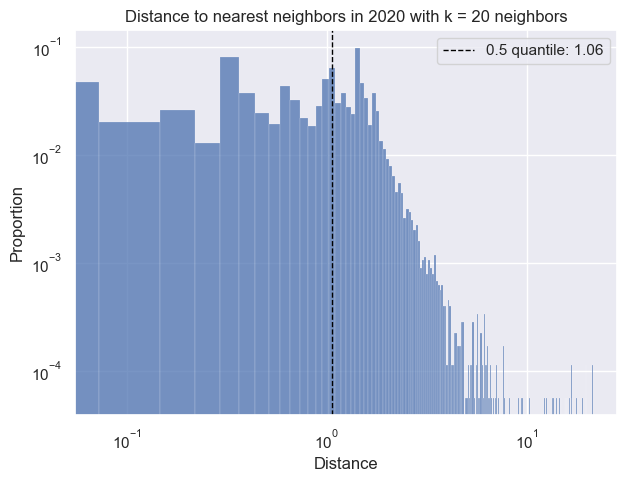

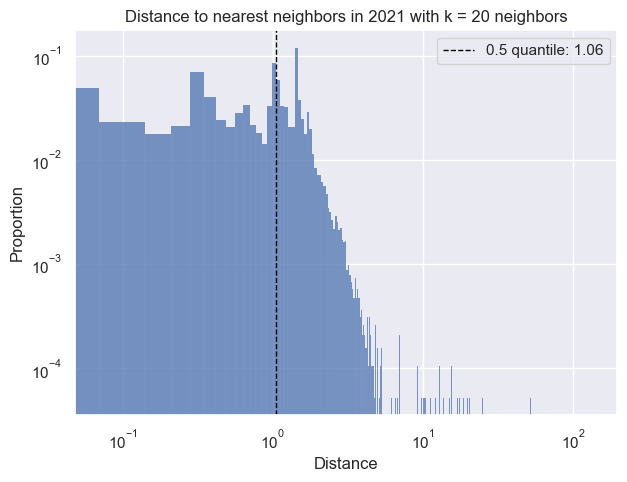

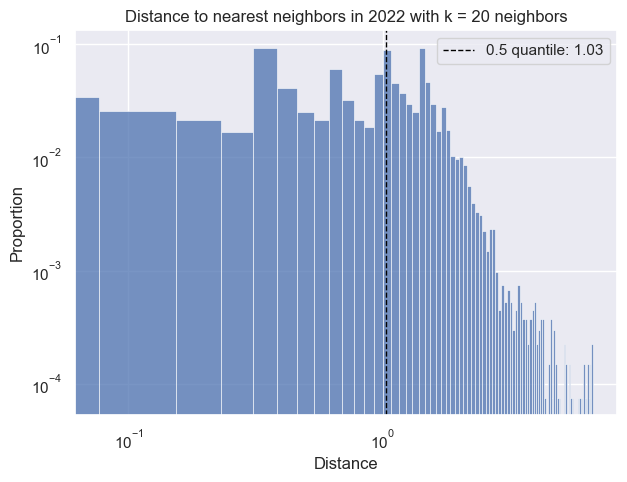

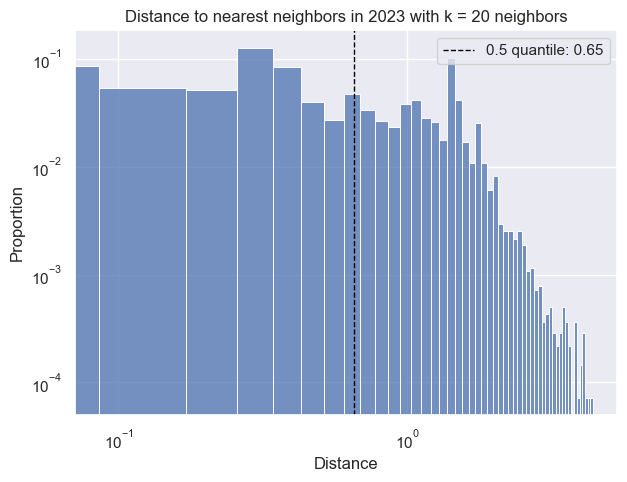

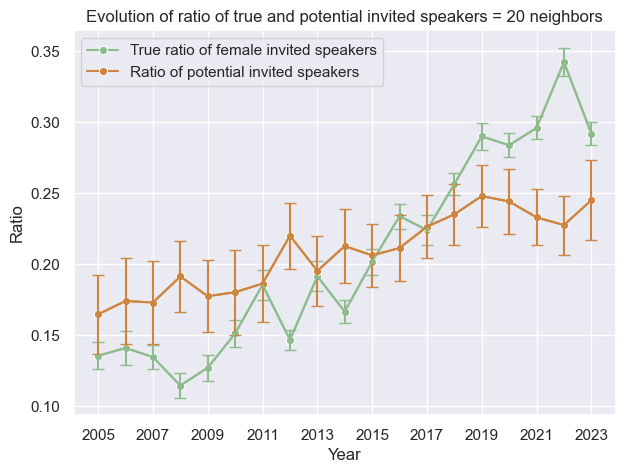

 50%|██████████████████████▌                      | 3/6 [01:16<01:18, 26.13s/it]

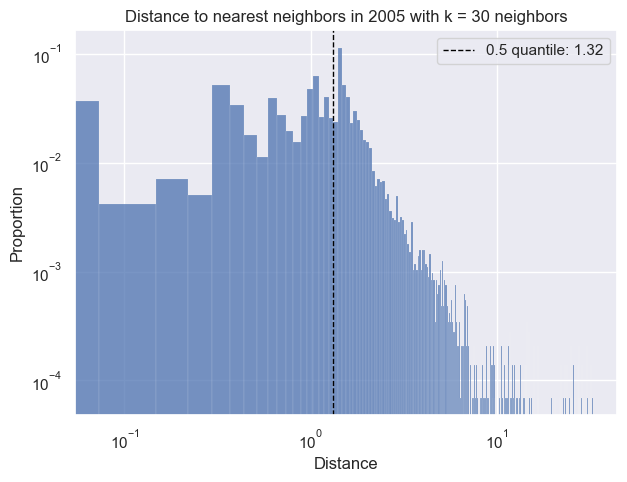

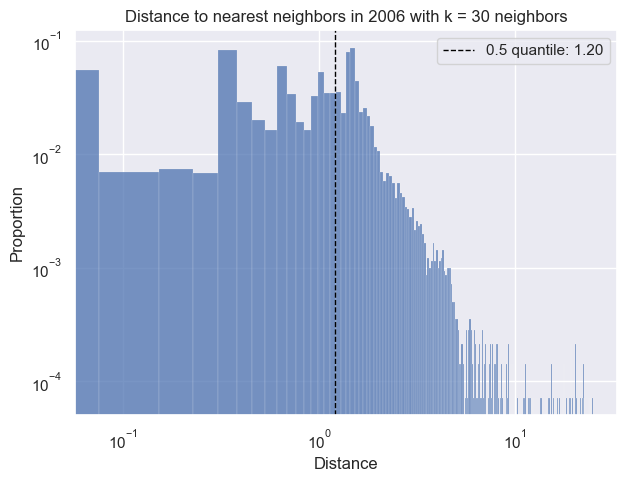

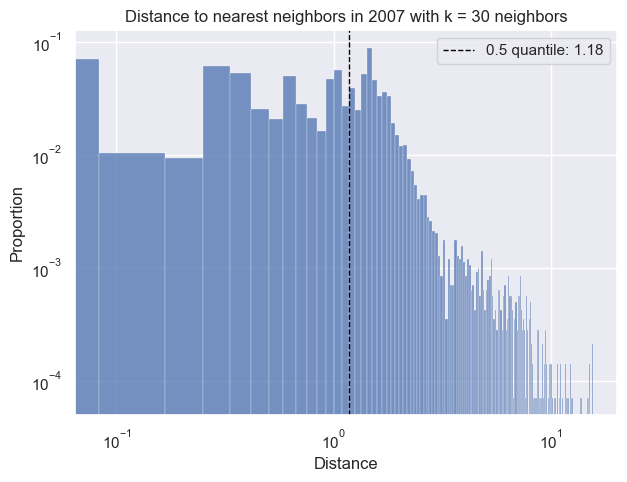

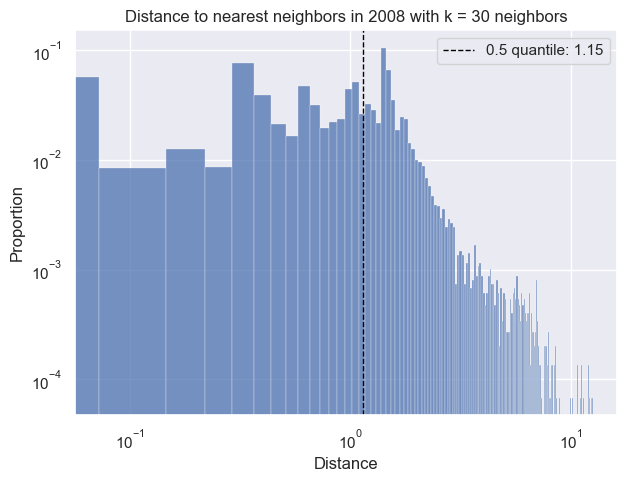

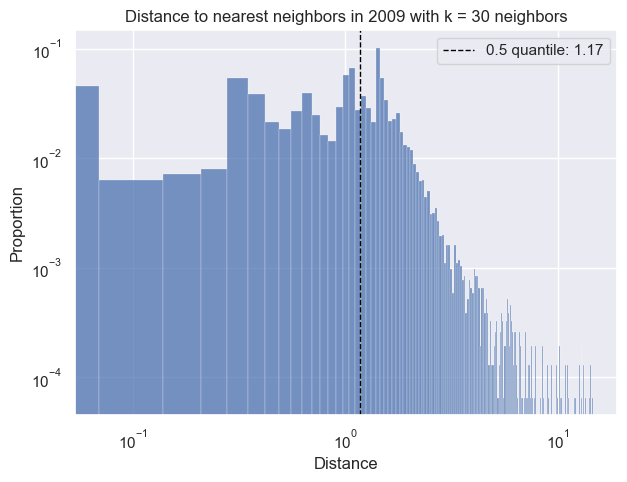

...

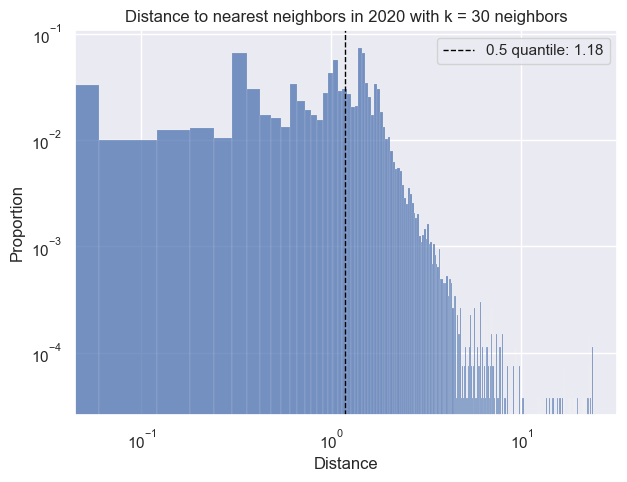

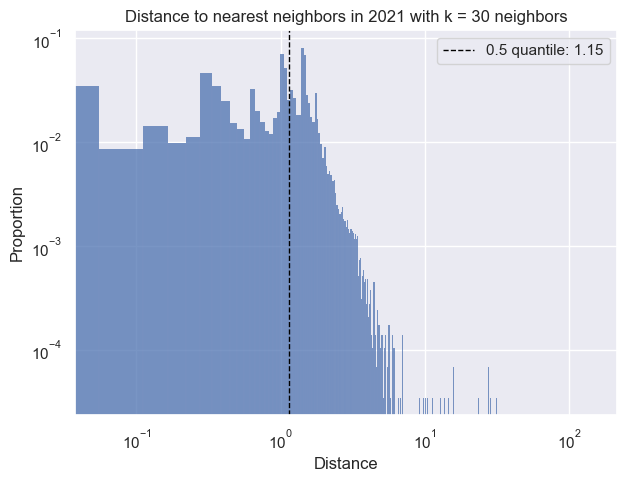

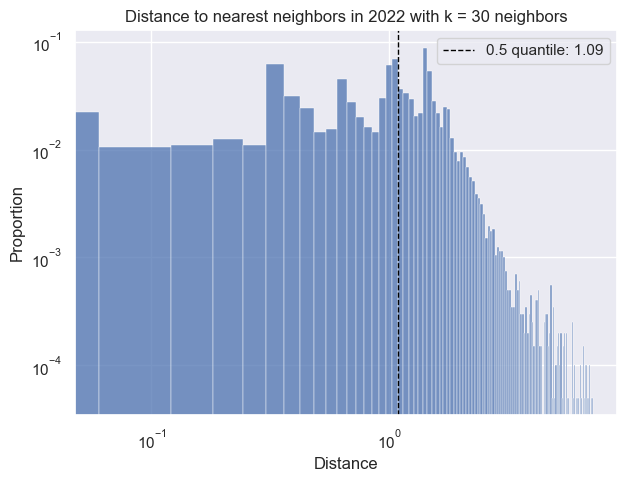

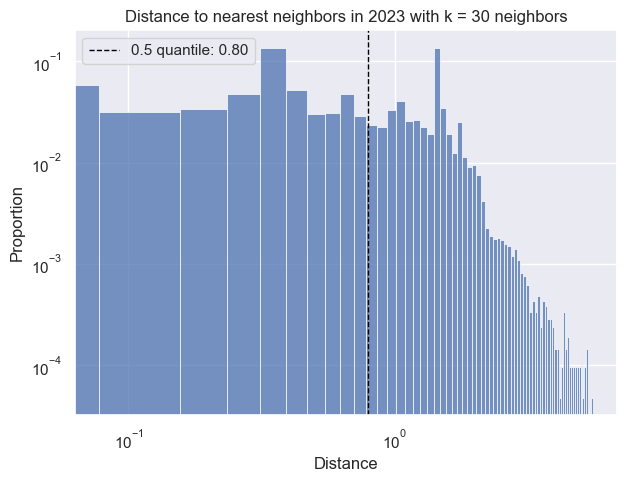

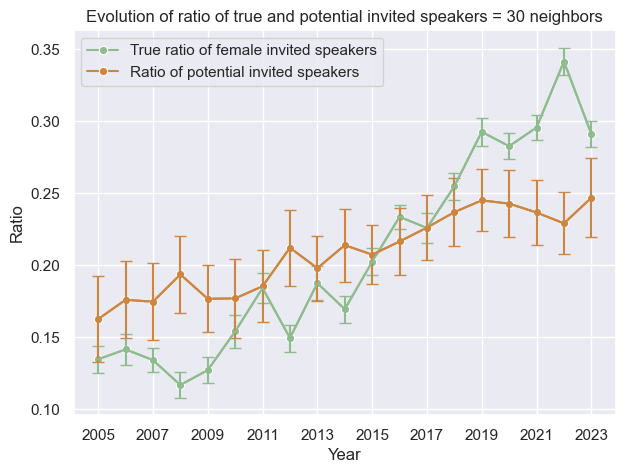

 67%|██████████████████████████████               | 4/6 [01:50<00:58, 29.43s/it]

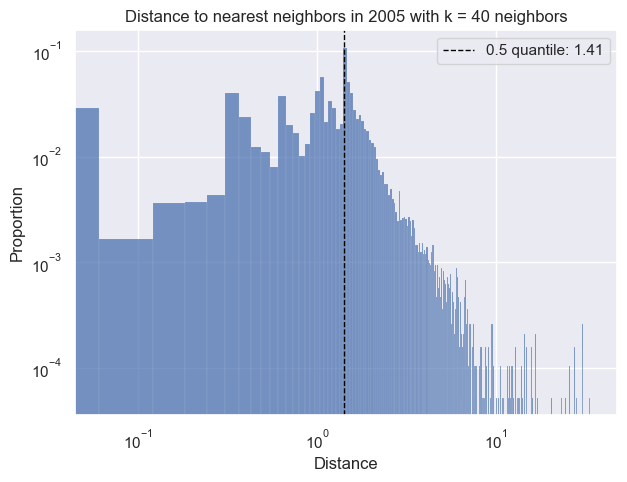

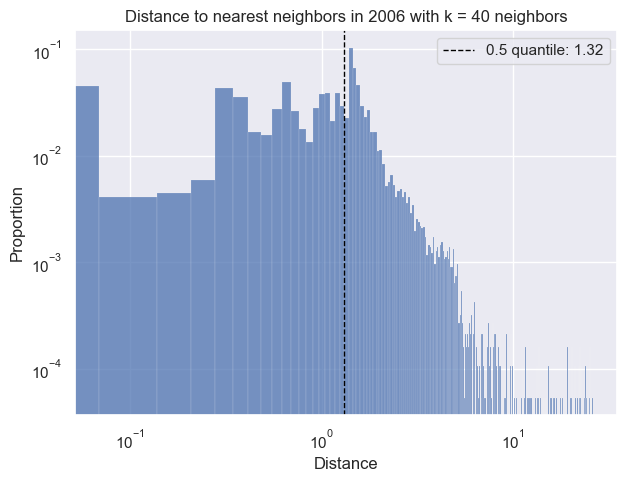

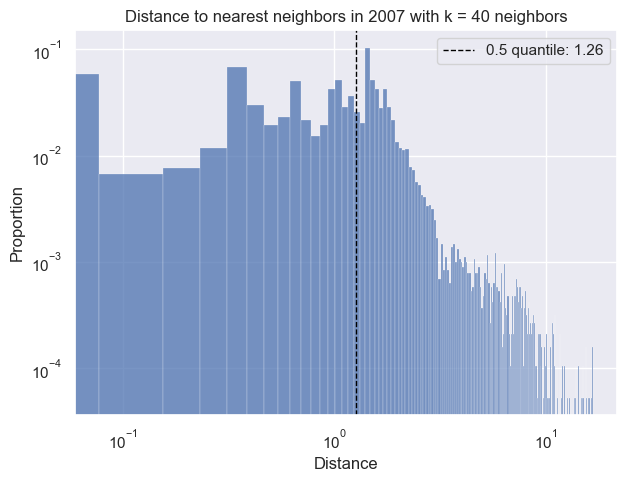

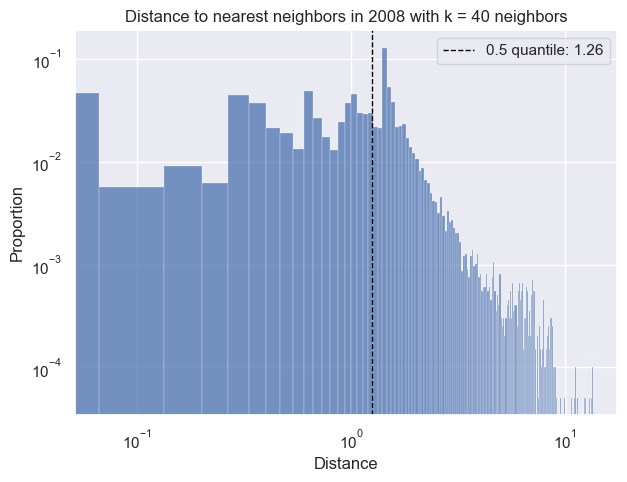

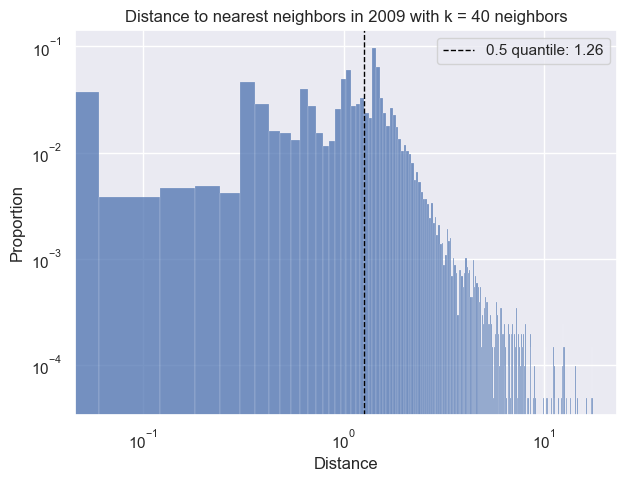

...

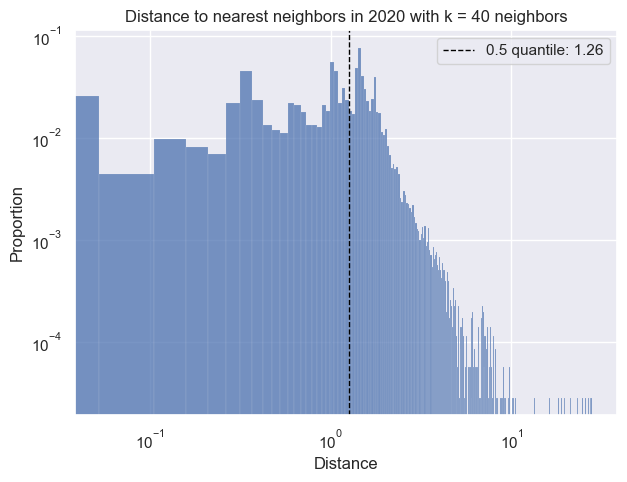

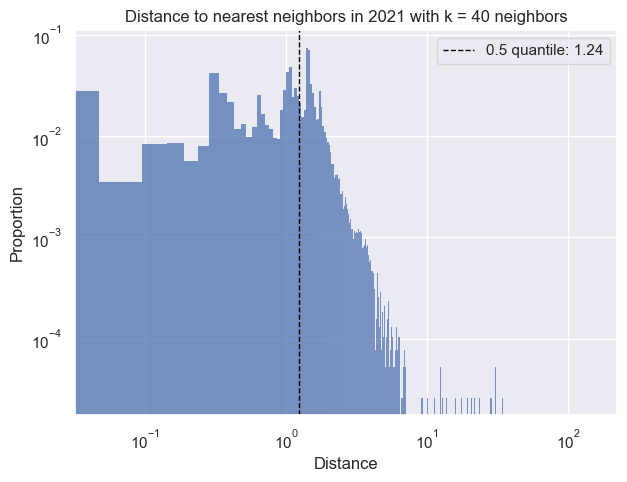

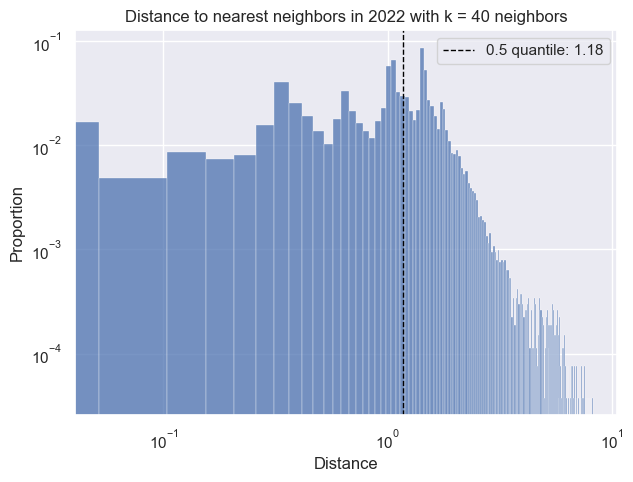

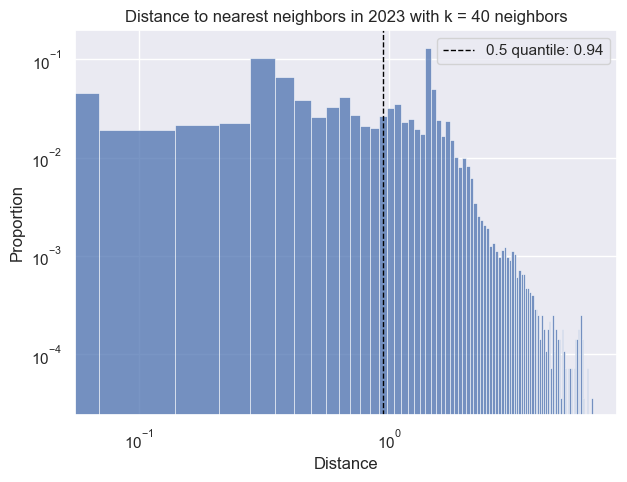

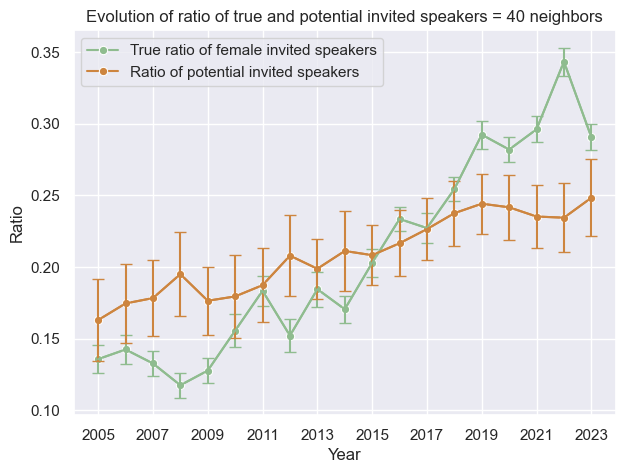

 83%|█████████████████████████████████████▌       | 5/6 [02:29<00:32, 32.87s/it]

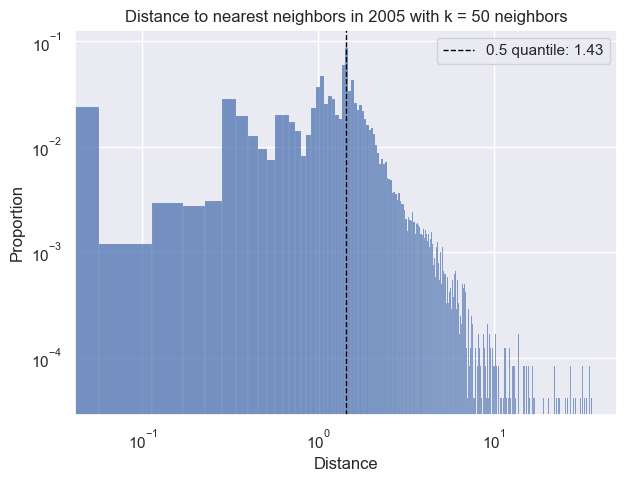

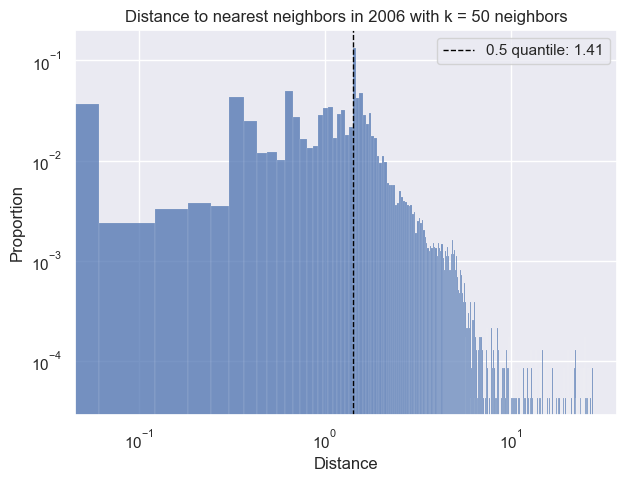

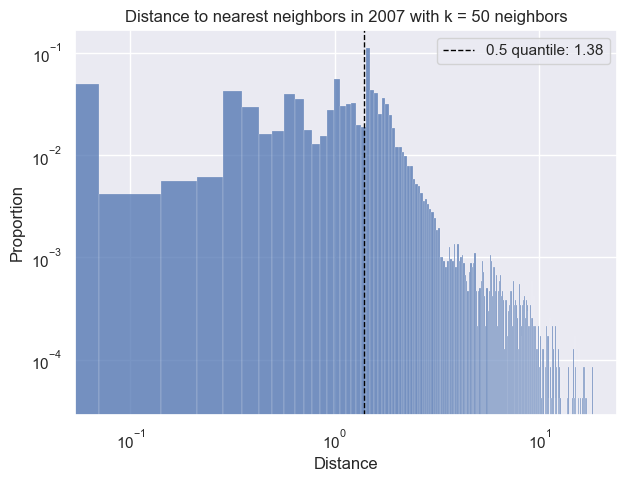

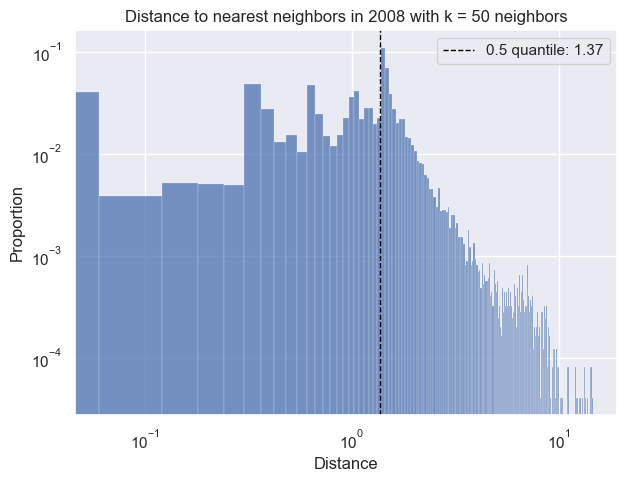

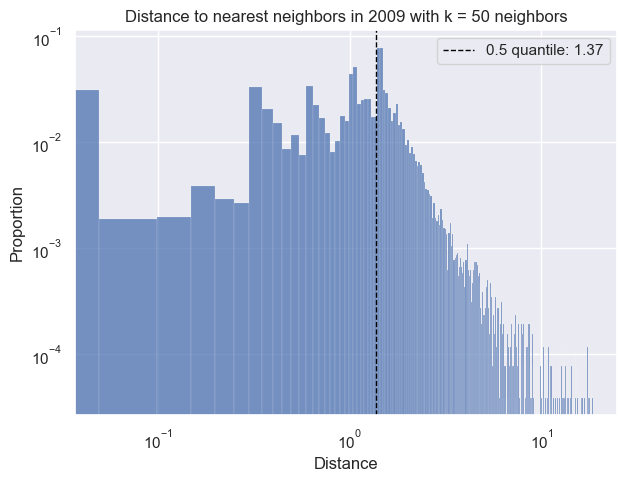

...

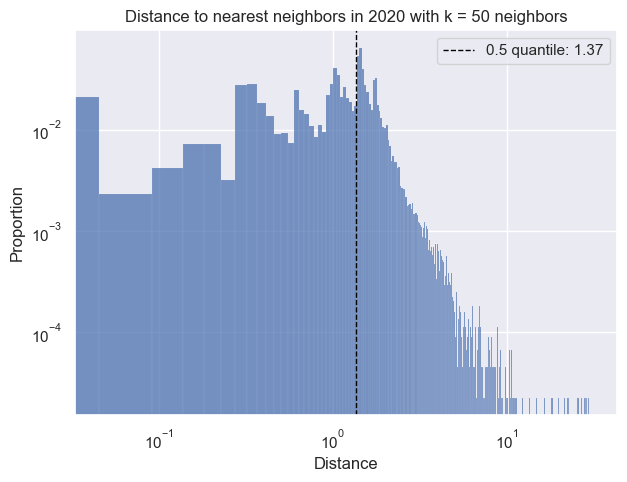

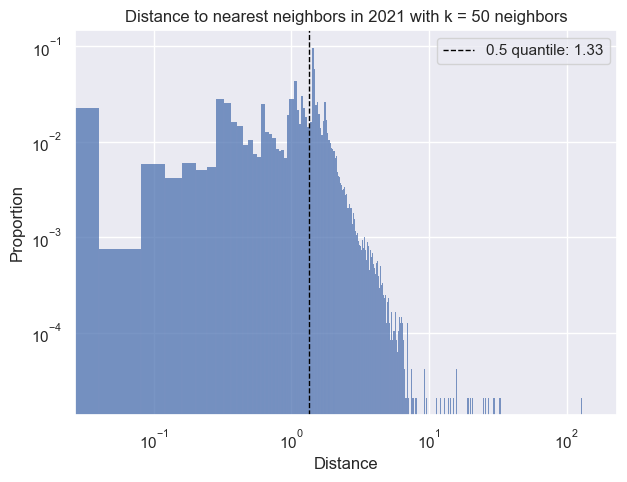

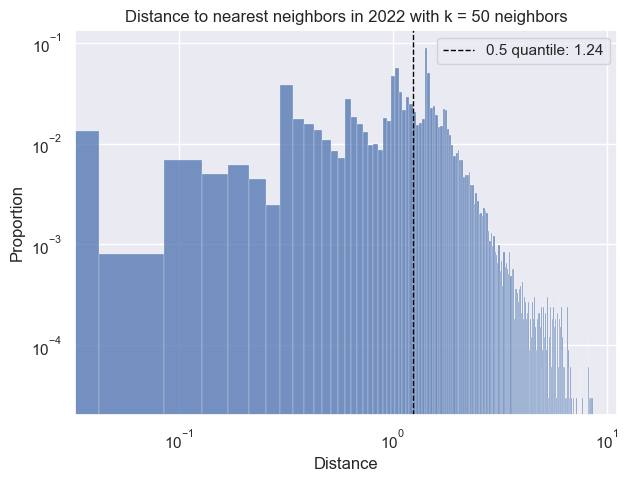

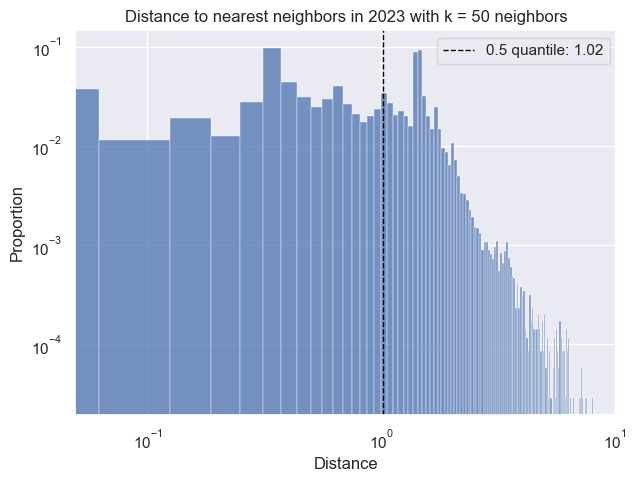

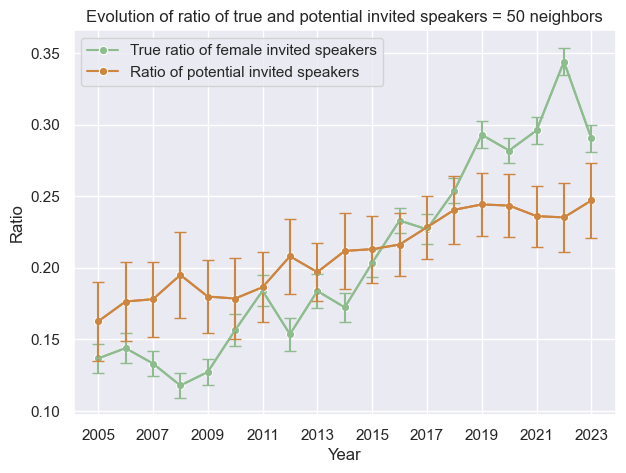

100%|█████████████████████████████████████████████| 6/6 [03:12<00:00, 32.06s/it]


In [253]:
#likelihoodEvolution(oneHot_researchers, ['Seniority', 'CumulativePaperCount', 'Productivity'], allCols, [5, 10, 20, 30, 40, 50], 0.5, 1000, 'Gender',  ['Female', 'Male'])
#likelihoodEvolution(oneHot_researchers, ['Seniority', 'CumulativePaperCount', 'Productivity'], allCols, [5], 0.5, 10, 'Gender',  ['Female', 'Male'], True)
ratio_df = likelihoodEvolutions(oneHot_researchers, allCols, [5, 10, 20, 30, 40, 50], 10, 'SessionType', False)

In [103]:
likelihoodEvolution(oneHot_researchers, ['Seniority', 'CumulativePaperCount', 'Productivity'], allCols, [5, 10, 20, 30, 40, 50], 0.5, 1000, 'SessionType',  ['attendee', 'invited'], False)

TypeError: likelihoodEvolution() missing 1 required positional argument: 'seniorityFilter'

### Filter on seniority

In [25]:
binStart = [-1]
bins = np.arange(5, 35, 5).tolist()
bins.append(float("inf"))
binStart += bins
labels = ['0-5', '6-10', '11-15', '16-20', '21-25', '26-30', '> 30']

seniorityCat_researchers = oneHot_researchers.copy()
seniorityCat_researchers['Seniority_cat'] = pd.cut(oneHot_researchers['Seniority'], bins = binStart, labels = labels)

  0%|                                                     | 0/4 [00:00<?, ?it/s]

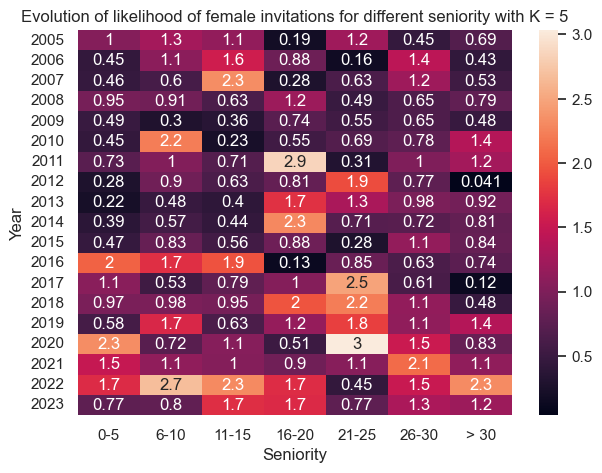

 25%|██████████▎                              | 1/4 [43:38<2:10:56, 2618.69s/it]

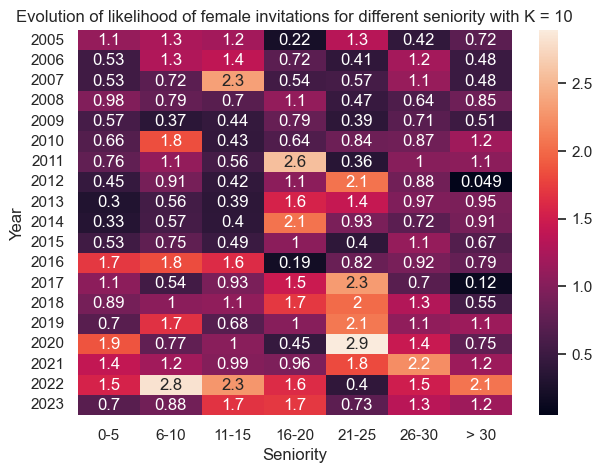

 50%|███████████████████▌                   | 2/4 [1:32:54<1:32:54, 2787.16s/it]

KeyboardInterrupt



In [46]:
#filter on seniority
likelihoodEvolution(seniorityCat_researchers, ['Seniority', 'CumulativePaperCount', 'Productivity'], allCols, [5, 10, 20, 30], 0.5, 1000, 'Gender', ['Female', 'Male'], True, ['_F', '_M'], 'invited')

In [ ]:
#only goes up to K = 30, since one group of seniority only have 36 females in 2005. 

#the reasont that the females with highest seniority is not most likely to be invited, could that be, 
#that it is because those females were invited for another reason?

In [9]:
def plotYearlyDistances(distance, threshold, year, K, feature):
    df = pd.DataFrame(distance.flatten(), columns = ['Distance'])
    
    fig, ax = plt.subplots(1,1)
    sns.histplot(df, x = 'Distance', stat = 'proportion')
    plt.axvline(x = threshold, color = 'black', linewidth = 1, label = '0.5 quantile: ' + str("{:.2f}".format(threshold))).set_linestyle("--")
    plt.legend()
    plt.xscale('log')
    plt.yscale('log')
    plt.title('Distance to five nearest neighbors in ' + str(year) + " with k = " + str(K) + " neighbors")
    plt.savefig('Figures/nearNeighborsDist' + feature + '_' + str(year) + '_' + str(K) + 'neighbors.png', bbox_inches='tight')
    plt.show()

In [10]:
def likelihood(indices, df1, df2, suffixes, sessionType): #df1 is females, df2 is males
    similarResearchers_df = pd.DataFrame(data = df2['SessionType'])
    index_rand = [np.random.choice(i, 1)[0] for i in indices] #randomly select index for each row
    similarResearchers_df['SimilarFemaleIndex'] = index_rand #create column with the random similar female indices
    similarResearchers_df = similarResearchers_df.dropna(subset = 'SimilarFemaleIndex') #drop rows where the researchers are not similar enough
    #similarIndex = similarResearchers.SimilarFemaleIndex
    similarFemales = df1.iloc[similarResearchers_df.SimilarFemaleIndex][['SessionType']] #the random selected similar females
    similarResearchers = pd.merge(similarResearchers_df, similarFemales, left_on = 'SimilarFemaleIndex', right_on = similarFemales.index, how = 'inner', suffixes=(suffixes[1], suffixes[0]))
    
    #calculate likelihood
    group2 = similarResearchers['SessionType' + suffixes[1]].value_counts(normalize = True).loc['invited']
    group1 = similarResearchers['SessionType' + suffixes[2]].value_counts(normalize = True).loc['invited']
    
    likelihood_n = group2/group1
    
    return likelihood_n

In [34]:
def RelativeLikelihood_stats(df): #calculate average relative likelihood per year
    likelihood_dict = {}
    yearList = np.sort(df.Year.unique())
    for y in yearList:
        avg_likelihood = df[df.Year == y].Likelihood.mean()
        std_likelihood = df[df.Year == y].Likelihood.std()
        likelihood_dict[y] = {'Avg_likelihood': avg_likelihood, 'Std_likelihood': std_likelihood}
    return likelihood_dict

In [35]:
def plotLikelihood(df, k, title):
    years = df.index.tolist()
    
    fix, ax = plt.subplots(1,1)
    sns.lineplot(data = df, x = df.index, y = 'Avg_likelihood', marker = 'o', color = 'red')
    plt.axhline(1, color = 'black', linewidth = 1, label = "Line indicating equality").set_linestyle("--")
    plt.errorbar(x = df.index, y = df.Avg_likelihood, yerr = df.Std_likelihood, color = 'red', capsize = 4)
    plt.legend()
    plt.xticks(np.arange(min(years), max(years)+1, 2.0))
    plt.xlabel('Year')
    plt.ylabel('Likelihood of female invitation')
    plt.title(title + str(k))
    plt.savefig("Figures/femaleLikelihood" + str(k) + "Neighbors.png", bbox_inches='tight')
    plt.show()

In [36]:
KNN(df, groupFeature, groups, year, allFeatures, oneHotFeatures_n, standardizeFeatures_n, K, q)
groupFeature = 'Gender'
groups = ['Female', 'Male']

likelihood(indices, df1, df2, ['_F', '_M'])

plotLikelihood(df, k, 'Evolution of average likelihood of female invited speakers with K = ')

NameError: name 'df' is not defined

In [37]:
def likelihoodEvolution(df, standardizeFeatures, allFeatures, K, q, N, groupFeature, groups): #calculate likelihood of females being invited as speakers over the years
    likelihood_dict = {}
    index = 0
    researchers = df.copy()
    n_oneHotFeatures = len(allFeatures) - len(standardizeFeatures) #number of features from one-hot encoding
    standardizeFeatures_n = len(standardizeFeatures)
    
    for c in standardizeFeatures:
        researchers[c] = standardizeColumn(researchers, c) #standardize data
    
    for k in tqdm(K):
        yearList = np.sort(researchers.Year.unique())
        #for y in tqdm(yearList):
        for y in yearList:
            year_df = researchers[researchers.Year == y] #get all data from year y
            #indices, females, males = KNN(year_df, y, allFeatures, n_oneHotFeatures, standardizeFeatures_n, k, q)
            indices, group1, group2 = KNN(df, groupFeature, groups, y, allFeatures, n_oneHotFeatures, standardizeFeatures_n, K, q)
            
            #calculate likelihood
            for n in range(0,N):
                lh = likelihood(indices, females, males)
                likelihood_dict[index] = {'Year': y, 'Iteration': n, 'Likelihood': lh}
                index += 1
    
#    likelihood = KNN(df, standardizeFeatures, groupFeature, groups, allFeatures, K, q)
            
        likelihood_df = pd.DataFrame.from_dict(likelihood_dict, orient='index') #create df with likelihood
        likelihood_stats = RelativeLikelihood_stats(likelihood_df) #calculate average and standard deviation
        likelihood_stats_df = pd.DataFrame.from_dict(likelihood_stats, orient = 'index') #create df with stats on likelihood
    
        plotLikelihood(likelihood_stats_df, k) #plot likelihood


In [38]:
likelihoodEvolution(oneHot_researchers, ['Seniority', 'CumulativePaperCount', 'Productivity'], allCols, [5, 10, 20, 30, 40, 50], 0.5, 1000, 'Gender',  ['Female', 'Male'])

  0%|                                                     | 0/6 [00:00<?, ?it/s]


TypeError: '<=' not supported between instances of 'list' and 'int'

In [15]:
allCols = known/Units
allCols += ['Seniority', 'CumulativePaperCount', 'Productivity']

  0%|                                                     | 0/6 [00:00<?, ?it/s]

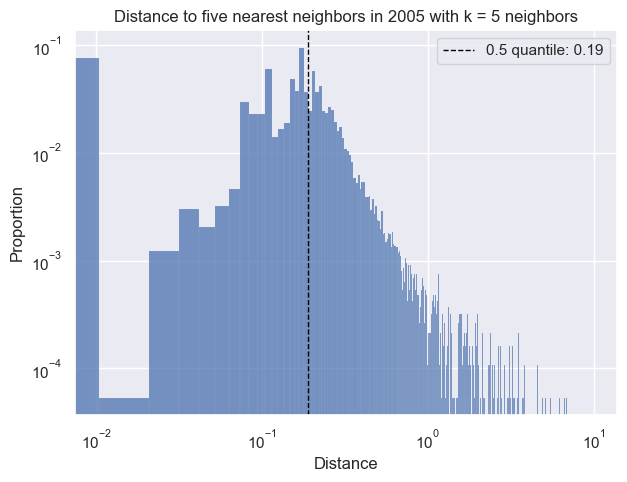

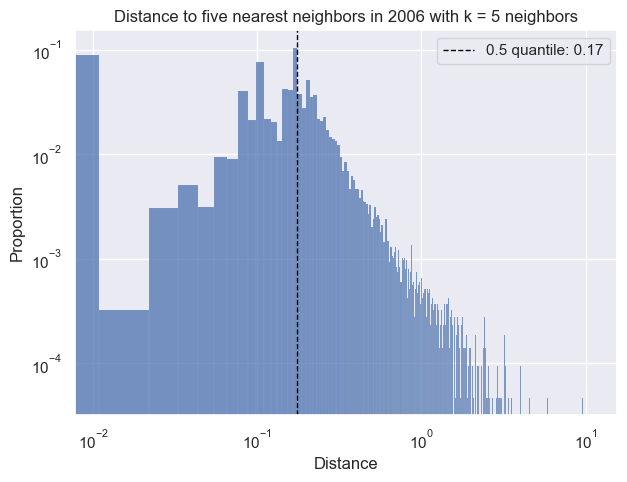

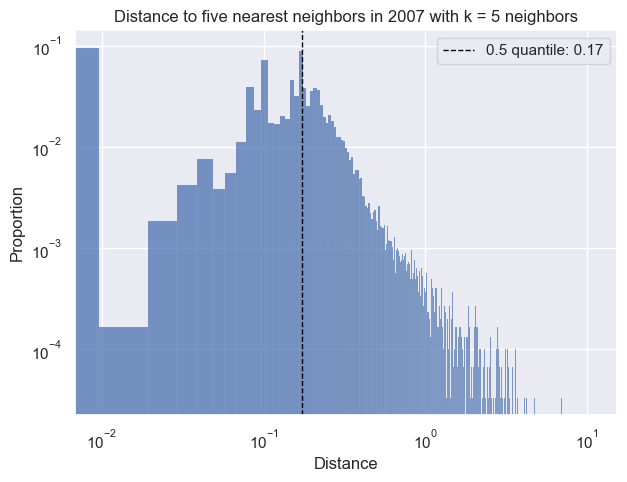

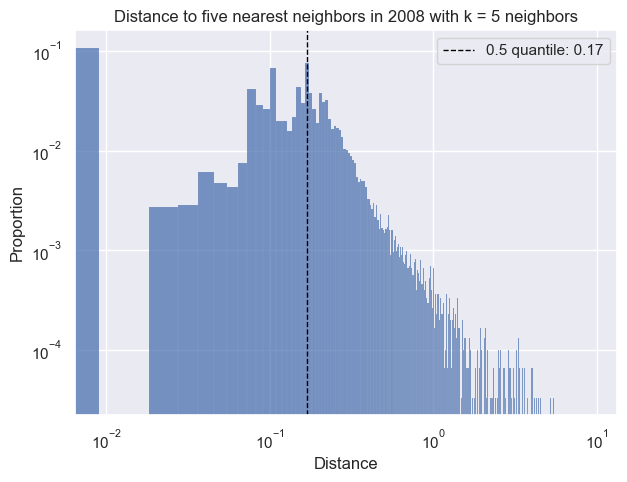

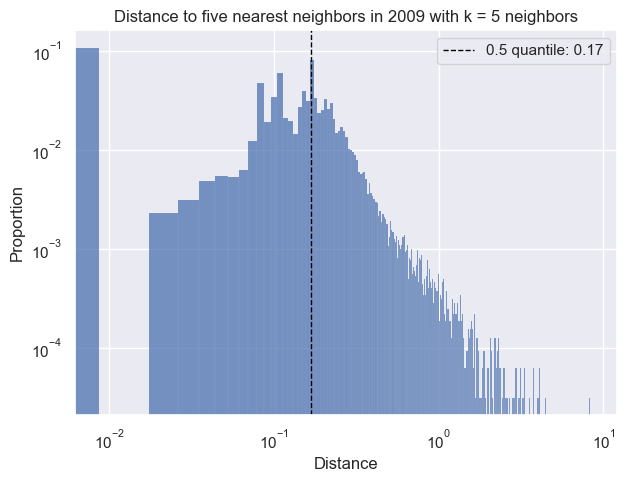

...

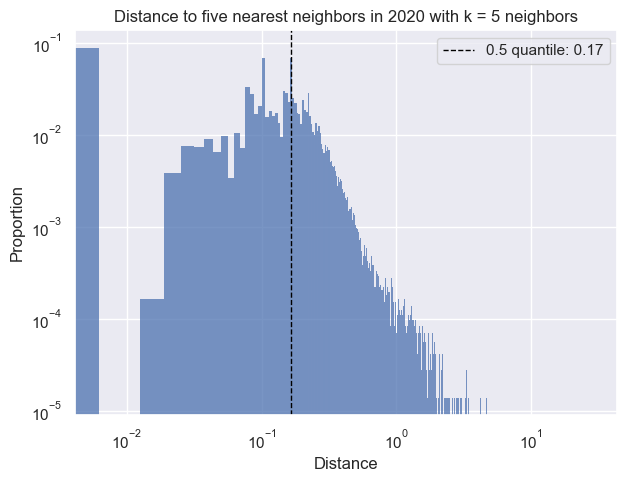

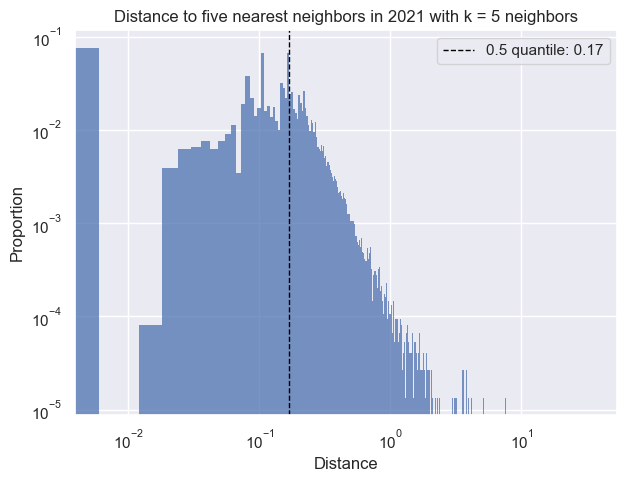

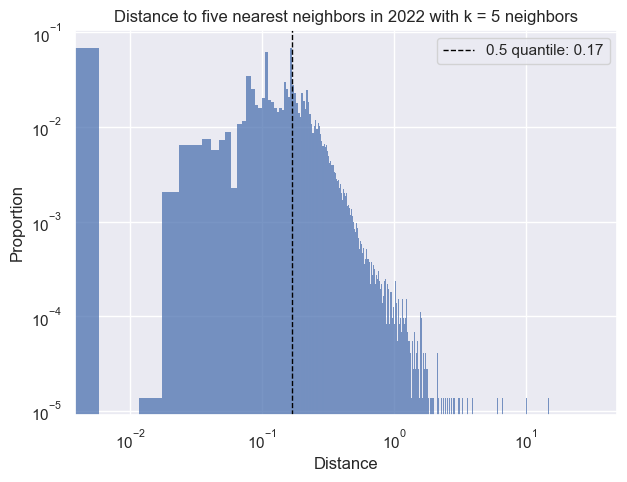

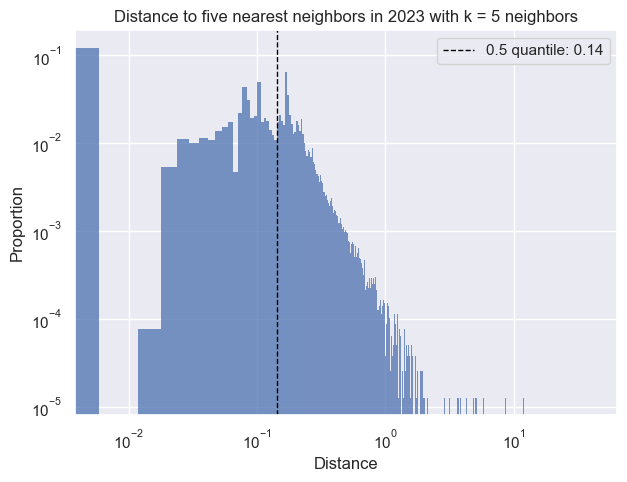

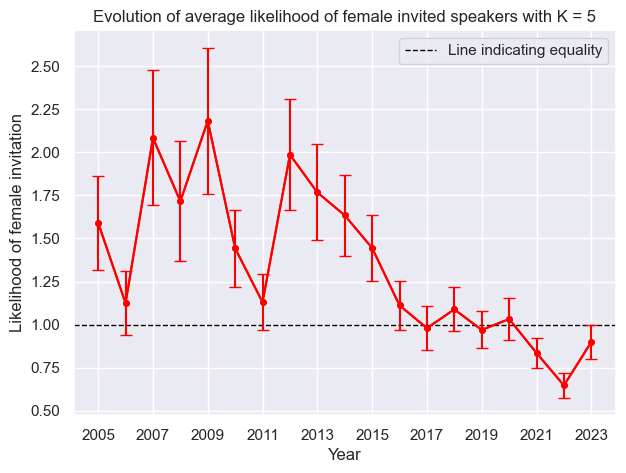

 17%|██████▊                                  | 1/6 [33:26<2:47:10, 2006.04s/it]

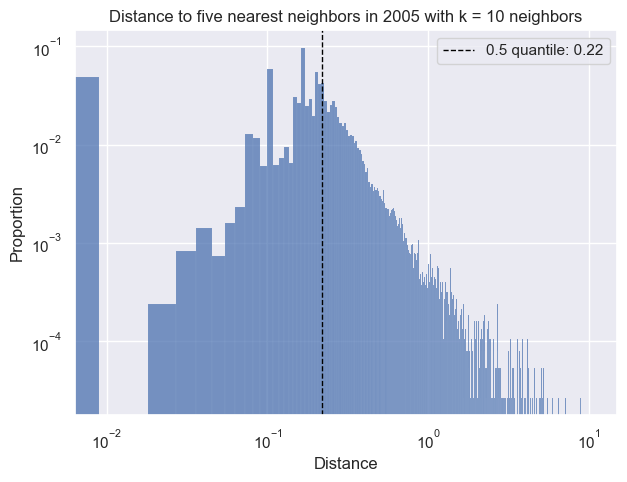

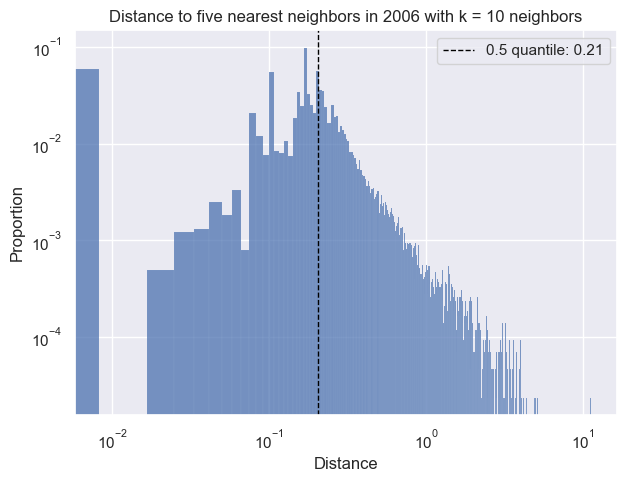

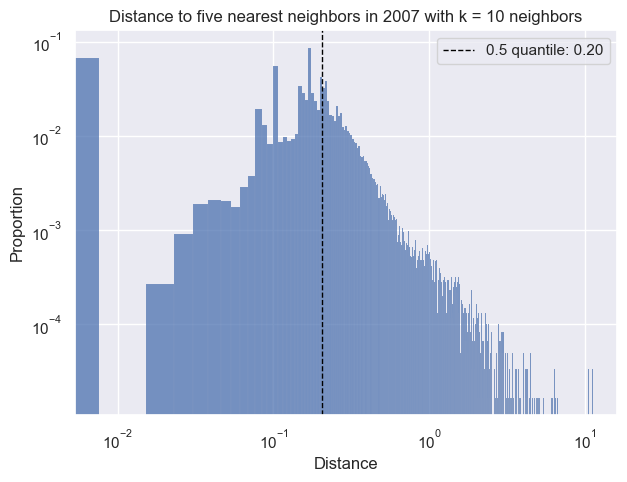

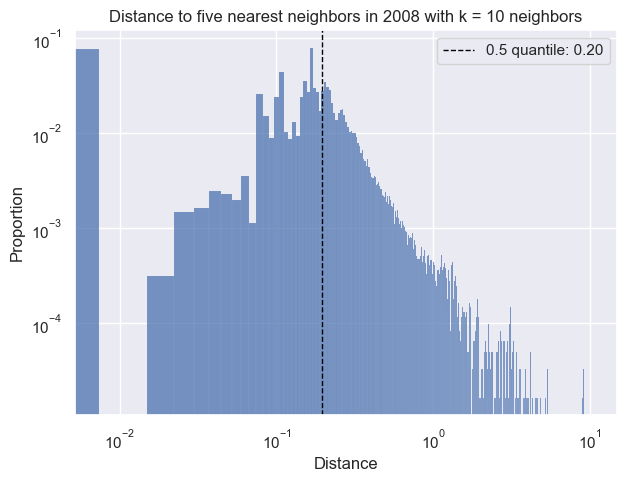

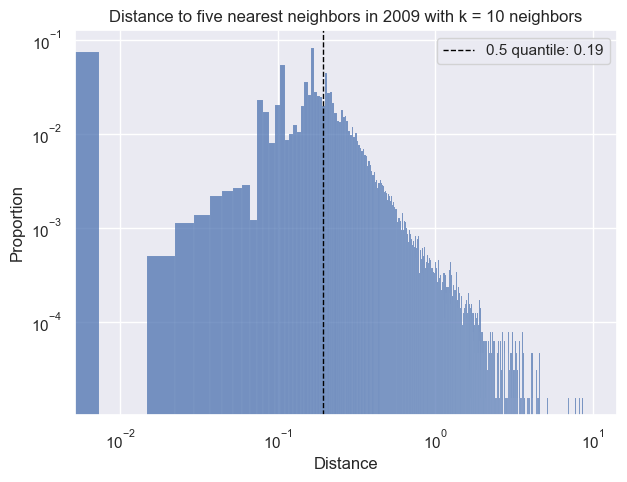

...

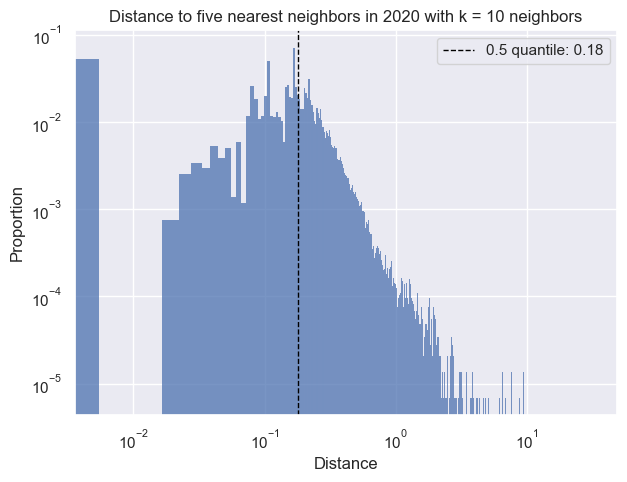

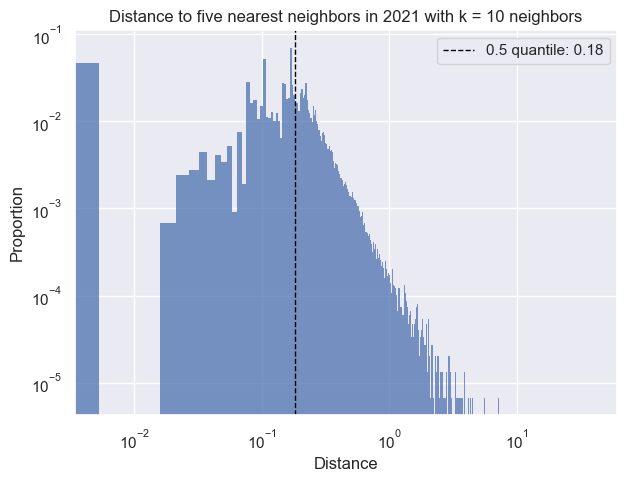

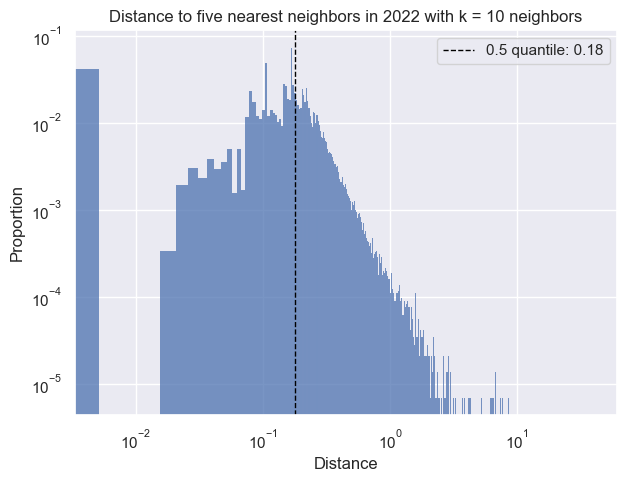

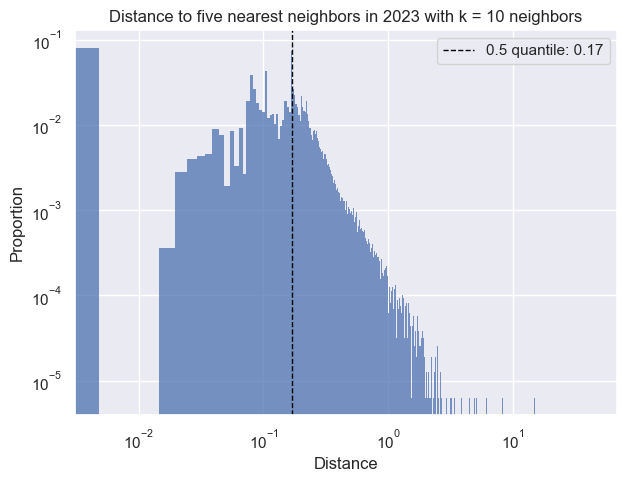

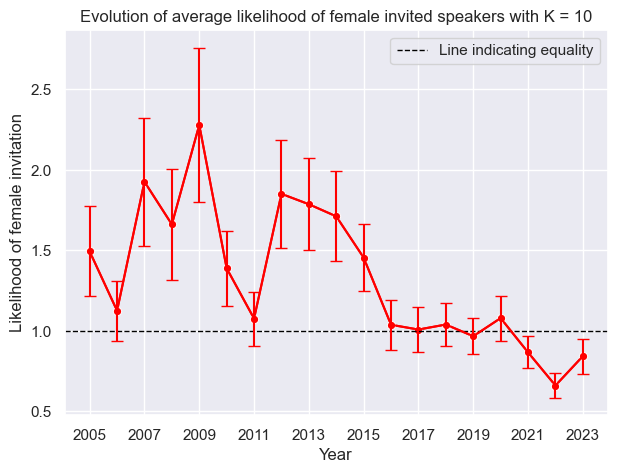

 33%|█████████████                          | 2/6 [1:37:22<3:25:30, 3082.52s/it]

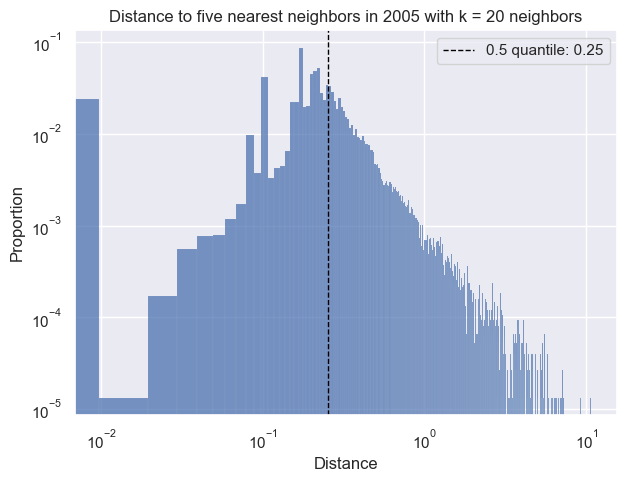

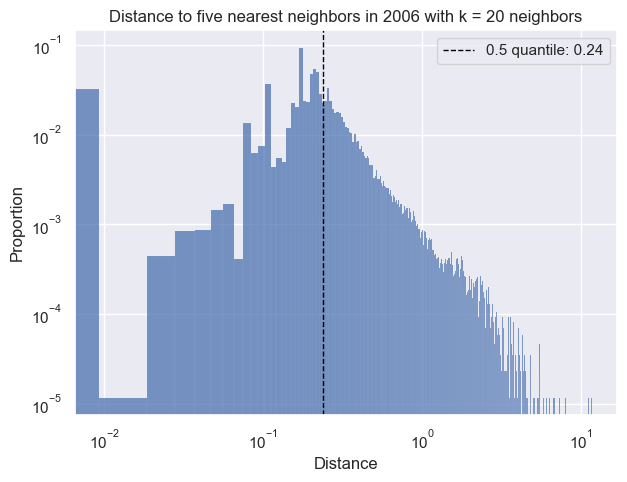

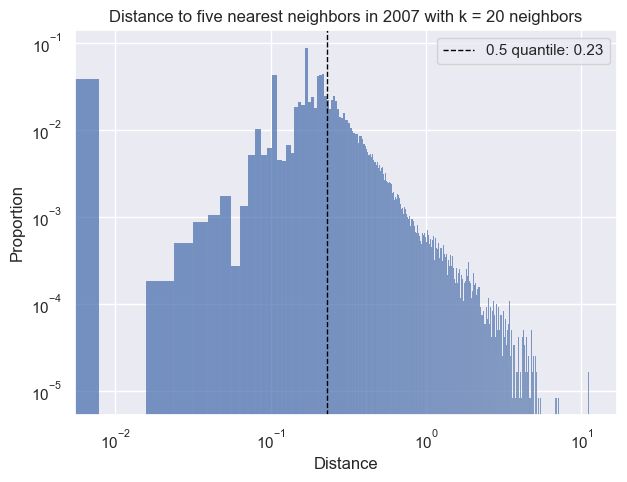

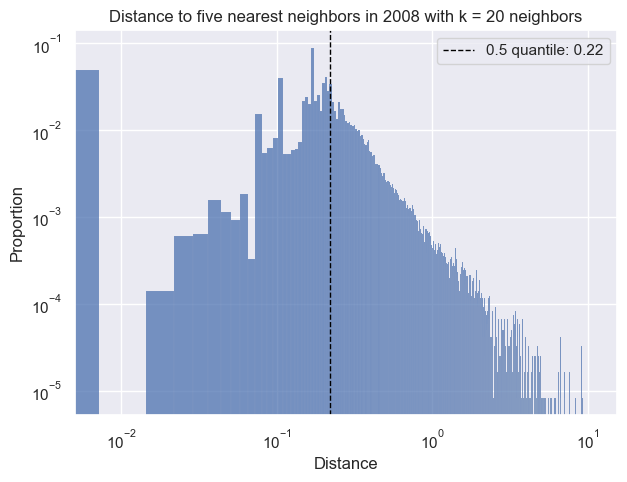

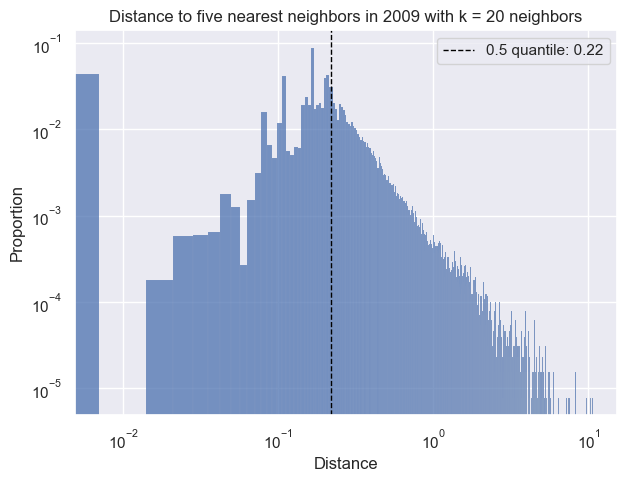

...

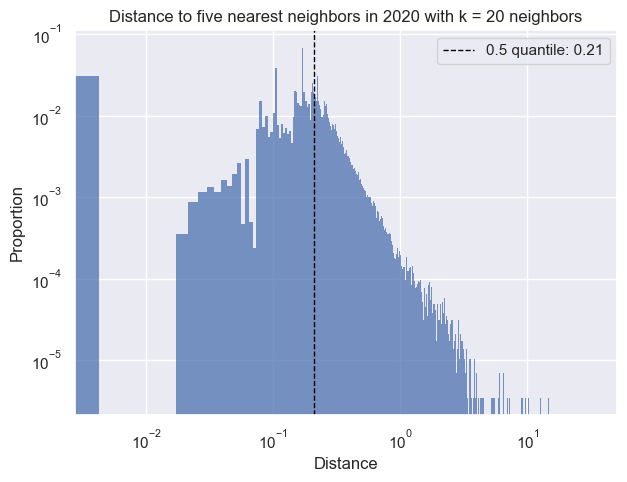

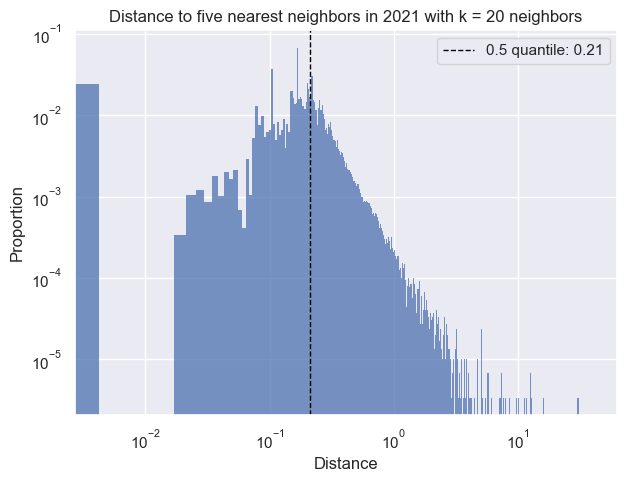

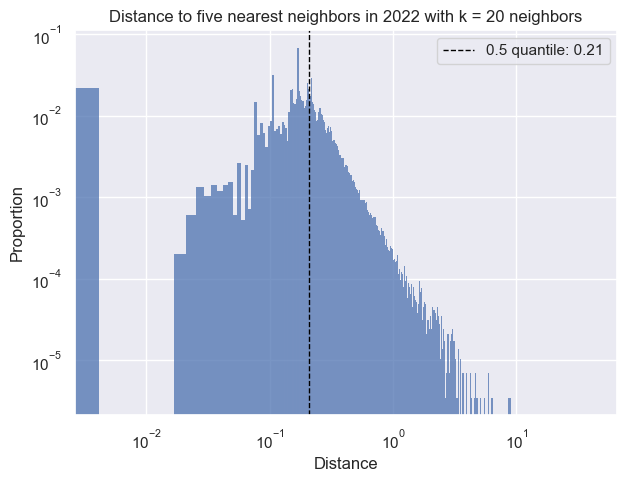

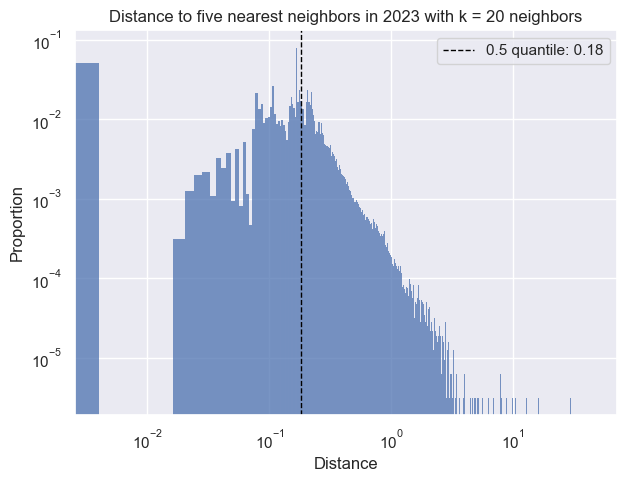

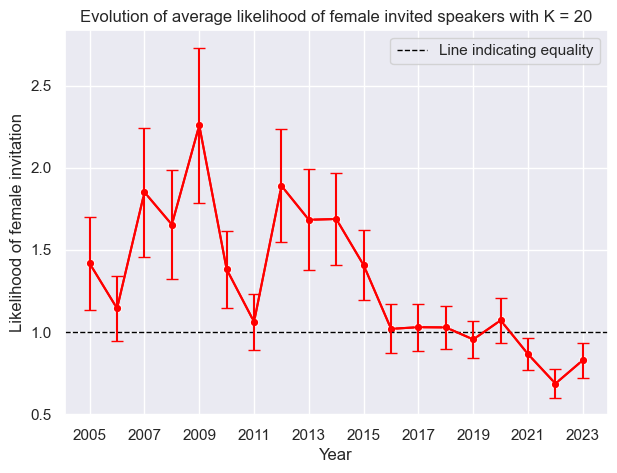

 50%|███████████████████▌                   | 3/6 [2:11:51<2:10:59, 2619.93s/it]

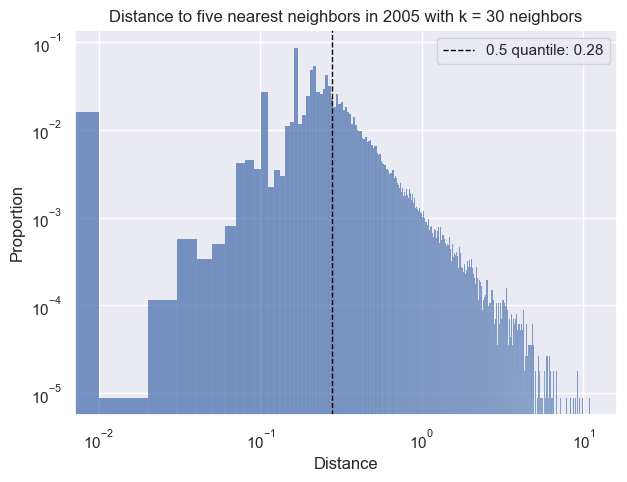

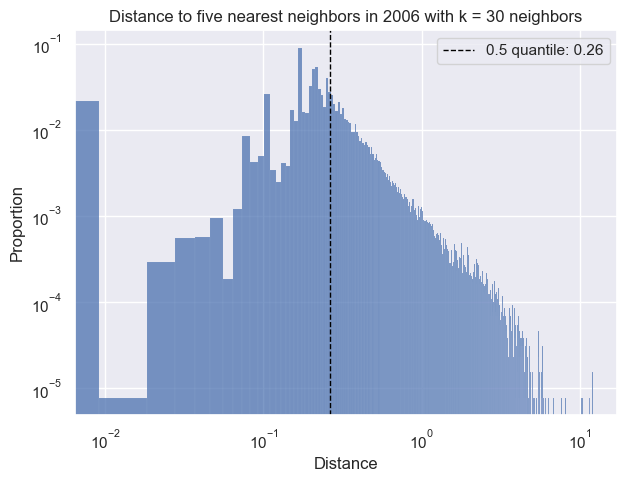

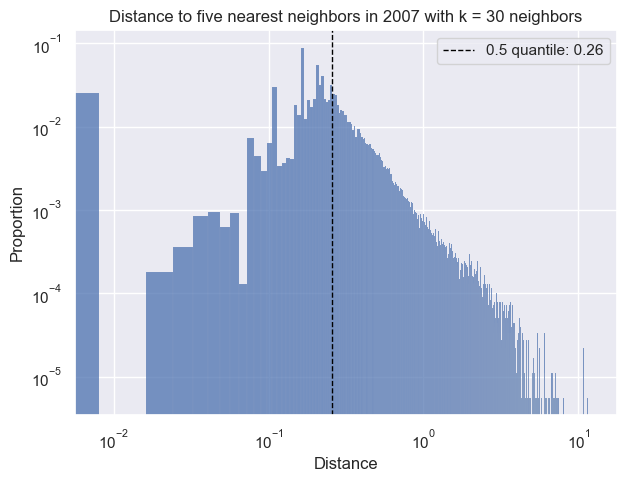

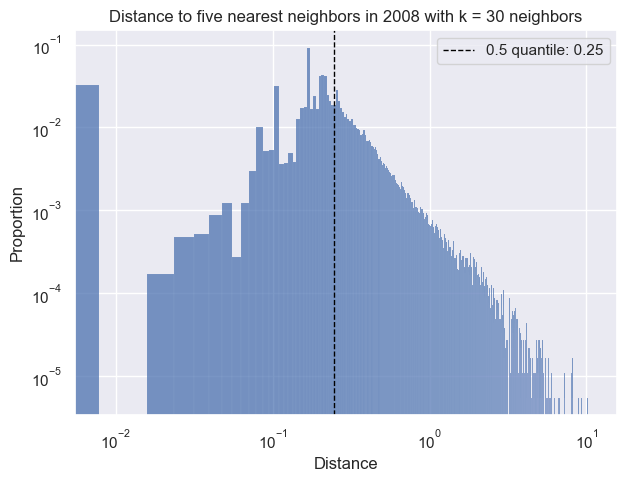

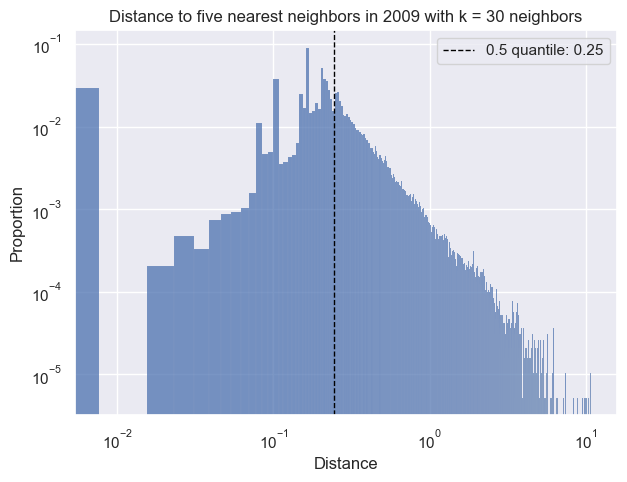

...

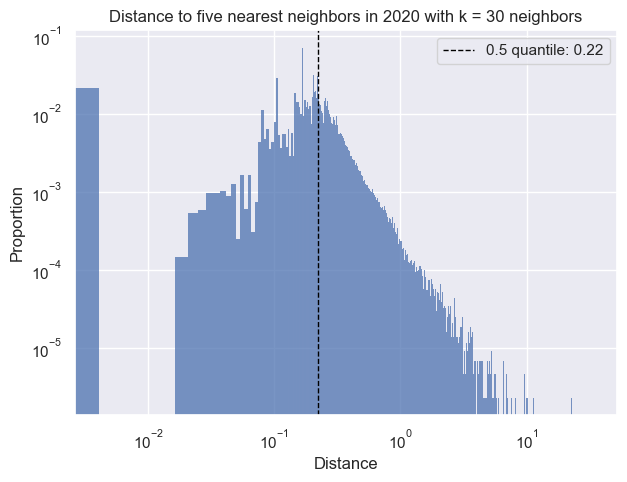

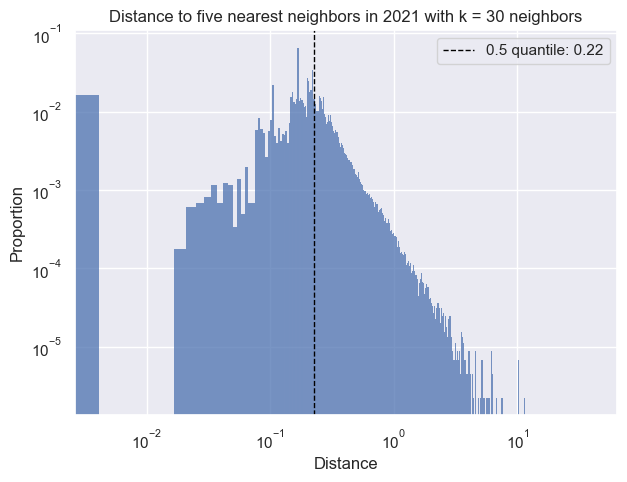

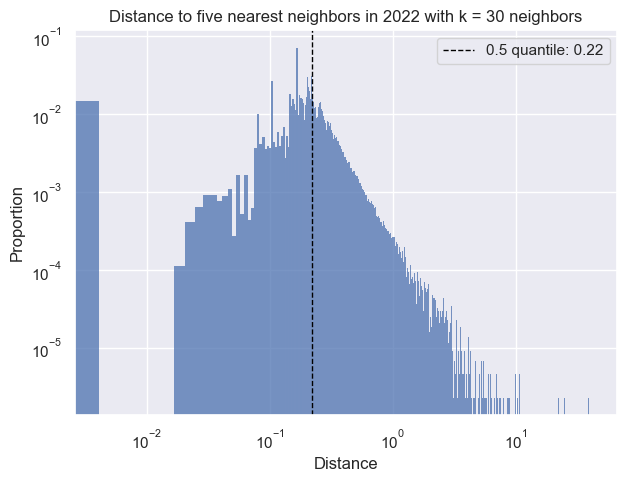

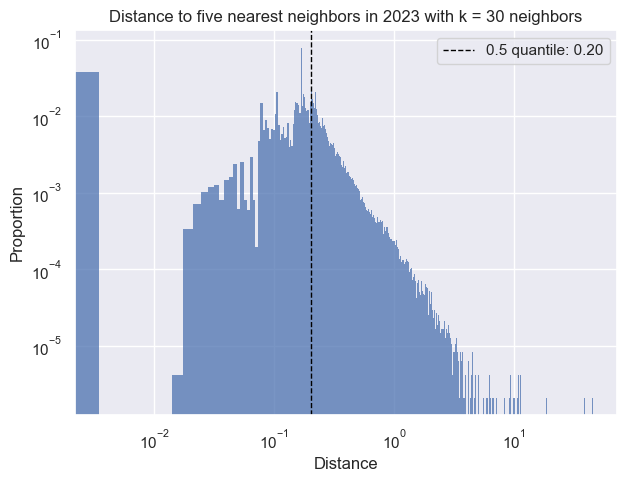

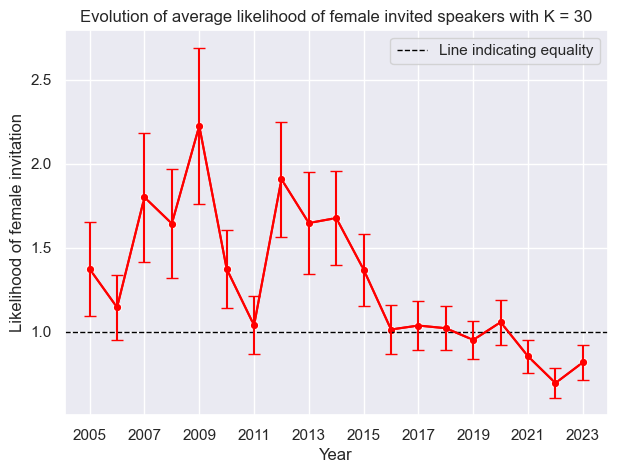

 67%|██████████████████████████             | 4/6 [2:46:42<1:20:22, 2411.20s/it]

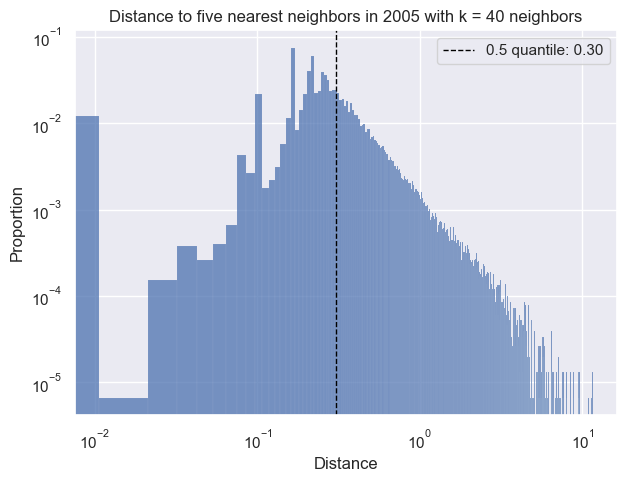

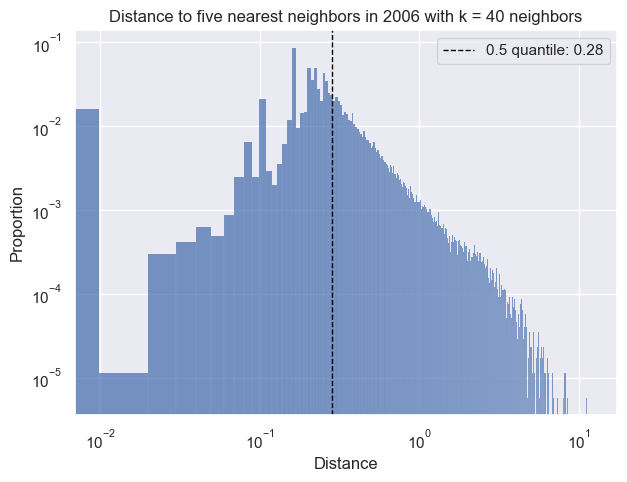

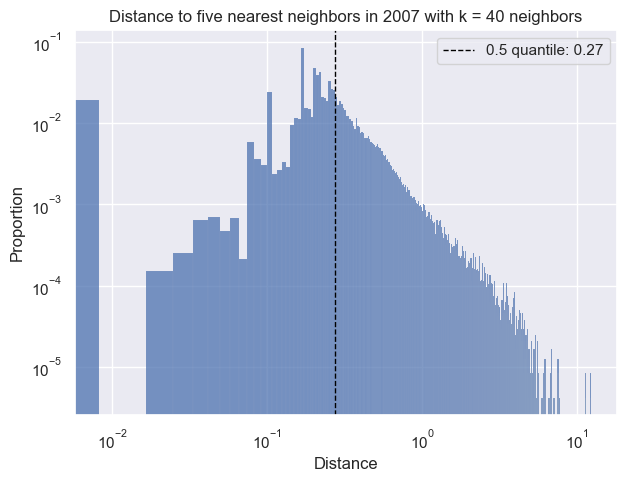

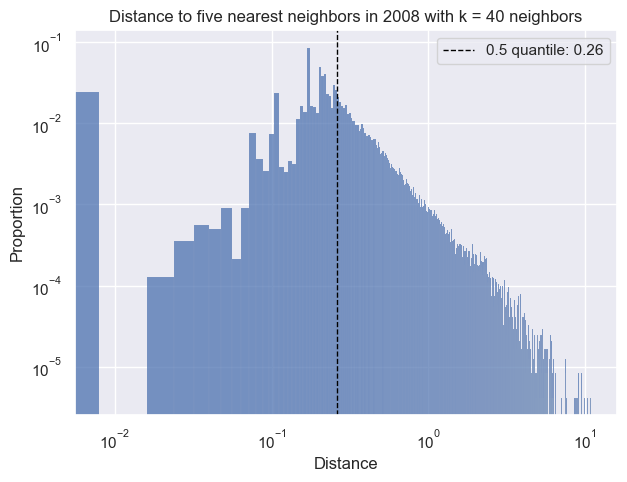

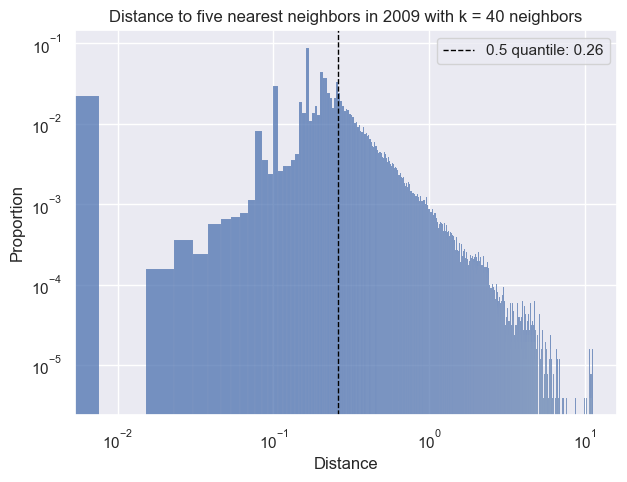

...

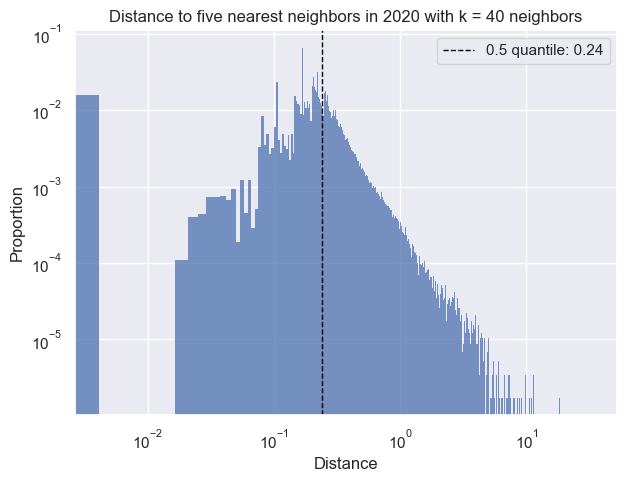

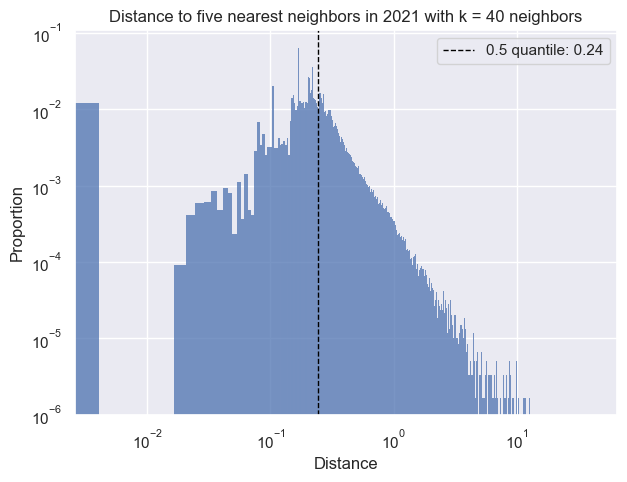

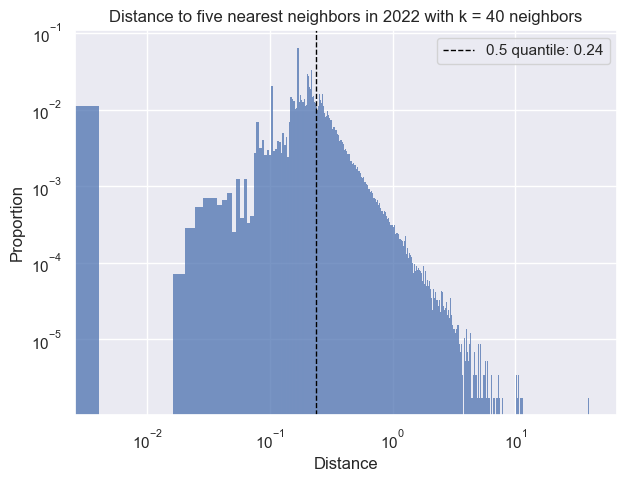

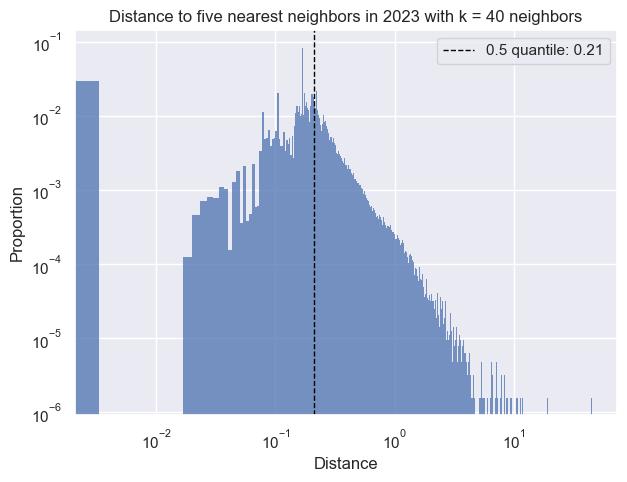

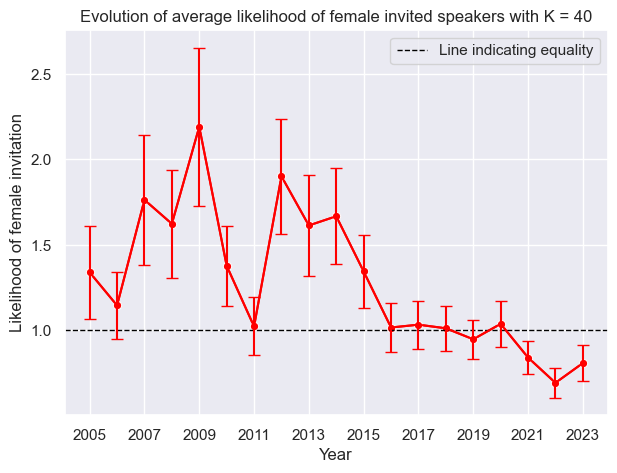

 83%|██████████████████████████████████▏      | 5/6 [3:21:51<38:22, 2302.24s/it]

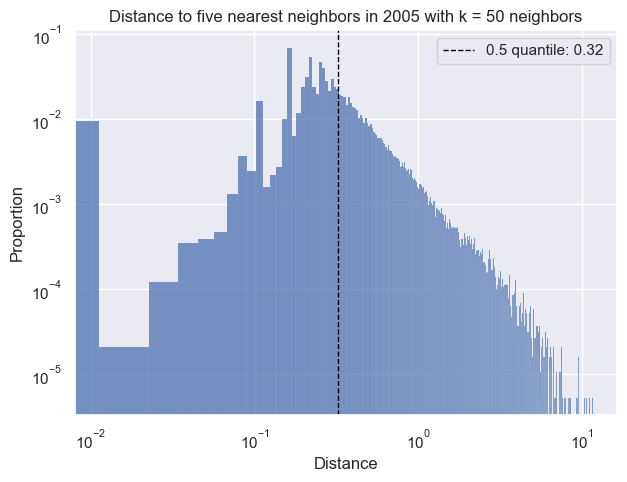

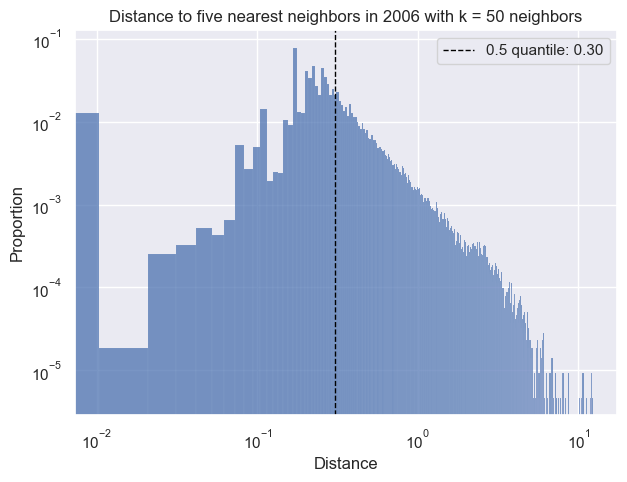

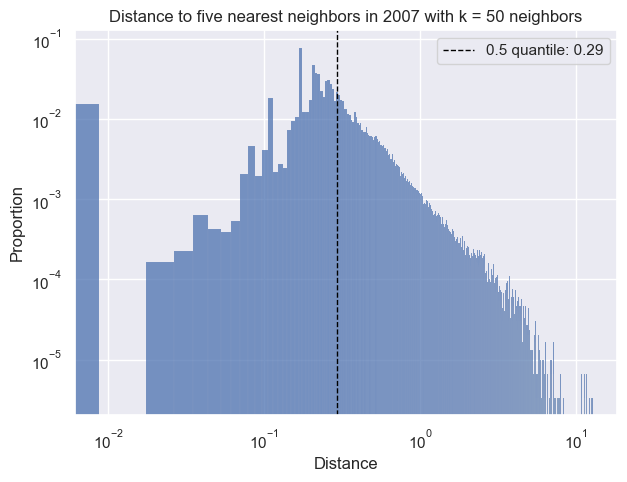

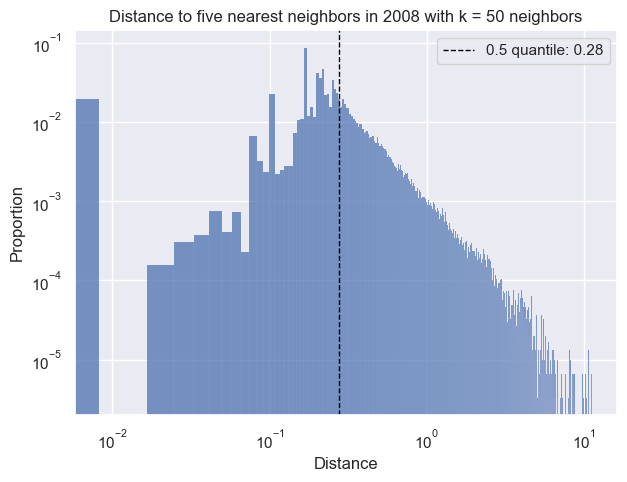

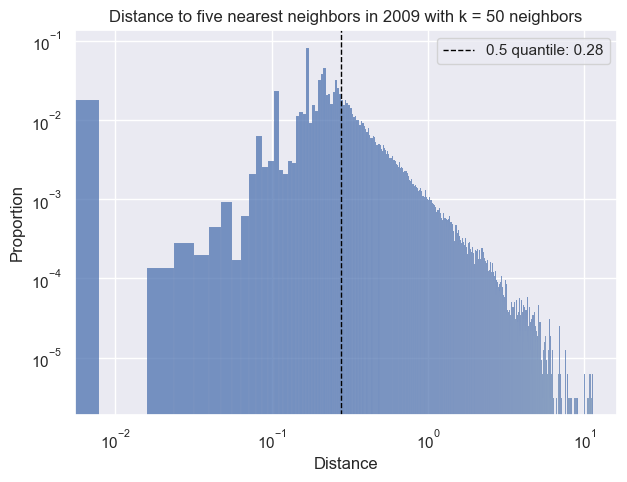

...

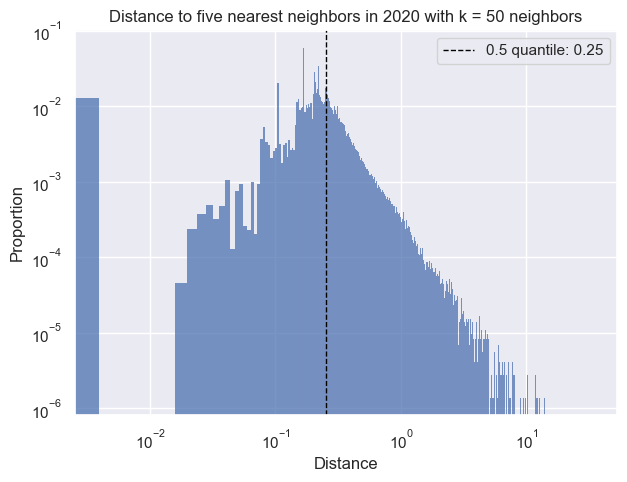

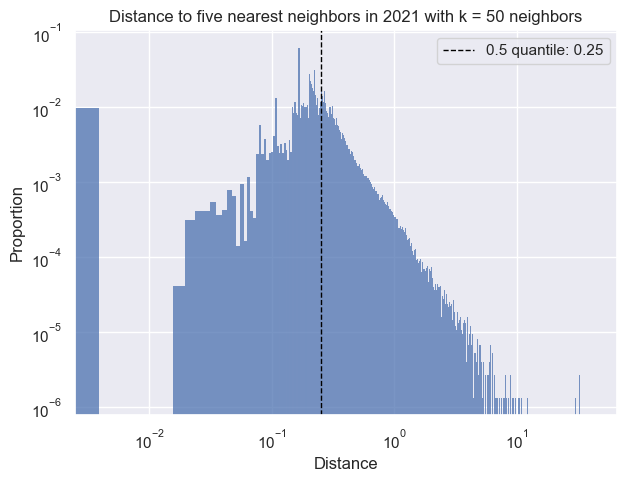

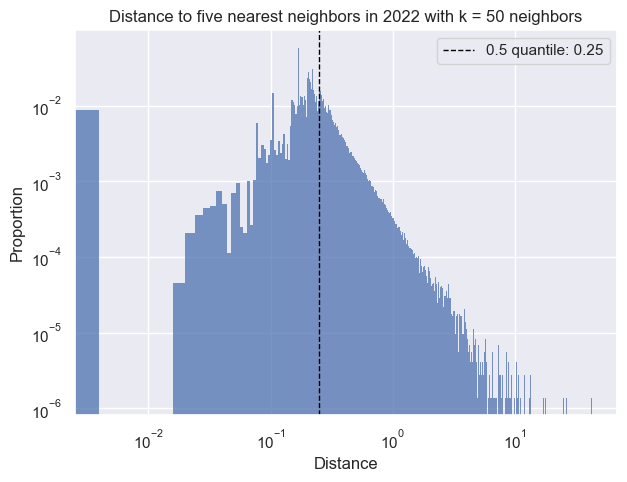

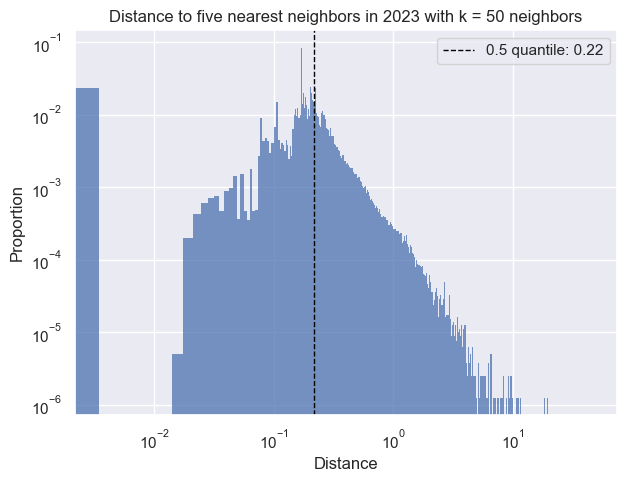

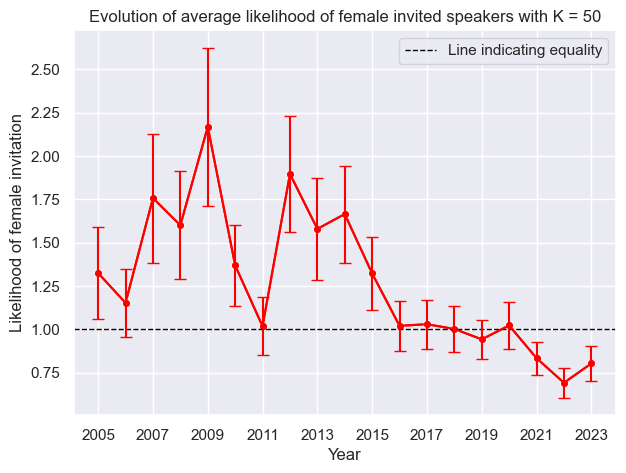

100%|█████████████████████████████████████████| 6/6 [3:57:21<00:00, 2373.58s/it]


In [16]:
likelihoodEvolution(oneHot_researchers, ['Seniority', 'CumulativePaperCount', 'Productivity'], allCols, [5, 10, 20, 30, 40, 50], 0.5, 1000)

#### Algorithm for calcualting likelihoods of females being invited
1. For each male, random select a female of the k similar females
2. Check session type of male and random female
3. Calculate ratio of invited females and ratio of invited males
4. Divide these 2 numbers, which give the relative likelihood of females being invited
5. Repeat step 1-4 *n* times
6. Calculate average and standard deviation of the *n* relative likelihoods (for later plots)
7. Repeat step 1-6 for each year
8. Females are more likely than males to be invited if the results are above 1, and males are more likely than females to be invited if the results are lower than 1. 

In [17]:
#try do do functions such that they work with male/female and invited/attendees
#one function at a time(and restart constantly)

  0%|                                                    | 0/19 [00:00<?, ?it/s]

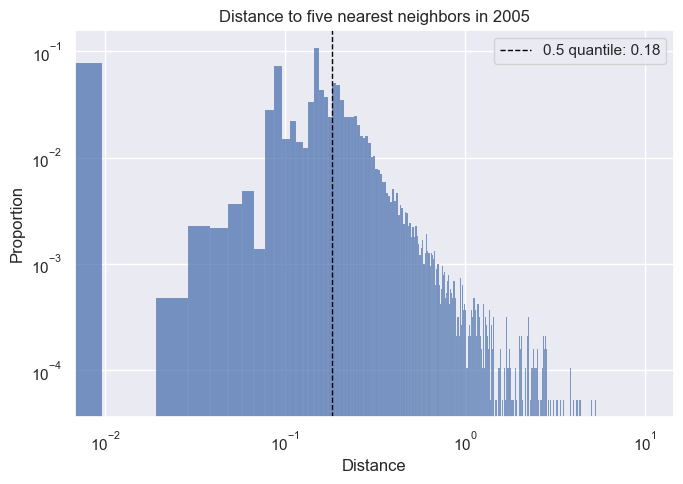

  5%|██▎                                         | 1/19 [00:40<12:14, 40.79s/it]

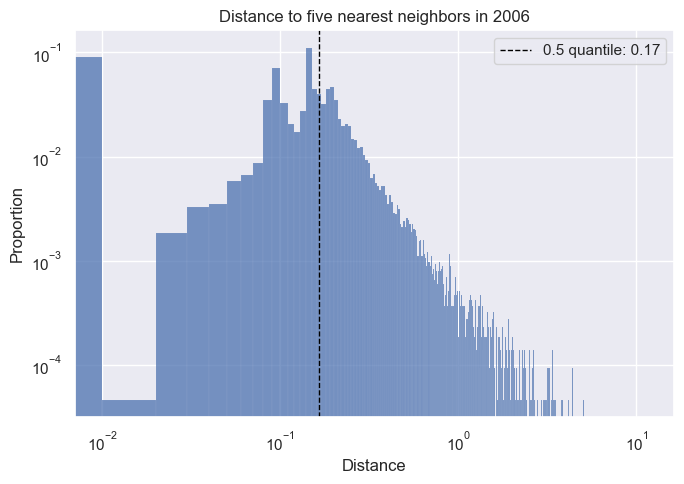

 11%|████▋                                       | 2/19 [01:25<12:16, 43.31s/it]

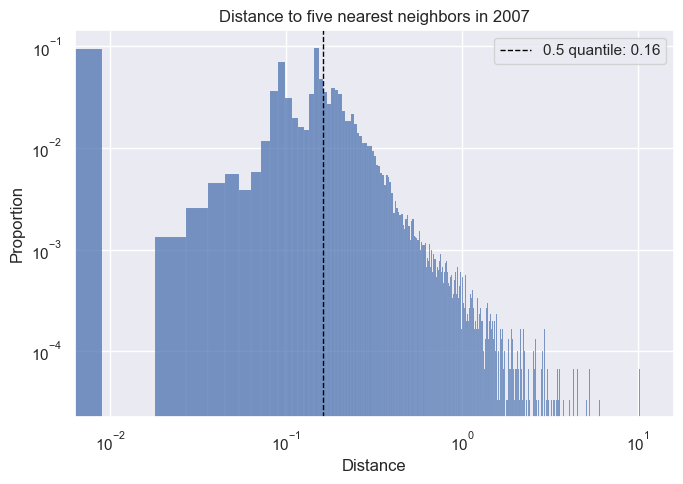

 16%|██████▉                                     | 3/19 [02:26<13:36, 51.03s/it]

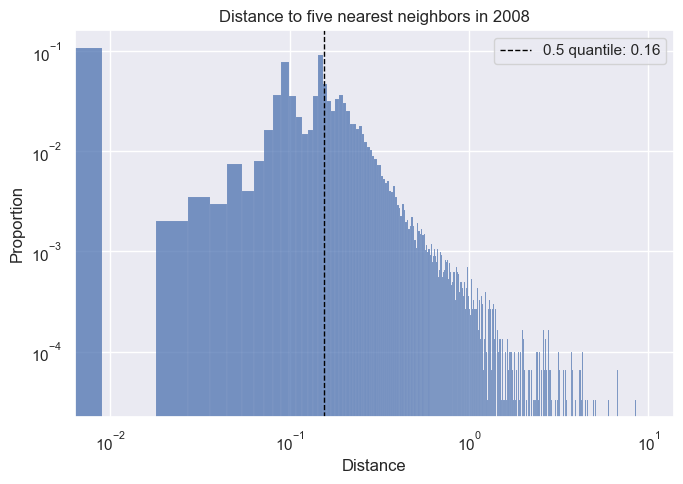

 21%|█████████▎                                  | 4/19 [03:26<13:42, 54.83s/it]

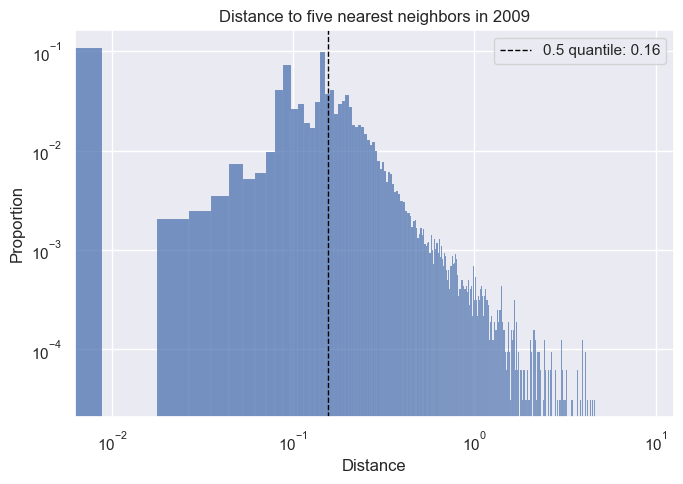

 26%|███████████▌                                | 5/19 [04:30<13:32, 58.01s/it]

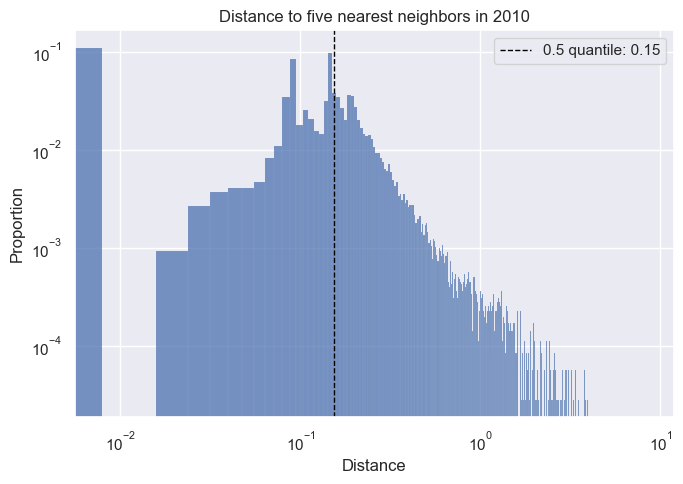

 32%|█████████████▉                              | 6/19 [05:40<13:27, 62.14s/it]

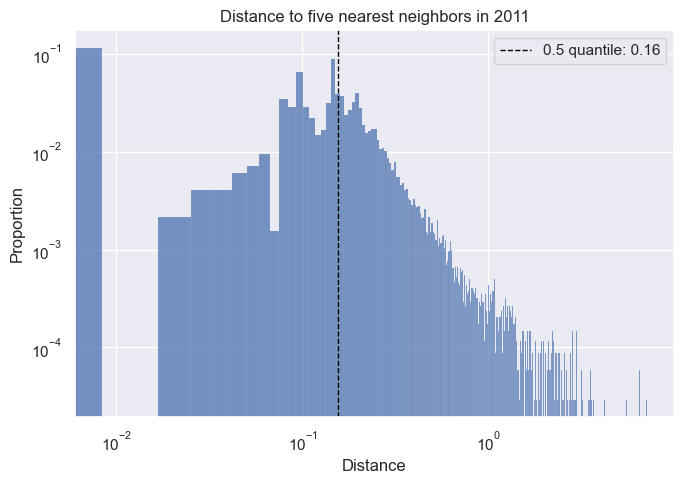

 37%|████████████████▏                           | 7/19 [06:48<12:49, 64.14s/it]

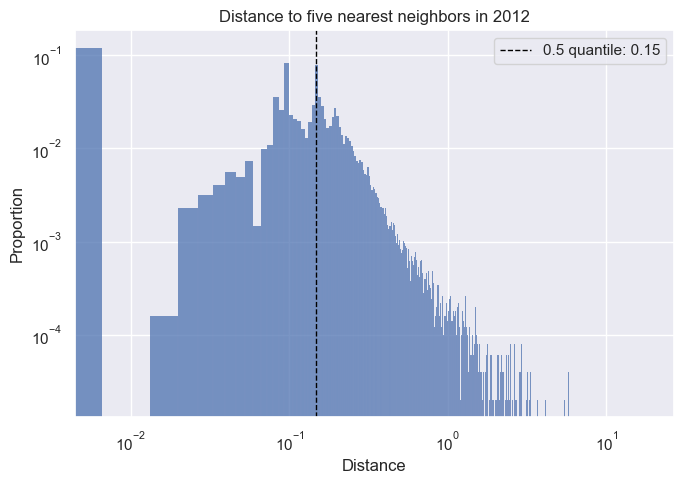

 42%|██████████████████▌                         | 8/19 [08:31<13:59, 76.36s/it]

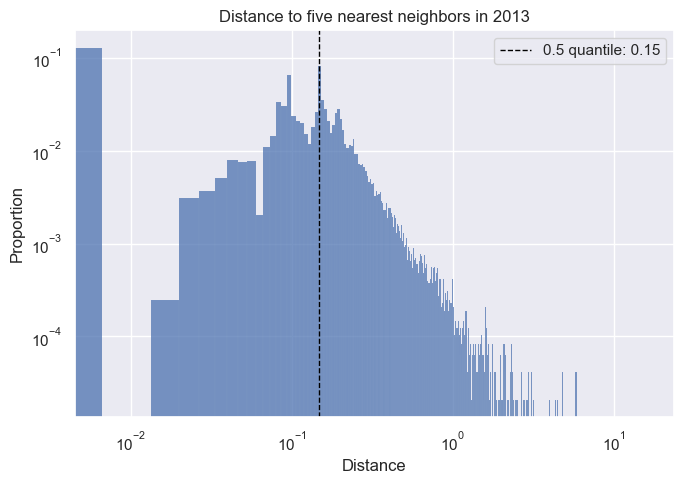

 47%|████████████████████▊                       | 9/19 [10:09<13:50, 83.09s/it]

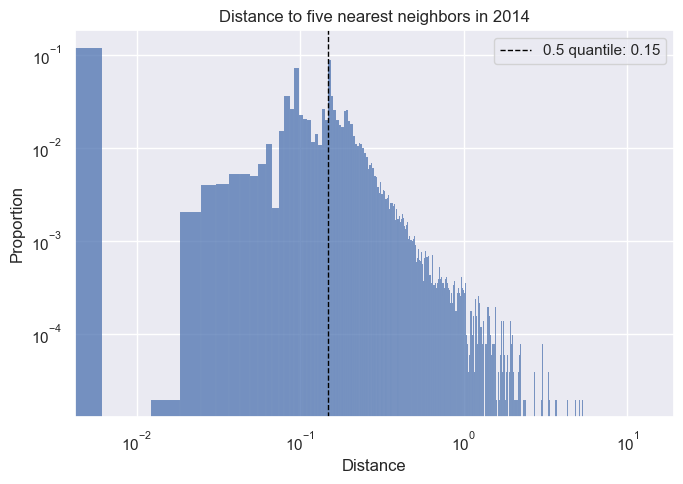

 53%|██████████████████████▋                    | 10/19 [11:51<13:22, 89.12s/it]

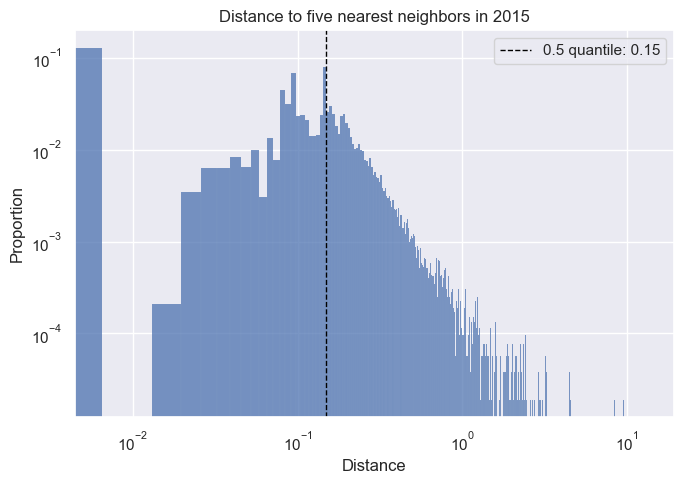

 58%|████████████████████████▉                  | 11/19 [13:38<12:36, 94.62s/it]

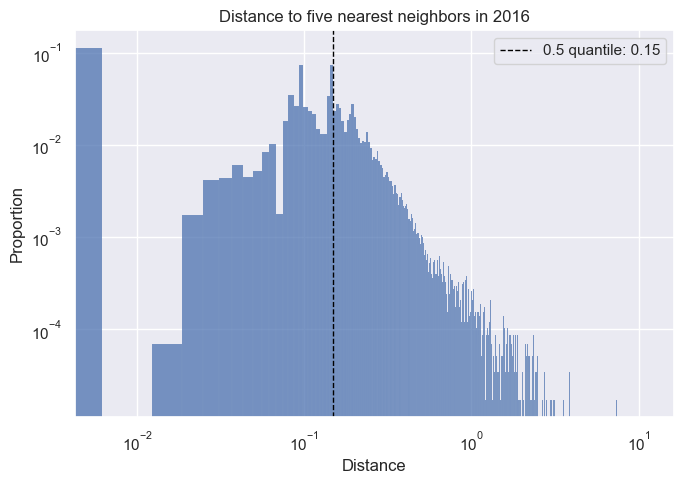

 63%|██████████████████████████▌               | 12/19 [15:37<11:52, 101.79s/it]

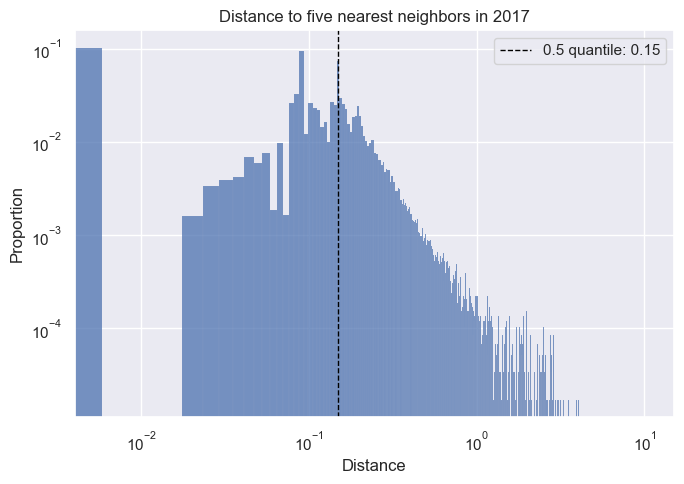

 68%|████████████████████████████▋             | 13/19 [17:39<10:47, 107.98s/it]

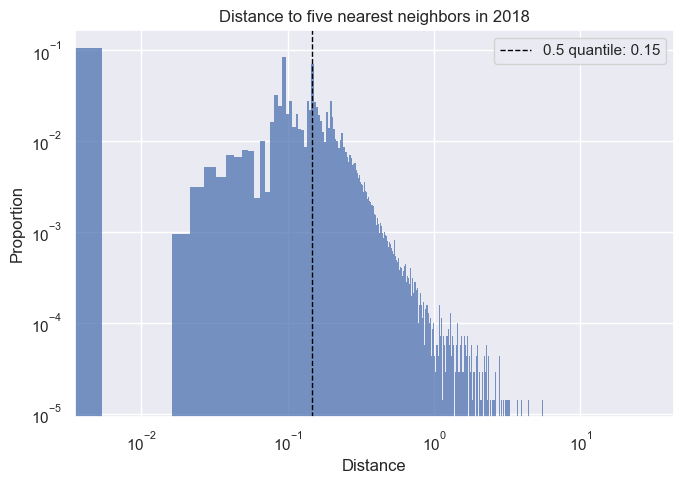

 74%|██████████████████████████████▉           | 14/19 [20:11<10:06, 121.22s/it]

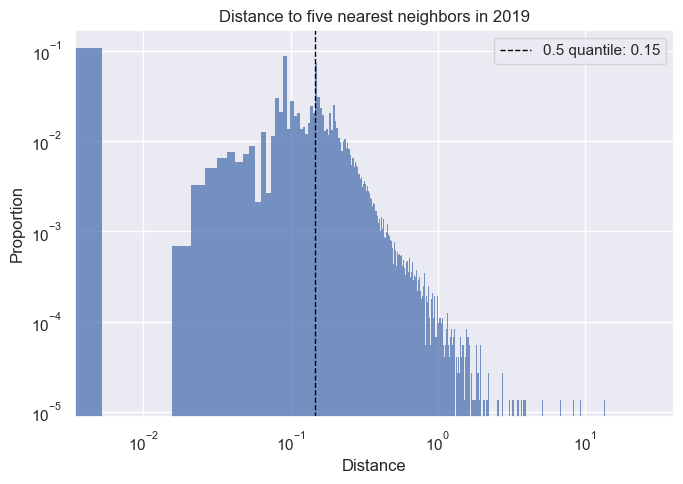

 79%|█████████████████████████████████▏        | 15/19 [22:51<08:52, 133.08s/it]

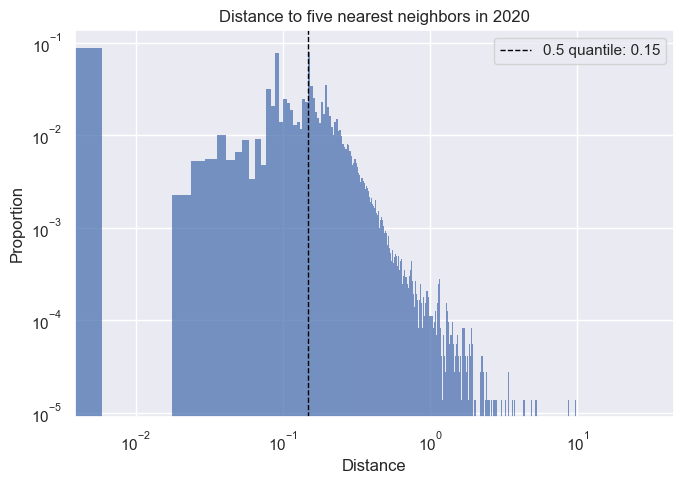

 84%|███████████████████████████████████▎      | 16/19 [25:27<06:59, 140.00s/it]

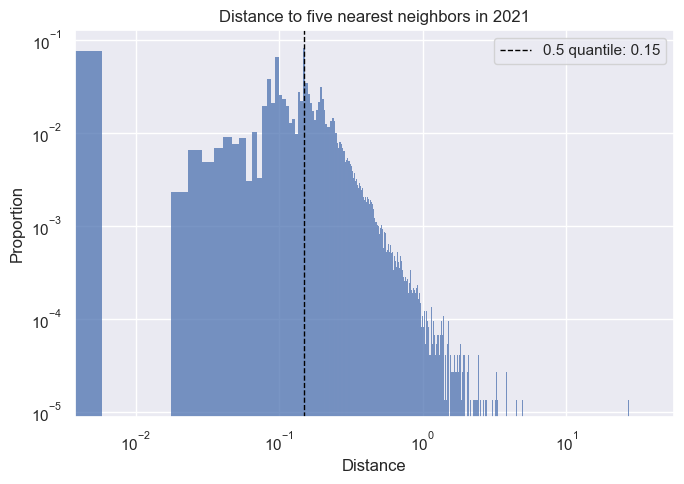

 89%|█████████████████████████████████████▌    | 17/19 [28:10<04:53, 146.73s/it]

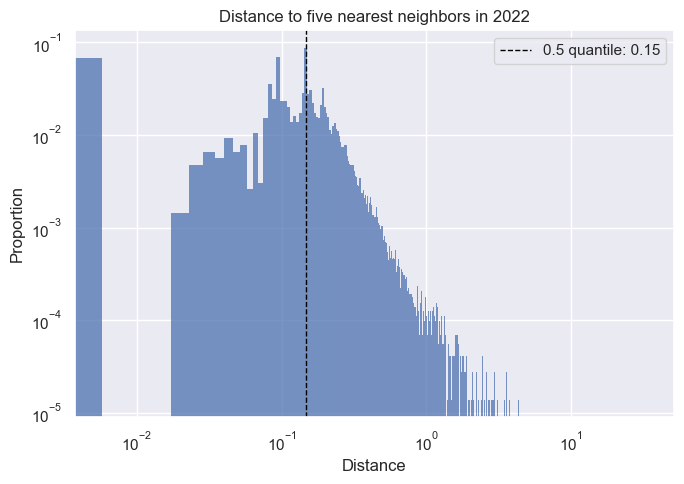

 95%|███████████████████████████████████████▊  | 18/19 [30:47<02:29, 150.00s/it]

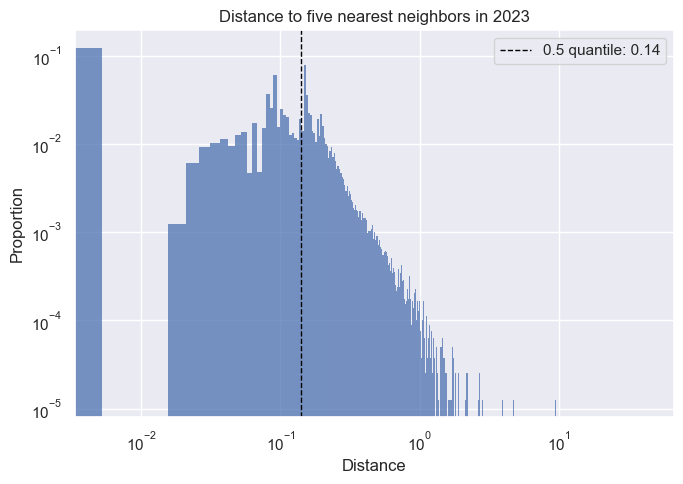

100%|██████████████████████████████████████████| 19/19 [33:44<00:00, 106.54s/it]


In [38]:
#likelihood_dict = KNN(oneHot_researchers, ['Seniority', 'CumulativePaperCount', 'Productivity'], 'Gender', ['Female', 'Male'], allCols, 5, 0.5, 1000)

In [39]:
likelihood_dict

{0: {'Year': 2005, 'Iteration': 0, 'Likelihood': 1.1268472906403941},
 1: {'Year': 2005, 'Iteration': 1, 'Likelihood': 1.7196428571428573},
 2: {'Year': 2005, 'Iteration': 2, 'Likelihood': 1.3700159489633175},
 3: {'Year': 2005, 'Iteration': 3, 'Likelihood': 1.3275862068965518},
 4: {'Year': 2005, 'Iteration': 4, 'Likelihood': 1.3810888252148998},
 5: {'Year': 2005, 'Iteration': 5, 'Likelihood': 1.2309782608695652},
 6: {'Year': 2005, 'Iteration': 6, 'Likelihood': 1.3550387596899227},
 7: {'Year': 2005, 'Iteration': 7, 'Likelihood': 1.9458874458874458},
 8: {'Year': 2005, 'Iteration': 8, 'Likelihood': 1.4985207100591715},
 9: {'Year': 2005, 'Iteration': 9, 'Likelihood': 1.3170409511228534},
 10: {'Year': 2005, 'Iteration': 10, 'Likelihood': 1.3881064162754306},
 11: {'Year': 2005, 'Iteration': 11, 'Likelihood': 1.6547842401500938},
 12: {'Year': 2005, 'Iteration': 12, 'Likelihood': 1.1617283950617283},
 13: {'Year': 2005, 'Iteration': 13, 'Likelihood': 1.4123563218390804},
 14: {'Year'

In [40]:
likelihood_df = pd.DataFrame.from_dict(likelihood_dict, orient='index')

In [41]:
likelihood_stats = pd.DataFrame.from_dict(avgRelativeLikelihood(likelihood_df), orient = 'index')

In [42]:
years = likelihood_stats.index.tolist()

In [43]:
#make plot as function, so we can try different Ks

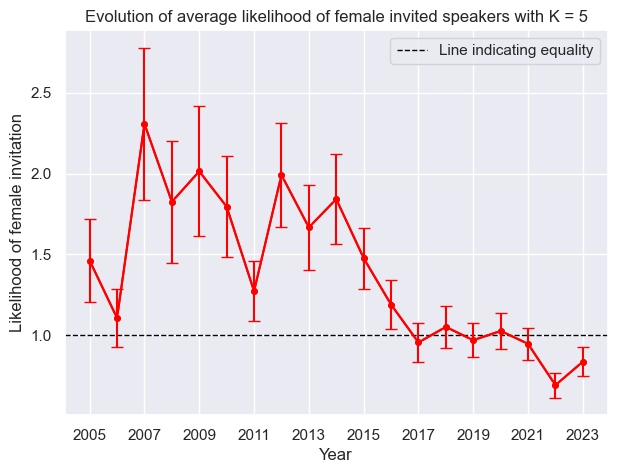

In [44]:
sns.lineplot(data = likelihood_stats, x = likelihood_stats.index, y = 'Avg_likelihood', marker = 'o', color = 'red')
plt.axhline(1, color = 'black', linewidth = 1, label = "Line indicating equality").set_linestyle("--")
plt.errorbar(x = likelihood_stats.index, y = likelihood_stats.Avg_likelihood, yerr = likelihood_stats.Std_likelihood, color = 'red', capsize = 4)
plt.legend()
plt.xticks(np.arange(min(years), max(years)+1, 2.0))
plt.xlabel('Year')
plt.ylabel('Likelihood of female invitation')
plt.title('Evolution of average likelihood of female invited speakers with K = 5')
plt.savefig("Figures/femaleLikelihood.png", bbox_inches='tight')
plt.show()

In [ ]:
#so there are fewer similar female researchers
#but do that actually make a lot of sense, because more are being invited.
#But not because they are similar to the males, but because they come with something different?

### Old code

In [ ]:
#old
def KNN(df, standardizeFeatures, groupFeature, groups, allFeatures, K, q, N): 
    likelihood_dict = {}
    index = 0
    KNN_researchers = df.copy()
    for c in standardizeFeatures:
        KNN_researchers[c] = standardizeColumn(KNN_researchers, c) #standardize data
    
    yearList = np.sort(KNN_researchers.Year.unique())
    for y in tqdm(yearList):
        year_df = KNN_researchers[KNN_researchers.Year == y] #get all data from year y
        group1 = year_df[year_df[groupFeature] == groups[0]].reset_index(drop = True)
        group2 = year_df[year_df[groupFeature] == groups[1]].reset_index(drop = True)
        
        #neighbors = NearestNeighbors(n_neighbors=K).fit(group1[allFeatures].to_numpy())
        n_oneHotFeatures = len(allFeatures) - len(standardizeFeatures) #number of features from one-hot encoding
        oneHot_weight = np.repeat(1/n_oneHotFeatures, n_oneHotFeatures) #weight for one-hot encoded features
        other_weight = np.repeat(1, len(standardizeFeatures)) #weight for the other features
        weights = np.hstack((oneHot_weight, other_weight)) 
        neighbors = NearestNeighbors(n_neighbors=K, metric='minkowski', p = 1.5, metric_params={'w': weights}, n_jobs = -1).fit(group1[allFeatures].to_numpy())
        kNeighbor_dist, kNeighbor_ind = neighbors.kneighbors(group2[allFeatures].to_numpy()) 
        
        threshold = np.quantile(kNeighbor_dist.flatten(), q) #q quantile
        indices = kNeighbor_ind.copy().astype(float) #get indices of five nearest neighbors of all males
        indices[~(kNeighbor_dist <= threshold)] = np.nan #set indices to nan if their distance is higher than the threshold
        
        plotYearlyDistances(kNeighbor_dist, threshold, y) #plot yearly distances
        
        for n in range(0,N):
            lh = likelihood(indices, group1, group2)
            likelihood_dict[index] = {'Year': y, 'Iteration': n, 'Likelihood': lh}
            index += 1
    
    #create df from likelihood_dict
    #also create more functions inside this one
        
    return likelihood_dict

In [ ]:
#test - delete
df = oneHot_researchers
standardizeFeatures = ['Seniority', 'CumulativePaperCount', 'Productivity']
groupFeature = 'Gender'
groups = ['Female', 'Male']
K = 5
allFeatures = allCols
t = np.repeat(1/32, 29)
other = np.repeat(1, len(standardizeFeatures))
weights = np.hstack((t, other)) 
#likelihood_dict = {}
    #index = 0
KNN_researchers = df.copy()
for c in standardizeFeatures:
    KNN_researchers[c] = standardizeColumn(KNN_researchers, c) #standardize data

yearList = np.sort(KNN_researchers.Year.unique())
y = 2005
year_df = KNN_researchers[KNN_researchers.Year == y] #get all data from year y
group1 = year_df[year_df[groupFeature] == groups[0]].reset_index(drop = True)
group2 = year_df[year_df[groupFeature] == groups[1]].reset_index(drop = True)

#neighbors = NearestNeighbors(n_neighbors=K, algorithm = 'brute', metric='wminkowski', p = 1.5, w = weights).fit(group1[allFeatures].to_numpy())
neighbors = NearestNeighbors(n_neighbors=K, metric='minkowski', p = 1.5, metric_params={'w': weights}, n_jobs = -1).fit(group1[allFeatures].to_numpy())



kNeighbor_dist, kNeighbor_ind = neighbors.kneighbors(group2[allFeatures].to_numpy()) 
     
#threshold = np.quantile(kNeighbor_dist.flatten(), q) #q quantile
    #   indices = kNeighbor_ind.copy().astype(float) #get indices of five nearest neighbors of all males
#    indices[~(kNeighbor_dist <= threshold)] = np.nan #set indices to nan if their distance is higher than the threshold
        
#     plotYearlyDistances(kNeighbor_dist, threshold, y) #plot yearly distances
        
#      for n in range(0,N):
#           lh = likelihood(indices, group1, group2)
#            likelihood_dict[index] = {'Year': y, 'Iteration': n, 'Likelihood': lh}
#            index += 1
        

In [10]:
def KNN(df, standardizeFeatures, allFeatures, K): #K for number of neighbors to find in KNN
    #standardize column and create new df with the standardized attributes
    KNN_dict = {}
    KNN_researchers = df.copy()
    for c in standardizeFeatures:
        KNN_researchers[c] = standardizeColumn(KNN_researchers, c)
    #invitedMales = KNN_researchers[(KNN_researchers.SessionType == 'invited') & (KNN_researchers.Gender == 'Male')]
    invitedSpeakers = KNN_researchers[KNN_researchers.SessionType == 'invited'] #invited speakers
    for i in tqdm(invitedSpeakers.index): #loop through index of invited speakers
        currentInvited = invitedSpeakers[invitedSpeakers.index == i] #current invited speaker
        currentInvited_name = currentInvited.SearchName[i]        
        year = currentInvited.Year[i] #find year of current invited speaker
        yearResearchers = KNN_researchers[KNN_researchers.Year == year]#find researchers within "current" year
        other = yearResearchers[yearResearchers.SearchName != currentInvited_name] #remove current researcher
        #KNN
        if K == "all": #when all neighbors should be found
            k = len(other)
        else:
            k = K
        #neighbors = NearestNeighbors(n_neighbors=K).fit(other)
        neighbors = NearestNeighbors(n_neighbors=k).fit(other[allFeatures].to_numpy())
        kNeighbor_dist, kNeighbor_ind = neighbors.kneighbors(currentInvited[allFeatures].to_numpy())
        #kNeighbor_dist, kNeighbor_ind = neighbors.kneighbors(currentInvited[allFeatures].to_numpy())
        neighbor_df = other.iloc[kNeighbor_ind[0]] #k nearest neighbors as df
        
        KNN_dict[i] = {'Name': currentInvited_name, 'Year': year, 'Gender': currentInvited.Gender.values[0], 'NeighborDistance': kNeighbor_dist[0], 'NeighborNames': list(neighbor_df.SearchName), 'NeighborGender': list(neighbor_df.Gender)}
    return KNN_dict
    #return yearResearchers

In [11]:
#test
#df = oneHot_researchers
#KNN_researchers = df.copy()
#standardizeFeatures = ['Seniority', 'CumulativePaperCount', 'Productivity']
#allFeatures = allCols
#for c in standardizeFeatures:
#    KNN_researchers[c] = standardizeColumn(KNN_researchers, c)
#invitedSpeakers = KNN_researchers[KNN_researchers.SessionType == 'invited'] #invited speakers
#i = 46
#currentInvited = invitedSpeakers[invitedSpeakers.index == i] #current invited speaker
#currentInvited_name = currentInvited.SearchName[i]
#year = currentInvited.Year[i] #find year of current invited speaker
#yearResearchers = KNN_researchers[KNN_researchers.Year == year]#find researchers within "current" year
#other = yearResearchers[yearResearchers.SearchName != currentInvited_name] #remove current researcher
#neighbors = NearestNeighbors(n_neighbors=len(other)).fit(other[allFeatures].to_numpy())
#kNeighbor_dist, kNeighbor_ind = neighbors.kneighbors(currentInvited[allFeatures].to_numpy())
#other.iloc[kNeighbor_ind[0]]
#kNeighbor_dist, kNeighbor_ind

In [12]:
allCols = knownUnits
allCols += ['Seniority', 'CumulativePaperCount', 'Productivity']

In [13]:
KNN_dict = KNN(oneHot_researchers, ['Seniority', 'CumulativePaperCount', 'Productivity'], allCols, "all")

100%|█████████████████████████████████████| 12725/12725 [10:38<00:00, 19.94it/s]


In [14]:
KNN_df = pd.DataFrame.from_dict(KNN_dict, orient='index').explode(['NeighborDistance', 'NeighborNames', 'NeighborGender']).reset_index()

In [18]:
KNN_dfList = pd.DataFrame.from_dict(KNN_dict, orient='index')

In [50]:
distance_df = pd.DataFrame()
distance_df['Year'] = KNN_dfList['Year']

In [51]:
distance_df['Min'] = KNN_dfList.NeighborDistance.apply(lambda x: min(x))
distance_df['Max'] = KNN_dfList.NeighborDistance.apply(lambda x: max(x))

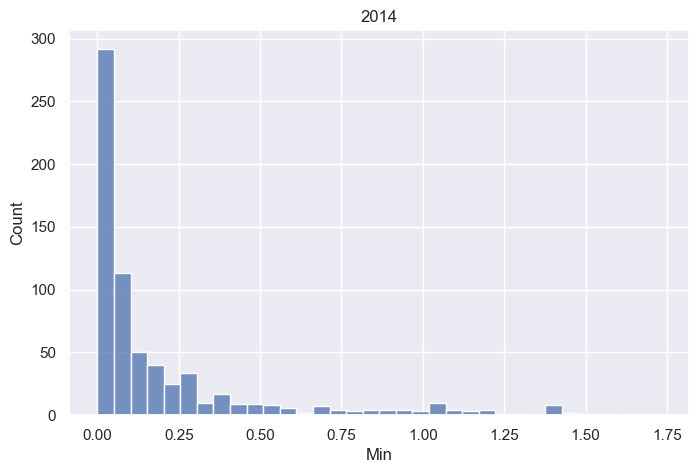

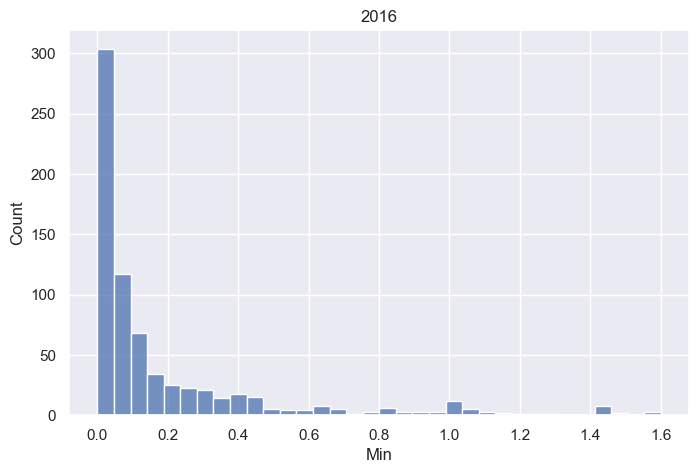

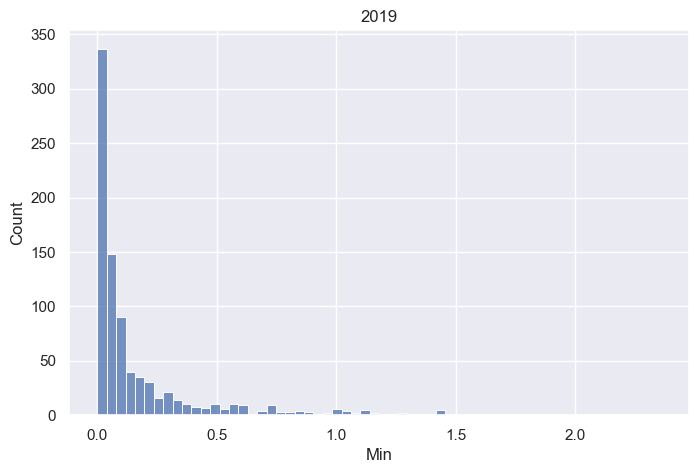

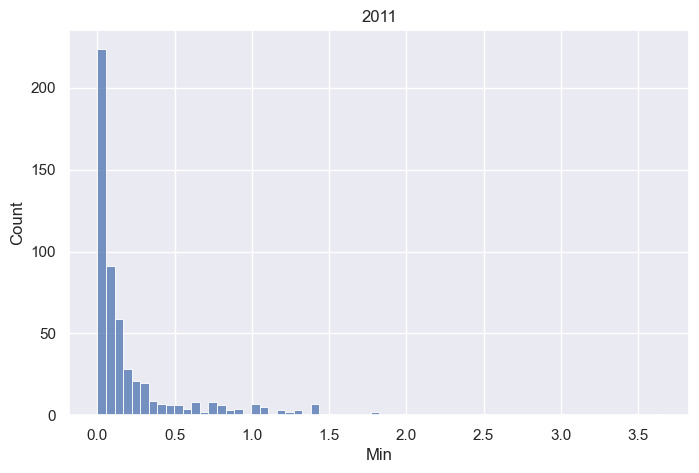

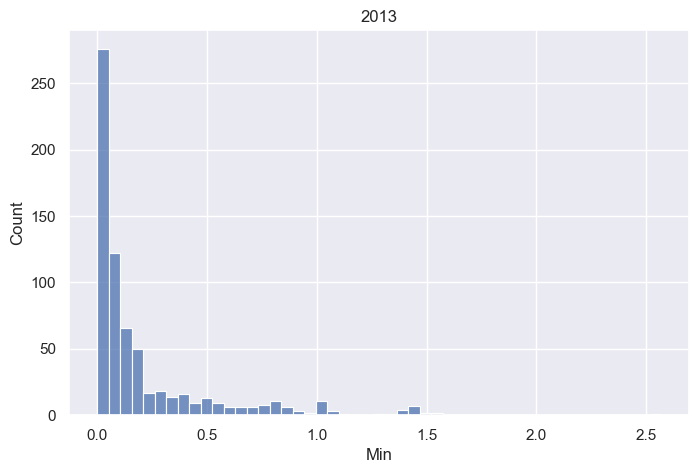

...

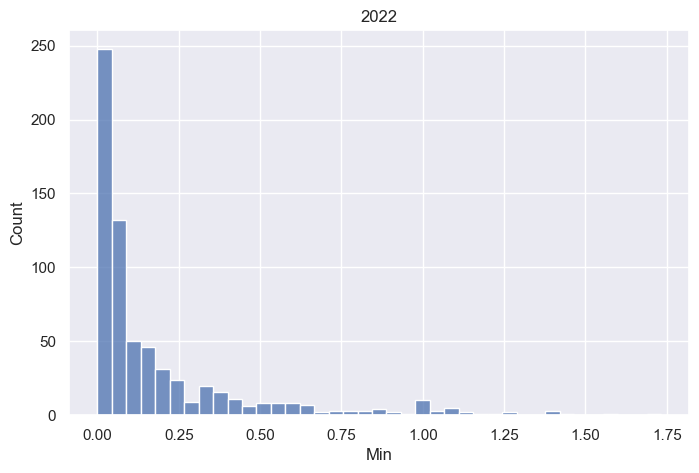

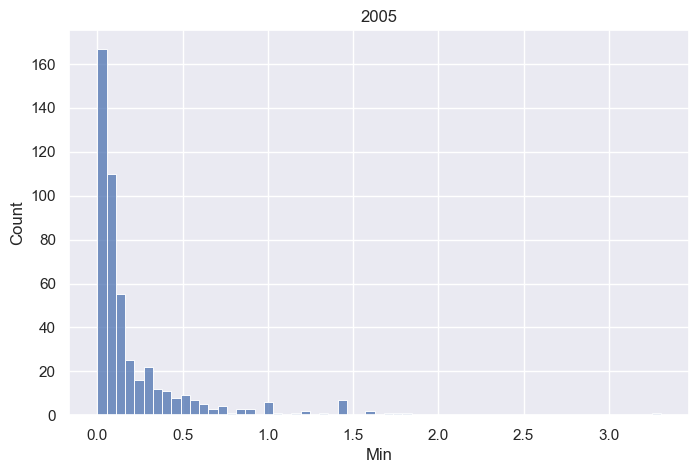

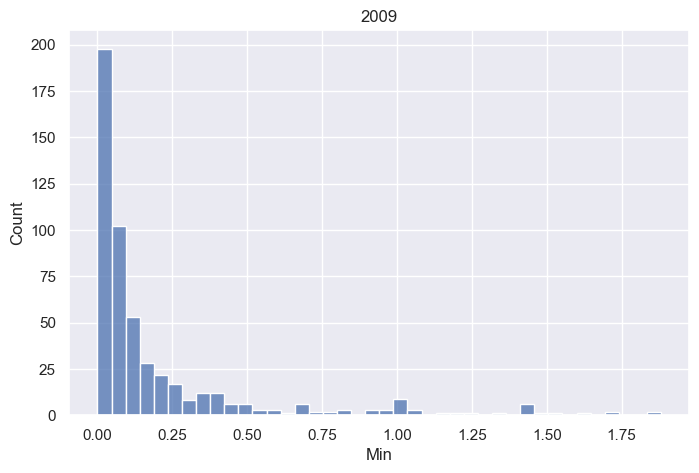

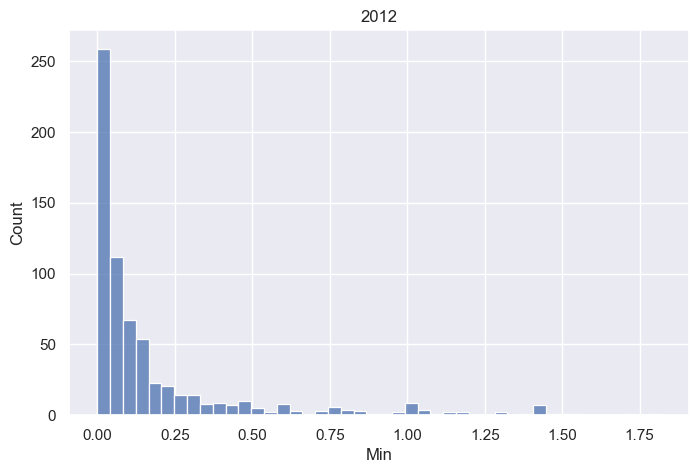

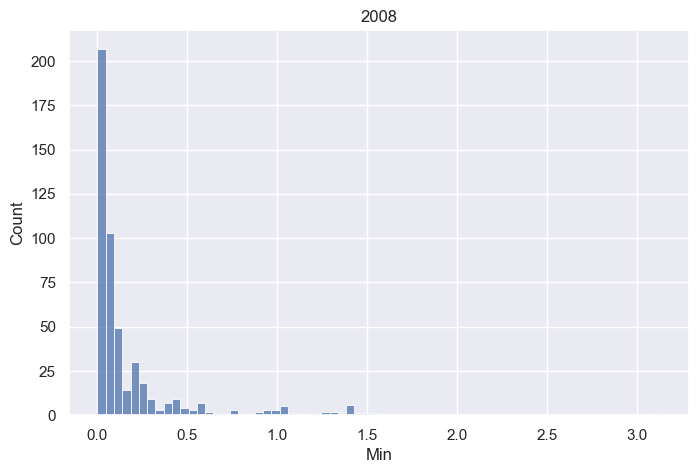

In [89]:
years = distance_df.Year.unique()
for y in years:
    df = distance_df[distance_df.Year == y]
    plt.figure()
    plt.tight_layout()
    sns.set(rc={"figure.figsize":(8, 5)})
    plt.title(y)
    sns.histplot(df, x = 'Min')

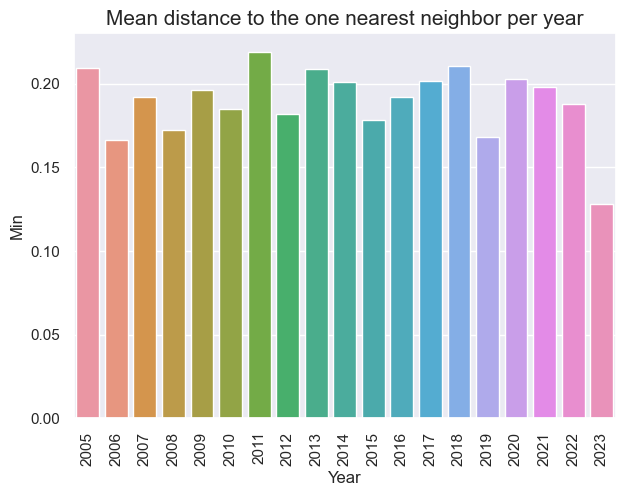

In [69]:
avgTable = distance_df.groupby('Year').mean().reset_index()
sns.barplot(data = avgTable, x = 'Year', y = 'Min')
plt.xticks(rotation=90)
plt.title("Mean distance to the one nearest neighbor per year", fontsize = 15)
plt.show()

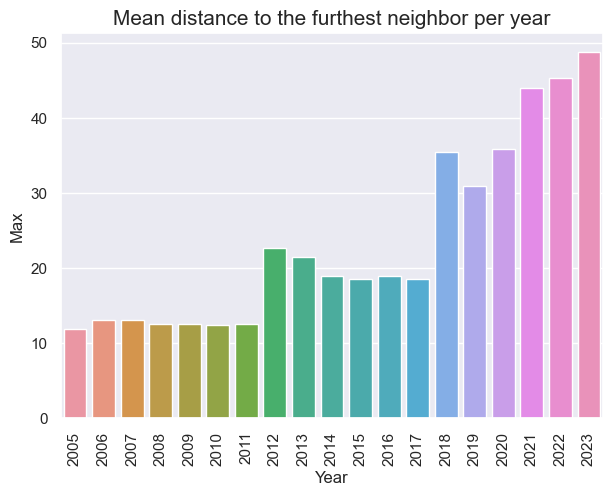

In [70]:
avgTable = distance_df.groupby('Year').mean().reset_index()
sns.barplot(data = avgTable, x = 'Year', y = 'Max')
plt.title("Mean distance to the furthest neighbor per year", fontsize = 15)
plt.xticks(rotation=90)
plt.show()

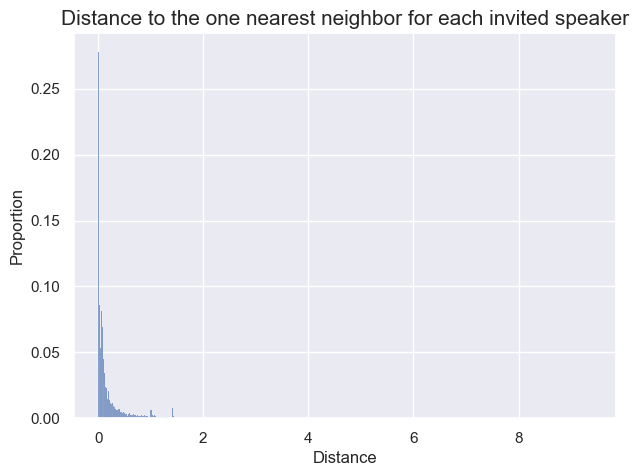

In [56]:
sns.histplot(data = distance_df, x = 'Min', stat = 'proportion')
plt.xlabel('Distance')
plt.title("Distance to the one nearest neighbor for each invited speaker", fontsize = 15)
#plt.savefig("Figures/title", bbox_inches='tight')
plt.show()

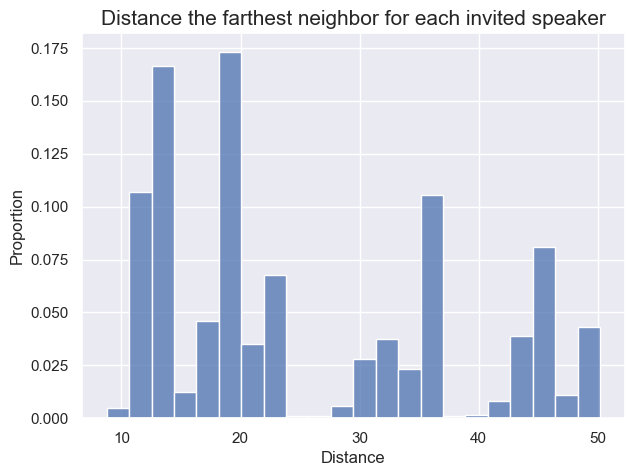

In [55]:
sns.histplot(data = distance_df, x = 'Max', stat = 'proportion')
plt.xlabel('Distance')
plt.title("Distance the farthest neighbor for each invited speaker", fontsize = 15)
#plt.savefig("Figures/title", bbox_inches='tight')
plt.show()

<AxesSubplot:xlabel='NeighborDistance', ylabel='Count'>

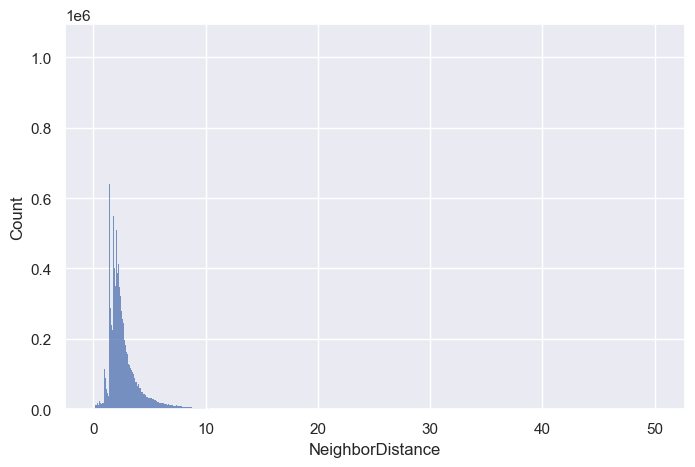

In [90]:
sns.histplot(data = KNN_df, x = 'NeighborDistance')
plt.show()

KeyboardInterrupt: 

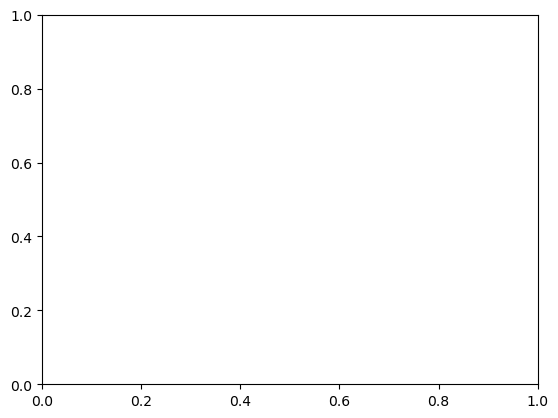

In [20]:
sns.histplot(data = KNN_df, x = 'Neighbor distance', bins = 10)

In [8]:
distance_table = KNN_df.groupby('Neighbor distance').count()

In [9]:
distanceCount = distance_table.reset_index()
distanceCount

,Neighbor distance,Name,Year,Neighbor index
0,0.000000e+00,372339,372339,372339
1,9.313226e-10,7,7,7
2,1.317089e-09,9,9,9
3,1.862645e-09,28,28,28
4,2.634178e-09,73,73,73
...,...,...,...,...
21395540,4.975554e+01,1,1,1
21395541,4.984776e+01,1,1,1
21395542,4.996473e+01,1,1,1
21395543,5.006720e+01,1,1,1


In [19]:
researchers.drop_duplicates(subset = ['Seniority', 'CumulativePaperCount', 'Productivity'])[['Seniority', 'CumulativePaperCount', 'Productivity']].max()

Seniority               218.000000
CumulativePaperCount    500.000000
Productivity            164.666667
dtype: float64

In [21]:
researchers[researchers.Seniority >= 100]

,SearchName,FirstName,ResearcherCount,MaxPaperCount,API_Field,API_FieldCount,ExternalField,ModelField,ExternalFieldCount,ModelFieldCount,...,Title,SponsoringUnit,SessionIndex,SessionType,Seniority,CumulativePaperCount,Productivity,firstName,Gender,AssignedSponsoringUnit
347,felix krueger,felix,12,33,Philosophy,7,Philosophy,History,7,1,...,Inference of emergent spatio-temporal processe...,DBIO,127935.0,attendee,120,19,0.158333,felix,Male,Biological Physics
651,pablo iglesias,pablo,107,6,Engineering,2,Engineering,Engineering,2,1,...,A modular view of directed cell migration,DCMP GSNP,128469.0,invited,120,1,0.008333,pablo,Male,None
855,hisao kanda,hisao,5,210,Materials Science,112,Materials Science,Materials Science,112,193,...,Pressure dependence of the first-order Raman f...,DCMP DMP,11195.0,attendee,100,166,1.660000,hisao,Male,None
1834,crispin contreras-martinez,crispin,2,22,Physics,13,Physics,Physics,13,21,...,Characterization of losses in dielectric subst...,DQI,11247.0,attendee,123,17,0.138211,crispin,Male,Quantum Information
1835,yuriy pischalnikov,yuriy,5,199,Physics,129,Physics,Physics,129,190,...,Characterization of losses in dielectric subst...,DQI,11247.0,attendee,123,189,1.536585,yuriy,Male,Quantum Information
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
553732,pascoal pagliuso,pascoal,4,342,Physics,170,Physics,Physics,170,330,...,Structural and Physical Properties of CeAu2Bi:...,DCMP,135588.0,attendee,119,299,2.512605,pascoal,Male,Condensed Matter Physics
553733,pascoal pagliuso,pascoal,4,342,Physics,170,Physics,Physics,170,330,...,The Role of the Relaxation Rate of Nematic Flu...,DMP,142351.0,attendee,118,286,2.423729,pascoal,Male,Materials Physics
553735,pascoal pagliuso,pascoal,4,342,Physics,170,Physics,Physics,170,330,...,Complex magnetism in novel intermetallic compo...,DCMP,170995.0,attendee,123,336,2.731707,pascoal,Male,Condensed Matter Physics
553934,james martin,james,1275,3,Medicine,2,Medicine,Medicine,2,3,...,Dynamics of particle suspensions subjected to ...,DCMP,80671.0,invited,109,3,0.027523,james,Male,Condensed Matter Physics


In [ ]:
sns.barplot(data = distanceCount, x = 'Neighbor distance', y = 'Name')

In [ ]:
#now plot the distances from KNN_dict.
#Find a way to also check for individual distances. How much do they vary(variance)?
#Find a way to check for differences in differen years. Maybe a histogram for each year, or do year as hue

In [92]:
neighbors = NearestNeighbors(n_neighbors=10, metric = 'euclidean')
neighbors.fit(data)

knn = neighbors.kneighbors(researcher.reshape(1, -1))

NameError: name 'data' is not defined

In [91]:
test_df[['Seniority', 'CumulativePaperCount', 'Productivity']]

,Seniority,CumulativePaperCount,Productivity
2,2,2,1.000000
8,16,4,0.250000
111,43,104,2.418605
262,6,4,0.666667
264,2,1,0.500000
...,...,...,...
553878,25,15,0.600000
553921,37,20,0.540541
554146,15,46,3.066667
554174,7,3,0.428571


In [105]:
data = KNN_researchers[['Seniority', 'CumulativePaperCount', 'Productivity']]
researcher = KNN_researchers[KNN_researchers.SessionType == 'invited'][['Seniority', 'CumulativePaperCount', 'Productivity']].iloc[0].to_numpy().reshape(1, -1)

In [128]:
neighbors = NearestNeighbors(n_neighbors=10, metric = 'manhattan')
neighbors.fit(data)

NearestNeighbors(metric='manhattan', n_neighbors=10)

In [129]:
knn = neighbors.kneighbors(researcher.reshape(1, -1))

/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(


In [130]:
knn

(array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]),
 array([[3406, 3583, 2282, 3576, 3464, 3473,    2,  135,  305,   52]]))

In [131]:
researcher

array([[-0.88210549, -0.51229433, -0.3393391 ]])

In [109]:
KNN_researchers.iloc[3406]

SearchName                                                         steve barr
FirstName                                                               steve
ResearcherCount                                                            11
MaxPaperCount                                                               2
API_Field                                               Environmental Science
API_FieldCount                                                              1
ExternalField                                           Environmental Science
ModelField                                              Environmental Science
ExternalFieldCount                                                          1
ModelFieldCount                                                             2
FirstPaperYear                                                           2008
Year                                                                     2010
Name                                                            

NearestNeighbors(n_neighbors=10)

In [80]:
knn = NearestNeighbors(n_neighbors=10, algorithm='auto')
knn.fit(KNN_researchers[['Seniority', 'CumulativePaperCount', 'Productivity']].to_numpy())

NearestNeighbors(n_neighbors=10)

In [ ]:
##do knn with one invited male speaker(for one year)


X = np.array([[-1, -1], [-2, -1], [-3, -2], [1, 1], [2, 1], [3, 2]])
>>> nbrs = NearestNeighbors(n_neighbors=2, algorithm='ball_tree').fit(X)
>>> distances, indices = nbrs.kneighbors(X)